In [4]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from MLmodels1pt import myLinearRegressionModel, myLogisticRegressionModel, dilatedCNNModel
import matplotlib.pyplot as plt


# magnetization for a snapshot

<>:110: SyntaxWarning: invalid escape sequence '\m'
<>:110: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_1613636/3038059695.py:110: SyntaxWarning: invalid escape sequence '\m'
  label="${\\rm \mathbb{E}}[Z_j|\\bf{s}]$",


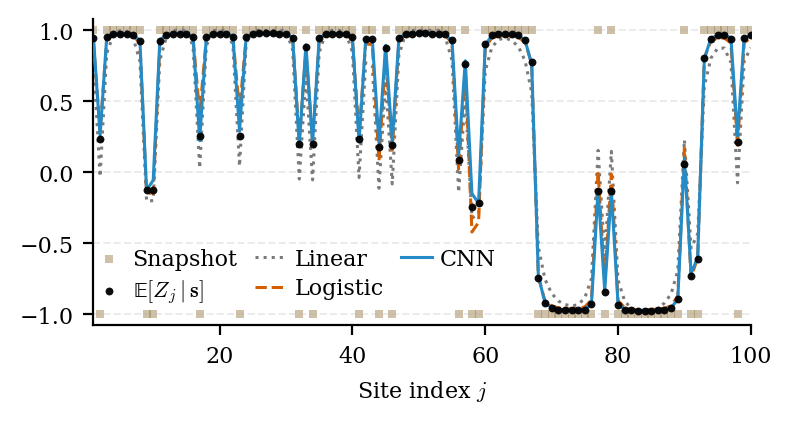

In [272]:
L = 100
beta = 0.5
N = 100000
# measurement outcome from training set
s = [1, -1, 1, 1, 1, 1, 1, 1, -1, -1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, -1, 1, 1, 1, 1, 1, 1, -1, 1, 1, -1, 1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, -1, -1, 1, 1, 1, 1, 1, 1, 1, 1, -1, -1, -1, -1, -1, -1, -1, -1, -1, 1, -1, 1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, 1, -1, -1, 1, 1, 1, 1, 1, -1, 1, 1]

Zexp = [0.9482362036114398, 0.23726664087863517, 0.951143756044781, 0.9744796335090715, 0.9767762113870042, 0.9761391867035544, 0.970431142602581, 0.9220727064712133, -0.1257287648832543, -0.12541858211094112, 0.9225576299527822, 0.970746008454795, 0.9764438016700304, 0.9771918802575102, 0.9752855562190098, 0.953759864604575, 0.25181577412216183, 0.9538846775353867, 0.9754008089529851, 0.9772362561824438, 0.9754544508305469, 0.9541277882993091, 0.25335247377280334, 0.9542786315895514, 0.9756728473256505, 0.9778268125859532, 0.9781609739695802, 0.978105707217673, 0.9775763753908869, 0.9746607856682393, 0.9483380395909897, 0.19712765258496942, 0.88453859463925, 0.19675073135858864, 0.9481276072398767, 0.9744908914261697, 0.9773054603423872, 0.9773855426186121, 0.9750009619391645, 0.9516525902719117, 0.23445250802625794, 0.9404425080744849, 0.9355556358096131, 0.17910968377205852, 0.8776551631337357, 0.1888001814810263, 0.9468195742940898, 0.9741829990316342, 0.9772823005935731, 0.9778252085550106, 0.9778432040419444, 0.9775286790610265, 0.976392345215821, 0.9712241549988658, 0.9325307502553011, 0.0872344622195817, 0.7658717958039966, -0.24713530308096313, -0.21815734832214895, 0.9017156800182479, 0.9642340166564863, 0.9726581033482748, 0.9735924617233763, 0.9715942520220509, 0.9641418744114274, 0.9345743758569875, 0.7745524371295222, -0.7437776447588489, -0.9226493848561353, -0.9588483329410498, -0.9688228401699718, -0.9722823696502053, -0.9734634825904503, -0.9729825537829446, -0.968086687106486, -0.9318587419952717, -0.13135252995543958, -0.844446035241192, -0.13440649651053685, -0.9337352475966411, -0.9693888707555797, -0.9743633275010034, -0.9753693967200323, -0.9754006497301557, -0.9748773337670862, -0.9735256870701442, -0.9699248637506712, -0.9573600640676809, -0.8903964036372046, 0.05803075805834255, -0.729997722318278, -0.608258618645825, 0.8066167734398423, 0.9411576656263829, 0.9647662015524862, 0.9674673521098078, 0.9425299970511741, 0.2160035079710859, 0.9450939242826669, 0.9687333096402221]
from pathlib import Path
x_input = np.asarray(s, dtype=np.float32).reshape(1, -1)
y_pred = {}
# Prefer in-memory fitted models from the full-data training cell.
if "models_all" in globals() and isinstance(models_all, dict):
    for name in ["Linear", "Logistic", "CNN"]:
        mdl = models_all.get(name, None)
        if mdl is not None and hasattr(mdl, "predict_magnetization"):
            y_pred[name] = mdl.predict_magnetization(x_input)[0]
# Fallback: load saved models if needed.
save_dir = Path("../data")
lin_path = save_dir / f"linear_sharedpbc_L{L}_beta{beta}_N{N}.pkl"
log_path = save_dir / f"logistic_sharedpbc_L{L}_beta{beta}_N{N}.pkl"
cnn_path = save_dir / f"dilatedcnn_sharedpbc_L{L}_beta{beta}_N{N}.pt"
if "Linear" not in y_pred:
    if not lin_path.exists():
        raise FileNotFoundError(f"Linear checkpoint not found: {lin_path}")
    lin_model = myLinearRegressionModel.load(lin_path)
    y_pred["Linear"] = lin_model.predict_magnetization(x_input)[0]
if "Logistic" not in y_pred:
    if not log_path.exists():
        raise FileNotFoundError(f"Logistic checkpoint not found: {log_path}")
    log_model = myLogisticRegressionModel.load(log_path)
    y_pred["Logistic"] = log_model.predict_magnetization(x_input)[0]
if "CNN" not in y_pred:
    if not cnn_path.exists():
        raise FileNotFoundError(f"CNN checkpoint not found: {cnn_path}")
    cnn_model = dilatedCNNModel.load(cnn_path, map_location="cpu")
    y_pred["CNN"] = cnn_model.predict_magnetization(x_input)[0]
z_true = np.asarray(Zexp, dtype=np.float32)
rmse_linear = float(np.sqrt(np.mean((y_pred["Linear"] - z_true) ** 2)))
rmse_logistic = float(np.sqrt(np.mean((y_pred["Logistic"] - z_true) ** 2)))
rmse_cnn = float(np.sqrt(np.mean((y_pred["CNN"] - z_true) ** 2)))
site = np.arange(1, len(s) + 1)

plt.rcParams.update({
    "font.size": 8,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman", "CMU Serif", "DejaVu Serif"],
    "mathtext.fontset": "cm",
    "axes.labelsize": 8,
    "legend.fontsize": 8,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
})

colors = {
    "snapshot": "#8C6D31",
    "linear": "#7A7A7A",
    "logistic": "#D55E00",
    "cnn": "#248BC7",
    "truth": "#000000",
}

fig, ax = plt.subplots(figsize=(4, 3), dpi=200)

snapshot_handle = ax.scatter(
    site,
    s,
    marker="s",
    s=8,
    color=colors["snapshot"],
    alpha=0.42,
    linewidths=0,
    rasterized=True,
    label="Snapshot $s_j$",
    zorder=1,
)
linear_handle, = ax.plot(
    site,
    y_pred["Linear"],
    linestyle=":",
    linewidth=1.1,
    color=colors["linear"],
    label=f"Linear Regression",
    zorder=2,
)
logistic_handle, = ax.plot(
    site,
    y_pred["Logistic"],
    linestyle="--",
    linewidth=1.1,
    color=colors["logistic"],
    label=f"Logistic Regression",
    zorder=3,
)
cnn_handle, = ax.plot(
    site,
    y_pred["CNN"],
    linestyle="-",
    linewidth=1.1,
    color=colors["cnn"],
    label=f"Dilated CNN",
    zorder=4,
)
target_handle = ax.scatter(
    site,
    z_true,
    s=8,
    color=colors["truth"],
    alpha=0.95,
    linewidths=0,
    label="${\\rm \mathbb{E}}[Z_j|\\bf{s}]$",
    zorder=5,
)

ax.set_xlim(1, len(s))
ax.set_ylim(-1.08, 1.08)
ax.set_xlabel(r"Site index $j$")
# ax.set_ylabel("Magnetization")
ax.set_yticks([-1.0, -0.5, 0.0, 0.5, 1.0])
ax.grid(axis="y", linestyle="--", linewidth=0.7, alpha=0.25)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(
    [snapshot_handle, target_handle, linear_handle, logistic_handle, cnn_handle],
    ["Snapshot", r"${\rm \mathbb{E}}[Z_j\mid \mathbf{s}]$", "Linear", "Logistic", "CNN"],
    loc="lower left",
    bbox_to_anchor=(-0.03, 0.),
    ncol=3,
    frameon=False,
    columnspacing=0.8,
    handlelength=1.4,
    handletextpad=0.35,
    labelspacing=0.35,
)

fig.tight_layout(rect=[0, 0, 1, 0.72])
fig.savefig("figures/magnetization_prediction_comparison.pdf", dpi=300, bbox_inches="tight", pad_inches=0)
plt.show()


<>:110: SyntaxWarning: invalid escape sequence '\m'
<>:110: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_34326/1296648358.py:110: SyntaxWarning: invalid escape sequence '\m'
  label="${\\rm \mathbb{E}}[Z_j|\\bf{s}]$",


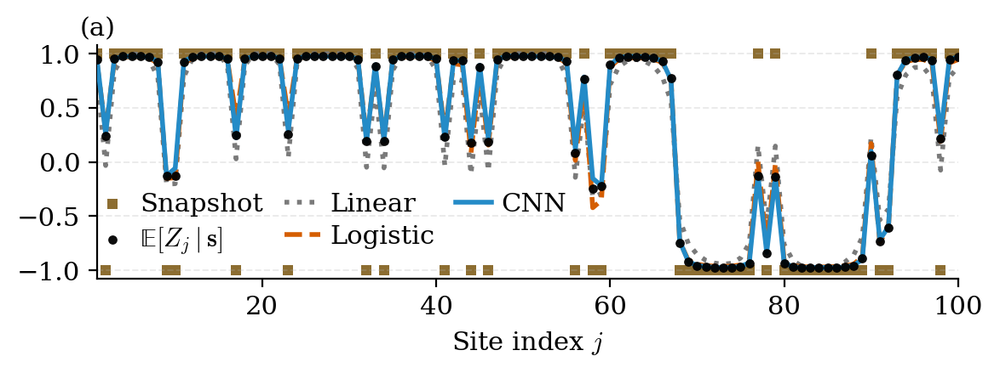

In [88]:
L = 100
beta = 0.5
N = 100000
# measurement outcome from training set
s = [1, -1, 1, 1, 1, 1, 1, 1, -1, -1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, -1, 1, 1, 1, 1, 1, 1, -1, 1, 1, -1, 1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, -1, -1, 1, 1, 1, 1, 1, 1, 1, 1, -1, -1, -1, -1, -1, -1, -1, -1, -1, 1, -1, 1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, 1, -1, -1, 1, 1, 1, 1, 1, -1, 1, 1]

Zexp = [0.9482362036114398, 0.23726664087863517, 0.951143756044781, 0.9744796335090715, 0.9767762113870042, 0.9761391867035544, 0.970431142602581, 0.9220727064712133, -0.1257287648832543, -0.12541858211094112, 0.9225576299527822, 0.970746008454795, 0.9764438016700304, 0.9771918802575102, 0.9752855562190098, 0.953759864604575, 0.25181577412216183, 0.9538846775353867, 0.9754008089529851, 0.9772362561824438, 0.9754544508305469, 0.9541277882993091, 0.25335247377280334, 0.9542786315895514, 0.9756728473256505, 0.9778268125859532, 0.9781609739695802, 0.978105707217673, 0.9775763753908869, 0.9746607856682393, 0.9483380395909897, 0.19712765258496942, 0.88453859463925, 0.19675073135858864, 0.9481276072398767, 0.9744908914261697, 0.9773054603423872, 0.9773855426186121, 0.9750009619391645, 0.9516525902719117, 0.23445250802625794, 0.9404425080744849, 0.9355556358096131, 0.17910968377205852, 0.8776551631337357, 0.1888001814810263, 0.9468195742940898, 0.9741829990316342, 0.9772823005935731, 0.9778252085550106, 0.9778432040419444, 0.9775286790610265, 0.976392345215821, 0.9712241549988658, 0.9325307502553011, 0.0872344622195817, 0.7658717958039966, -0.24713530308096313, -0.21815734832214895, 0.9017156800182479, 0.9642340166564863, 0.9726581033482748, 0.9735924617233763, 0.9715942520220509, 0.9641418744114274, 0.9345743758569875, 0.7745524371295222, -0.7437776447588489, -0.9226493848561353, -0.9588483329410498, -0.9688228401699718, -0.9722823696502053, -0.9734634825904503, -0.9729825537829446, -0.968086687106486, -0.9318587419952717, -0.13135252995543958, -0.844446035241192, -0.13440649651053685, -0.9337352475966411, -0.9693888707555797, -0.9743633275010034, -0.9753693967200323, -0.9754006497301557, -0.9748773337670862, -0.9735256870701442, -0.9699248637506712, -0.9573600640676809, -0.8903964036372046, 0.05803075805834255, -0.729997722318278, -0.608258618645825, 0.8066167734398423, 0.9411576656263829, 0.9647662015524862, 0.9674673521098078, 0.9425299970511741, 0.2160035079710859, 0.9450939242826669, 0.9687333096402221]
from pathlib import Path
x_input = np.asarray(s, dtype=np.float32).reshape(1, -1)
y_pred = {}
# Prefer in-memory fitted models from the full-data training cell.
if "models_all" in globals() and isinstance(models_all, dict):
    for name in ["Linear", "Logistic", "CNN"]:
        mdl = models_all.get(name, None)
        if mdl is not None and hasattr(mdl, "predict_magnetization"):
            y_pred[name] = mdl.predict_magnetization(x_input)[0]
# Fallback: load saved models if needed.
save_dir = Path("../data")
lin_path = save_dir / f"linear_sharedpbc_L{L}_beta{beta}_N{N}.pkl"
log_path = save_dir / f"logistic_sharedpbc_L{L}_beta{beta}_N{N}.pkl"
cnn_path = save_dir / f"dilatedcnn_sharedpbc_L{L}_beta{beta}_N{N}.pt"
if "Linear" not in y_pred:
    if not lin_path.exists():
        raise FileNotFoundError(f"Linear checkpoint not found: {lin_path}")
    lin_model = myLinearRegressionModel.load(lin_path)
    y_pred["Linear"] = lin_model.predict_magnetization(x_input)[0]
if "Logistic" not in y_pred:
    if not log_path.exists():
        raise FileNotFoundError(f"Logistic checkpoint not found: {log_path}")
    log_model = myLogisticRegressionModel.load(log_path)
    y_pred["Logistic"] = log_model.predict_magnetization(x_input)[0]
if "CNN" not in y_pred:
    if not cnn_path.exists():
        raise FileNotFoundError(f"CNN checkpoint not found: {cnn_path}")
    cnn_model = dilatedCNNModel.load(cnn_path, map_location="cpu")
    y_pred["CNN"] = cnn_model.predict_magnetization(x_input)[0]
z_true = np.asarray(Zexp, dtype=np.float32)
rmse_linear = float(np.sqrt(np.mean((y_pred["Linear"] - z_true) ** 2)))
rmse_logistic = float(np.sqrt(np.mean((y_pred["Logistic"] - z_true) ** 2)))
rmse_cnn = float(np.sqrt(np.mean((y_pred["CNN"] - z_true) ** 2)))
site = np.arange(1, len(s) + 1)

plt.rcParams.update({
    "font.size": 11,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman", "CMU Serif", "DejaVu Serif"],
    "mathtext.fontset": "cm",
    "axes.labelsize": 11,
    "legend.fontsize": 11,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
})

colors = {
    "snapshot": "#8C6D31",
    "linear": "#7A7A7A",
    "logistic": "#D55E00",
    "cnn": "#248BC7",
    "truth": "#000000",
}

fig, ax = plt.subplots(figsize=(6, 3), dpi=200)

snapshot_handle = ax.scatter(
    site,
    s,
    marker="s",
    s=20,
    color=colors["snapshot"],
    alpha=1,
    linewidths=0,
    rasterized=True,
    label="Snapshot $s_j$",
    zorder=1,
)
linear_handle, = ax.plot(
    site,
    y_pred["Linear"],
    linestyle=":",
    linewidth=2,
    color=colors["linear"],
    label=f"Linear Regression",
    zorder=2,
)
logistic_handle, = ax.plot(
    site,
    y_pred["Logistic"],
    linestyle="--",
    linewidth=2,
    color=colors["logistic"],
    label=f"Logistic Regression",
    zorder=3,
)
cnn_handle, = ax.plot(
    site,
    y_pred["CNN"],
    linestyle="-",
    linewidth=2,
    color=colors["cnn"],
    label=f"Dilated CNN",
    zorder=4,
)
target_handle = ax.scatter(
    site,
    z_true,
    s=15,
    color=colors["truth"],
    alpha=0.95,
    linewidths=0,
    label="${\\rm \mathbb{E}}[Z_j|\\bf{s}]$",
    zorder=5,
)

ax.set_xlim(1, len(s))
ax.set_ylim(-1.08, 1.08)
ax.set_xlabel(r"Site index $j$")
# ax.set_ylabel("Magnetization")
ax.set_yticks([-1.0, -0.5, 0.0, 0.5, 1.0])
ax.grid(axis="y", linestyle="--", linewidth=0.7, alpha=0.25)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(
    [snapshot_handle, target_handle, linear_handle, logistic_handle, cnn_handle],
    ["Snapshot", r"${\rm \mathbb{E}}[Z_j\mid \mathbf{s}]$", "Linear", "Logistic", "CNN"],
    loc="lower left",
    bbox_to_anchor=(-0.03, 0.),
    ncol=3,
    frameon=False,
    columnspacing=0.8,
    handlelength=1.4,
    handletextpad=0.35,
    labelspacing=0.35,
)

fig.tight_layout(rect=[0, 0, 1, 0.72])
fig.text(-0.02, 1.02, "(a)", transform=ax.transAxes, fontsize=11, va="bottom", ha="left")

fig.savefig("figures/magnetization_prediction_comparison2.pdf", dpi=300, bbox_inches="tight", pad_inches=0)
plt.show()


# Validation error with number of training samples

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator, FixedFormatter
import warnings
from pathlib import Path
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.exceptions import ConvergenceWarning
import matplotlib.pyplot as plt

def Plot_Convergence_Curves_PBC(L, beta, save_fig=False):
    try:
        anc_path = Path(f"../data/Fast_CritIsing_L{L}_beta{beta}_Zoutcomes_anc.npy")
        if not anc_path.exists():
            anc_path = Path(f"../data/Fast_CritIsing_L{L}_beta{beta}_Zoutcomes_anc_1e6.npy")
        sys_path = Path(f"../data/Fast_CritIsing_L{L}_beta{beta}_Zoutcomes_sys.npy")
        if not sys_path.exists():
            sys_path = Path(f"../data/Fast_CritIsing_L{L}_beta{beta}_Zoutcomes_sys_1e6.npy")
        X = np.load(anc_path)[:100000] # shape: (N, L), where N is the number of snapshots and L is the system size
        Y = np.load(sys_path)[:100000] # shape: (N, L), where N is the number of snapshots and L is the system size
        N = X.shape[0] # number of snapshots
        Zexp = np.load(f"../data/Fast_MPS_CritIsing_L{L}_beta{beta}_Zexp_N10000_0_r.npy")
        MSE_true = 1 - np.mean(Zexp ** 2)
        MSE_true_std = np.std(1 - Zexp ** 2) / np.sqrt(Zexp.shape[0])
        print(f"True MSE (using Zexp): {MSE_true:.6f} ± {MSE_true_std:.6f}")
    except Exception as e:
        print(f"Error loading data: {e}")
        return None, None, None, None, None, None, None, None

    # 3-model comparison with error bars from per-snapshot MSE standard error.
    seed_curve = 0
    rng = np.random.default_rng(seed_curve)
    X_np = np.asarray(X, dtype=np.float32)
    Y_np = np.asarray(Y, dtype=np.float32)
    if X_np.shape != Y_np.shape:
        raise ValueError(f"Shape mismatch: X{X_np.shape} vs Y{Y_np.shape}")
    if X_np.ndim != 2:
        raise ValueError(f"Expected X, Y with shape (N, L), got X{X_np.shape}")
    N_samples, L_data = X_np.shape
    perm = rng.permutation(N_samples)
    n_val = max(1, int(0.2 * N_samples))
    val_idx = perm[:n_val]
    train_pool_idx = perm[n_val:]
    n_train_pool = train_pool_idx.shape[0]
    X_val = X_np[val_idx]
    Y_val = Y_np[val_idx]
    train_sizes_err = [2, 5, 10, 20, 40, 80, 160, 320, 640, 1280, 2560, 5120, 10240, 20480, 40960, 80000] # 2, 5, 10, 20, 40, 80, 160, 320, 640, 1280, 2560, 5120, 10240, 20480, 40960, 80000
    train_sizes_err = [n for n in train_sizes_err if n <= n_train_pool]
    if len(train_sizes_err) == 0:
        raise ValueError(f"No valid train sizes. Train pool size is {n_train_pool}.")
    use_pbc_shared_baselines = True
    beta_tag = str(beta).replace(".", "p")
    ckpt_root = Path("figures") / "trainmodels_checkpoints" / f"L{L}_beta{beta_tag}"
    if save_ckpts:
        ckpt_root.mkdir(parents=True, exist_ok=True)
    model_names = ["Linear", "Logistic", "CNN"]
    colors = {"Linear": "tab:green", "Logistic": "tab:orange", "CNN": "tab:blue"}
    markers = {"Linear": "^", "Logistic": "s", "CNN": "o"}
    train_mean = {name: [] for name in model_names}
    train_se = {name: [] for name in model_names}
    val_mean = {name: [] for name in model_names}
    val_se = {name: [] for name in model_names}
    def mse_mean_se(y_true, y_pred):
        # Per-snapshot MSE: average over sites first, then estimate mean and SE over snapshots.
        m = np.mean((y_pred - y_true) ** 2, axis=1)
        mu = float(np.mean(m))
        se = float(np.std(m, ddof=1) / np.sqrt(m.shape[0])) if m.shape[0] > 1 else 0.0
        return mu, se
    for n_train in train_sizes_err:
        sub_idx = train_pool_idx[:n_train]
        X_train = X_np[sub_idx]
        Y_train = Y_np[sub_idx]
        models = {
            "Linear": myLinearRegressionModel(
                fit_intercept=True,
                pbc_augment=False,
                pbc_shared=use_pbc_shared_baselines,
                augment_z2=True,
                seed=seed_curve,
                verbose=0,
            ),
            "Logistic": myLogisticRegressionModel(
                solver="lbfgs",
                C=1.0,
                max_iter=400,
                fit_intercept=True,
                pbc_augment=False,
                pbc_shared=use_pbc_shared_baselines,
                augment_z2=True,
                seed=seed_curve,
                verbose=0,
            ),
            "CNN": dilatedCNNModel(
                hidden_channels=64,
                kernel_size=3,
                dilation_base=2,
                num_blocks=None,
                lr=1e-3,
                batch_size=256,
                epochs=20,
                augment_z2=True,
                seed=seed_curve,
                verbose=0,
            ),
        }
        for name in model_names:
            mdl = models[name]
            mdl.fit(X_train, Y_train, val_data=(X_val, Y_val), plot=False)
            y_train_pred = mdl.predict_magnetization(X_train)
            y_val_pred = mdl.predict_magnetization(X_val)
            mu_tr, se_tr = mse_mean_se(Y_train, y_train_pred)
            mu_va, se_va = mse_mean_se(Y_val, y_val_pred)
            train_mean[name].append(mu_tr)
            train_se[name].append(se_tr)
            val_mean[name].append(mu_va)
            val_se[name].append(se_va)
            if save_ckpts:
                run_dir = ckpt_root / f"ntrain_{n_train}"
                run_dir.mkdir(parents=True, exist_ok=True)
                suffix = ".pt" if name == "CNN" else ".pkl"
                ckpt_path = run_dir / f"{name.lower()}_model{suffix}"
                mdl.save(
                    ckpt_path,
                    extra={
                        "L": L,
                        "beta": beta,
                        "seed": seed_curve,
                        "n_train": n_train,
                        "n_val": int(X_val.shape[0]),
                        "train_idx": sub_idx.tolist(),
                        "val_idx": val_idx.tolist(),
                        "train_mse_mean": mu_tr,
                        "train_mse_se": se_tr,
                        "val_mse_mean": mu_va,
                        "val_mse_se": se_va,
                        "true_mse_mean": MSE_true,
                        "true_mse_se": MSE_true_std,
                    },
                )
        print(
            f"n_train={n_train:6d} | "
            f"Linear train={train_mean['Linear'][-1]:.6f}±{train_se['Linear'][-1]:.6f}, val={val_mean['Linear'][-1]:.6f}±{val_se['Linear'][-1]:.6f} | "
            f"Logistic train={train_mean['Logistic'][-1]:.6f}±{train_se['Logistic'][-1]:.6f}, val={val_mean['Logistic'][-1]:.6f}±{val_se['Logistic'][-1]:.6f} | "
            f"CNN train={train_mean['CNN'][-1]:.6f}±{train_se['CNN'][-1]:.6f}, val={val_mean['CNN'][-1]:.6f}±{val_se['CNN'][-1]:.6f}"
        )
    plt.figure(figsize=(8.6, 4.8))
    for name in model_names:
        plt.errorbar(
            train_sizes_err,
            val_mean[name],
            yerr=val_se[name],
            fmt=markers[name] + "-",
            color=colors[name],
            capsize=3,
            label=f"{name} (val)",
        )
        plt.errorbar(
            train_sizes_err,
            train_mean[name],
            yerr=train_se[name],
            fmt=markers[name] + "--",
            color=colors[name],
            capsize=3,
            label=f"{name} (train)",
        )
    plt.xscale("log")
    plt.xlabel("Training set size")
    plt.ylabel("MSE ± SE")
    plt.title(f"Training/Validation MSE with error bars (Linear/Logistic/CNN, L={L_data}, beta={beta})")
    plt.grid(alpha=0.3)
    plt.legend(ncol=2)
    plt.tight_layout()
    plt.show()

    # Signed/absolute error with combined uncertainty:
    # SE_combined = sqrt(SE_model^2 + SE_true^2)
    true_mu = float(MSE_true)
    true_se = float(MSE_true_std)
    train_sizes_arr = np.asarray(train_sizes_err, dtype=np.float64)
    eps = 1e-12
    fig, axes = plt.subplots(1, 2, figsize=(11, 4.4))
    ax_signed, ax_abs = axes
    delta_dict = {name: [] for name in model_names}
    se_comb_dict = {name: [] for name in model_names}
    for name in model_names:
        y = np.asarray(val_mean[name], dtype=np.float64)
        se_model = np.asarray(val_se[name], dtype=np.float64)
        delta = (y - true_mu) / (1 - true_mu) # relative error to irreducible error
        se_comb = np.sqrt(se_model**2 + true_se**2 + true_se**2) / (1 - true_mu) # combined SE (model + true) relative to irreducible error
        # Signed error (can be negative)
        ax_signed.errorbar(
            train_sizes_arr,
            delta,
            yerr=se_comb,
            fmt=markers[name] + "-",
            color=colors[name],
            capsize=3,
            label=name,
        )
        # Absolute error (no error bars for readability)
        abs_delta = np.abs(delta)
        ax_abs.plot(
            train_sizes_arr,
            np.maximum(abs_delta, eps),
            markers[name] + "-",
            color=colors[name],
            label=name,
        )
        delta_dict[name] = delta
        se_comb_dict[name] = se_comb

    ax_signed.axhline(0.0, color="tab:gray", linestyle="--", linewidth=1.0)
    ax_signed.set_xscale("log")
    ax_signed.set_yscale("symlog", linthresh=max(true_se, 1e-4))
    ax_signed.set_xlabel("Training set size")
    ax_signed.set_ylabel(r"Relative signed error $\frac{\Delta A}{1 - A_{true}}$")
    ax_signed.set_title("Relative Signed Error (Combined SE)")
    ax_signed.grid(alpha=0.3)
    ax_signed.legend()
    ax_abs.set_xscale("log")
    ax_abs.set_yscale("log")
    ax_abs.set_xlabel("Training set size")
    ax_abs.set_ylabel(r"Relative absolute error $\frac{|\Delta A|}{1 - A_{true}}$")
    ax_abs.set_title("Relative Absolute Error")
    ax_abs.grid(alpha=0.3)
    ax_abs.legend()
    fig.suptitle(rf"Convergence to true $A \equiv \overline{{\langle Z \rangle^2}}$ with combined uncertainty (L={L_data}, beta={beta})")
    plt.tight_layout()
    plt.show()
    if save_fig:
        fig.savefig(f"Convergence_Curves_PBC_L{L}_beta{beta}.png", dpi=300)
    return MSE_true, train_sizes_arr, delta_dict, se_comb_dict, train_mean, train_se, val_mean, val_se

True MSE (using Zexp): 0.283981 ± 0.003381
n_train=     2 | Linear val=0.432740±0.001709 | Logistic val=0.397058±0.001730 | CNN val=0.440652±0.002075
n_train=     5 | Linear val=0.330520±0.001369 | Logistic val=0.344598±0.001673 | CNN val=0.366224±0.001802
n_train=    10 | Linear val=0.313595±0.001274 | Logistic val=0.323224±0.001541 | CNN val=0.321239±0.001574
n_train=    20 | Linear val=0.311469±0.001257 | Logistic val=0.313016±0.001463 | CNN val=0.313904±0.001479
n_train=    40 | Linear val=0.306878±0.001252 | Logistic val=0.304224±0.001425 | CNN val=0.309215±0.001447
n_train=    80 | Linear val=0.306376±0.001228 | Logistic val=0.292475±0.001335 | CNN val=0.292928±0.001329
n_train=   160 | Linear val=0.304008±0.001232 | Logistic val=0.290894±0.001360 | CNN val=0.291447±0.001370
n_train=   320 | Linear val=0.303549±0.001225 | Logistic val=0.289170±0.001334 | CNN val=0.290729±0.001370
n_train=   640 | Linear val=0.303335±0.001224 | Logistic val=0.288868±0.001342 | CNN val=0.288805±0.0

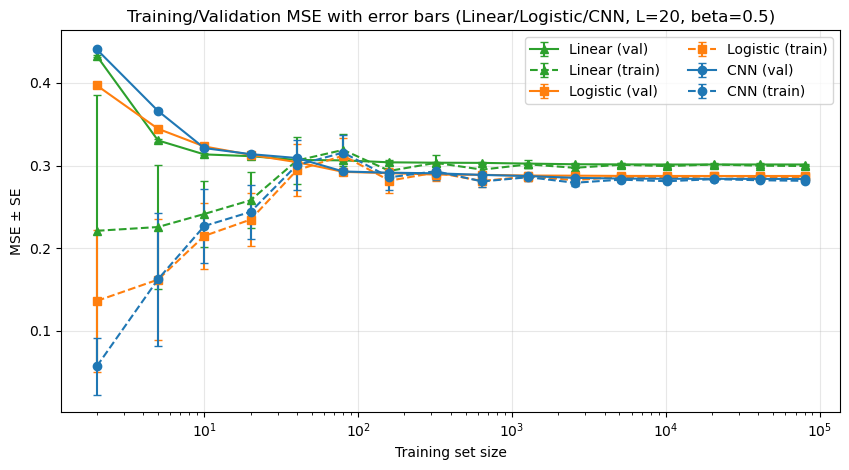

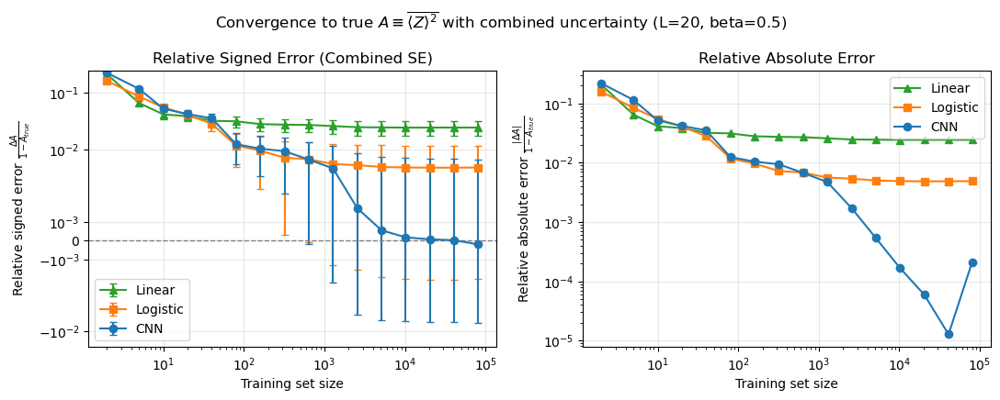

In [4]:
res = Plot_Convergence_Curves_PBC(L=20, beta=0.5, save_fig=False)

True MSE (using Zexp): 0.280994 ± 0.003387
n_train=     2 | Linear val=0.448279±0.000778 | Logistic val=0.471323±0.001077 | CNN val=0.423484±0.000952
n_train=     5 | Linear val=0.340311±0.000627 | Logistic val=0.469778±0.001049 | CNN val=0.327994±0.000723
n_train=    10 | Linear val=0.321946±0.000599 | Logistic val=0.364981±0.000801 | CNN val=0.307526±0.000672
n_train=    20 | Linear val=0.311246±0.000570 | Logistic val=0.316777±0.000685 | CNN val=0.301646±0.000655
n_train=    40 | Linear val=0.307522±0.000564 | Logistic val=0.306510±0.000656 | CNN val=0.297051±0.000632
n_train=    80 | Linear val=0.302632±0.000551 | Logistic val=0.293288±0.000616 | CNN val=0.290985±0.000611
n_train=   160 | Linear val=0.300964±0.000547 | Logistic val=0.290144±0.000606 | CNN val=0.289845±0.000608
n_train=   320 | Linear val=0.300805±0.000545 | Logistic val=0.288212±0.000598 | CNN val=0.288865±0.000609
n_train=   640 | Linear val=0.300245±0.000543 | Logistic val=0.287323±0.000597 | CNN val=0.286339±0.0

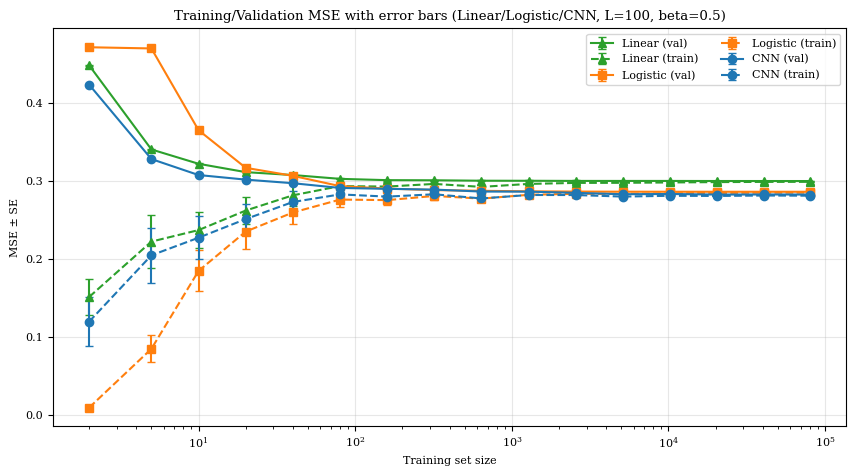

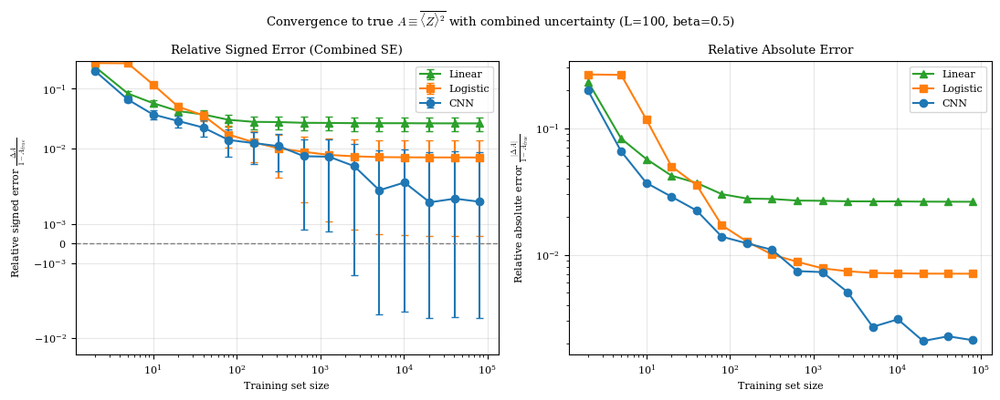

In [102]:
Plot_Convergence_Curves_PBC(L=100, beta=0.5, save_fig=False)

Processing L=20...
True MSE (using Zexp): 0.283981 ± 0.003381
n_train=     2 | Linear val=0.432740±0.001709 | Logistic val=0.397058±0.001730 | CNN val=0.440652±0.002075
n_train=     5 | Linear val=0.330520±0.001369 | Logistic val=0.344598±0.001673 | CNN val=0.366224±0.001802
n_train=    10 | Linear val=0.313595±0.001274 | Logistic val=0.323224±0.001541 | CNN val=0.321239±0.001574
n_train=    20 | Linear val=0.311469±0.001257 | Logistic val=0.313016±0.001463 | CNN val=0.313904±0.001479
n_train=    40 | Linear val=0.306878±0.001252 | Logistic val=0.304224±0.001425 | CNN val=0.309215±0.001447
n_train=    80 | Linear val=0.306376±0.001228 | Logistic val=0.292475±0.001335 | CNN val=0.292928±0.001329
n_train=   160 | Linear val=0.304008±0.001232 | Logistic val=0.290894±0.001360 | CNN val=0.291447±0.001370
n_train=   320 | Linear val=0.303549±0.001225 | Logistic val=0.289170±0.001334 | CNN val=0.290729±0.001370
n_train=   640 | Linear val=0.303335±0.001224 | Logistic val=0.288868±0.001342 | C

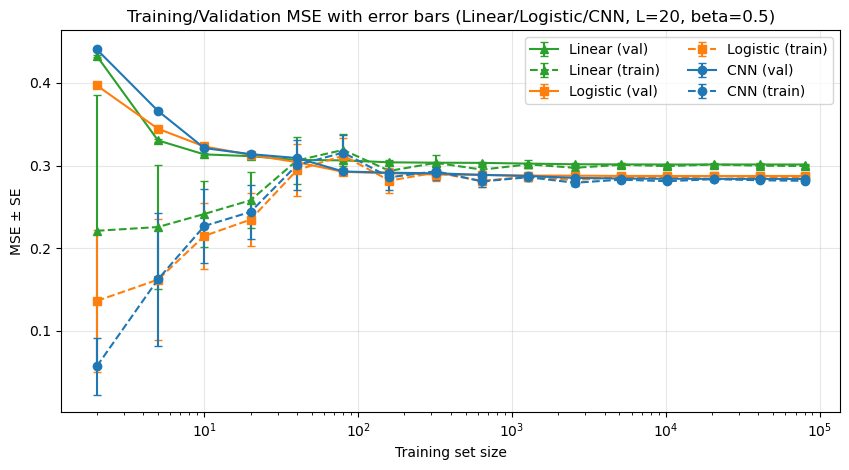

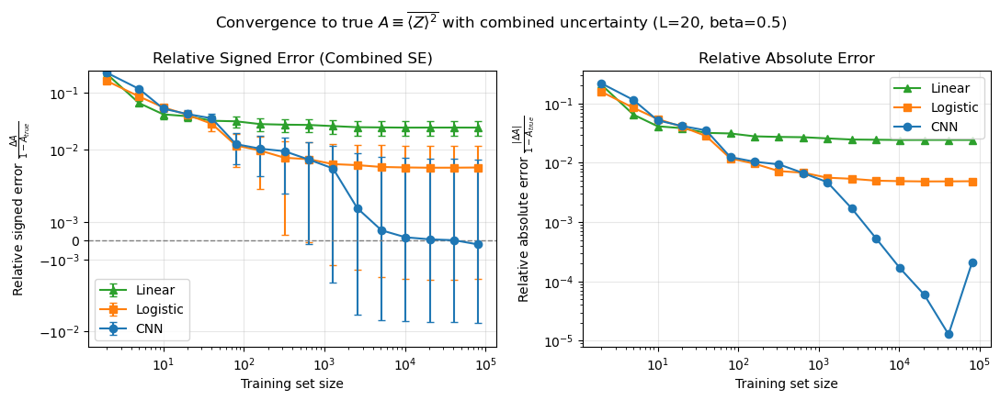

Processing L=40...
True MSE (using Zexp): 0.282687 ± 0.003388
n_train=     2 | Linear val=0.539598±0.001561 | Logistic val=0.458849±0.001614 | CNN val=0.423319±0.001433
n_train=     5 | Linear val=0.348231±0.000978 | Logistic val=0.397047±0.001339 | CNN val=0.353052±0.001185
n_train=    10 | Linear val=0.334184±0.000948 | Logistic val=0.385461±0.001281 | CNN val=0.333045±0.001116
n_train=    20 | Linear val=0.320697±0.000919 | Logistic val=0.328025±0.001085 | CNN val=0.333221±0.001109
n_train=    40 | Linear val=0.312212±0.000898 | Logistic val=0.302481±0.000993 | CNN val=0.316436±0.001072
n_train=    80 | Linear val=0.306182±0.000881 | Logistic val=0.295114±0.000974 | CNN val=0.309888±0.001067
n_train=   160 | Linear val=0.303194±0.000871 | Logistic val=0.290301±0.000961 | CNN val=0.304503±0.001064
n_train=   320 | Linear val=0.302320±0.000865 | Logistic val=0.288813±0.000948 | CNN val=0.289005±0.000919
n_train=   640 | Linear val=0.301577±0.000861 | Logistic val=0.287693±0.000945 | C

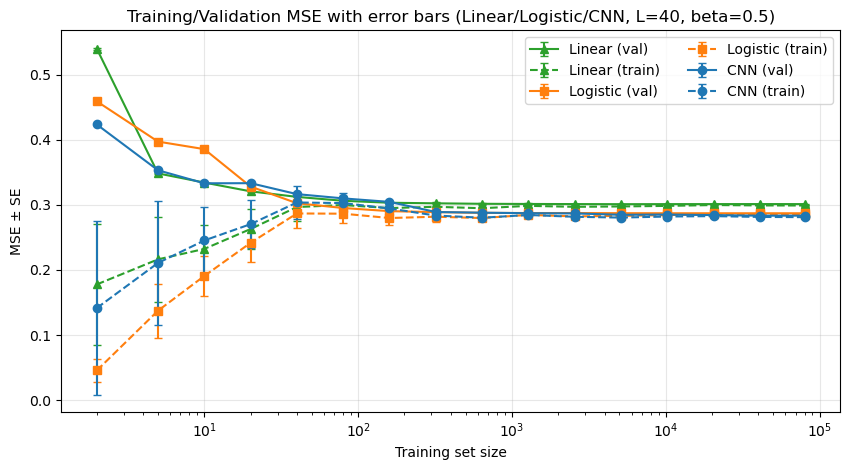

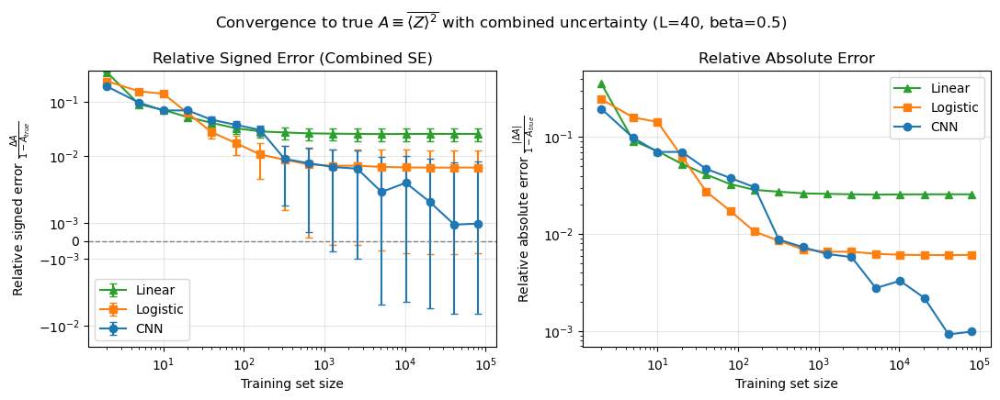

Processing L=60...
True MSE (using Zexp): 0.281492 ± 0.003387
n_train=     2 | Linear val=0.412018±0.001002 | Logistic val=0.435837±0.001250 | CNN val=0.345519±0.001007
n_train=     5 | Linear val=0.355554±0.000835 | Logistic val=0.443508±0.001241 | CNN val=0.354311±0.000970
n_train=    10 | Linear val=0.324253±0.000776 | Logistic val=0.365122±0.001022 | CNN val=0.325045±0.000915
n_train=    20 | Linear val=0.313178±0.000745 | Logistic val=0.319590±0.000886 | CNN val=0.327694±0.000919
n_train=    40 | Linear val=0.305296±0.000723 | Logistic val=0.299294±0.000815 | CNN val=0.309941±0.000879
n_train=    80 | Linear val=0.302920±0.000715 | Logistic val=0.293121±0.000791 | CNN val=0.306142±0.000869
n_train=   160 | Linear val=0.300619±0.000708 | Logistic val=0.289693±0.000783 | CNN val=0.302720±0.000868
n_train=   320 | Linear val=0.301003±0.000706 | Logistic val=0.288158±0.000773 | CNN val=0.287556±0.000747
n_train=   640 | Linear val=0.300562±0.000703 | Logistic val=0.287372±0.000772 | C

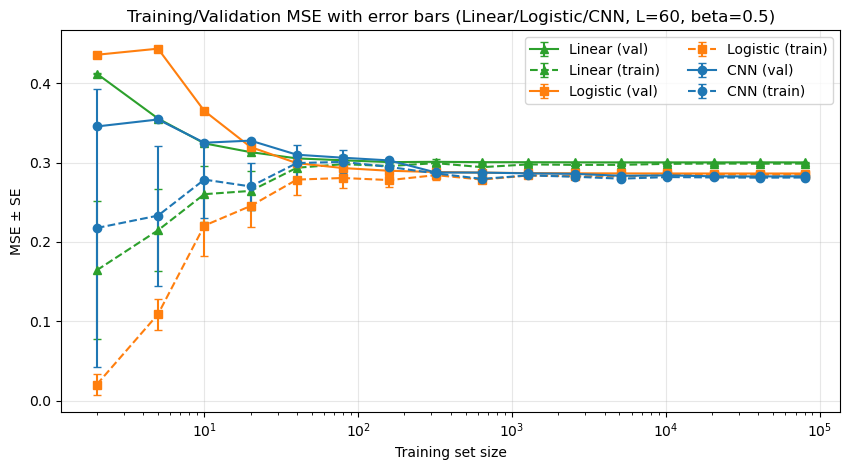

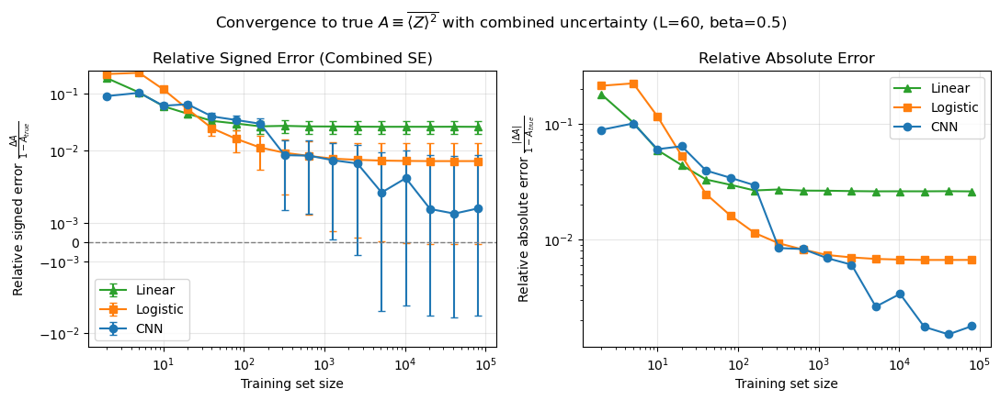

Processing L=100...
True MSE (using Zexp): 0.280994 ± 0.003387
n_train=     2 | Linear val=0.448279±0.000778 | Logistic val=0.471323±0.001077 | CNN val=0.423484±0.000952
n_train=     5 | Linear val=0.340311±0.000627 | Logistic val=0.469778±0.001049 | CNN val=0.327994±0.000723
n_train=    10 | Linear val=0.321946±0.000599 | Logistic val=0.364981±0.000801 | CNN val=0.307526±0.000672
n_train=    20 | Linear val=0.311246±0.000570 | Logistic val=0.316777±0.000685 | CNN val=0.301646±0.000655
n_train=    40 | Linear val=0.307522±0.000564 | Logistic val=0.306510±0.000656 | CNN val=0.297051±0.000632
n_train=    80 | Linear val=0.302632±0.000551 | Logistic val=0.293288±0.000616 | CNN val=0.290985±0.000611
n_train=   160 | Linear val=0.300964±0.000547 | Logistic val=0.290144±0.000606 | CNN val=0.289845±0.000608
n_train=   320 | Linear val=0.300805±0.000545 | Logistic val=0.288212±0.000598 | CNN val=0.288865±0.000609
n_train=   640 | Linear val=0.300245±0.000543 | Logistic val=0.287323±0.000597 | 

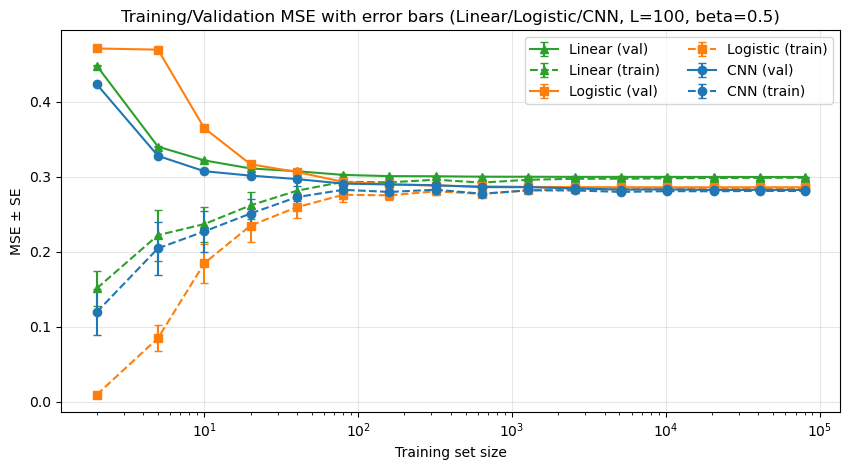

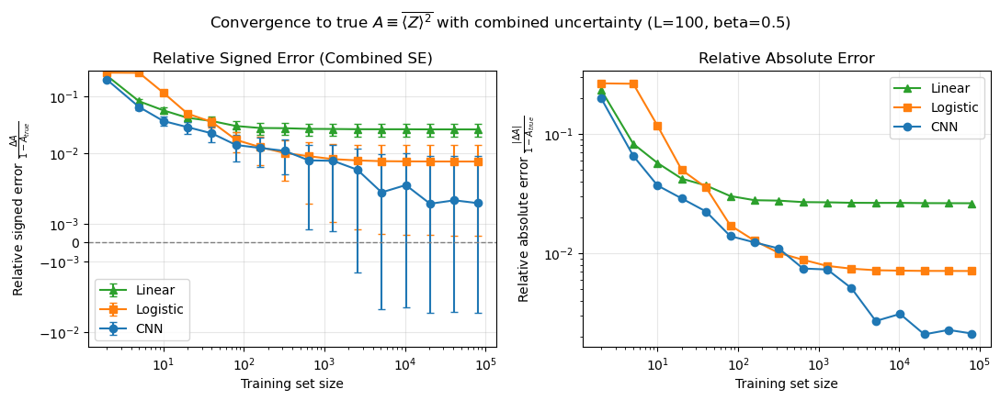

Processing L=200...
True MSE (using Zexp): 0.281214 ± 0.003388
n_train=     2 | Linear val=0.475516±0.000615 | Logistic val=0.503323±0.000789 | CNN val=0.345612±0.000542
n_train=     5 | Linear val=0.350813±0.000458 | Logistic val=0.511944±0.000822 | CNN val=0.305575±0.000469
n_train=    10 | Linear val=0.325693±0.000421 | Logistic val=0.382616±0.000595 | CNN val=0.298959±0.000459
n_train=    20 | Linear val=0.313877±0.000404 | Logistic val=0.324826±0.000495 | CNN val=0.295972±0.000457
n_train=    40 | Linear val=0.305629±0.000394 | Logistic val=0.303625±0.000457 | CNN val=0.295364±0.000450
n_train=    80 | Linear val=0.301932±0.000388 | Logistic val=0.292821±0.000433 | CNN val=0.294845±0.000442
n_train=   160 | Linear val=0.300511±0.000386 | Logistic val=0.289291±0.000426 | CNN val=0.295953±0.000443
n_train=   320 | Linear val=0.300087±0.000384 | Logistic val=0.287486±0.000421 | CNN val=0.286860±0.000422
n_train=   640 | Linear val=0.299693±0.000384 | Logistic val=0.286640±0.000420 | 

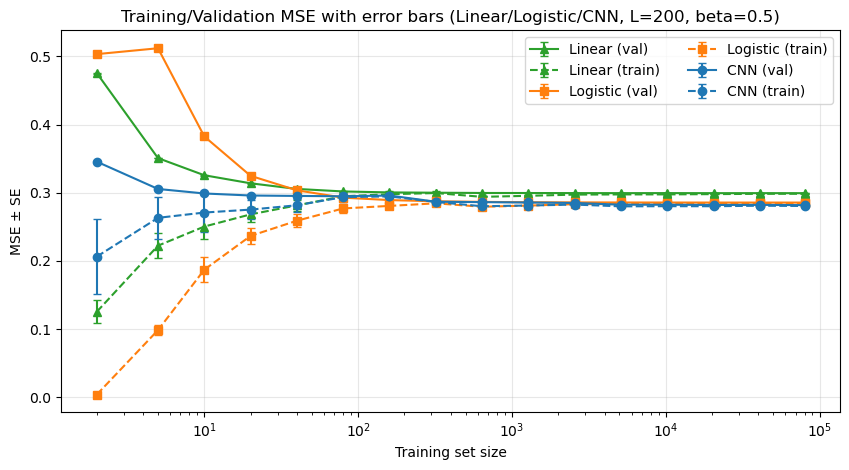

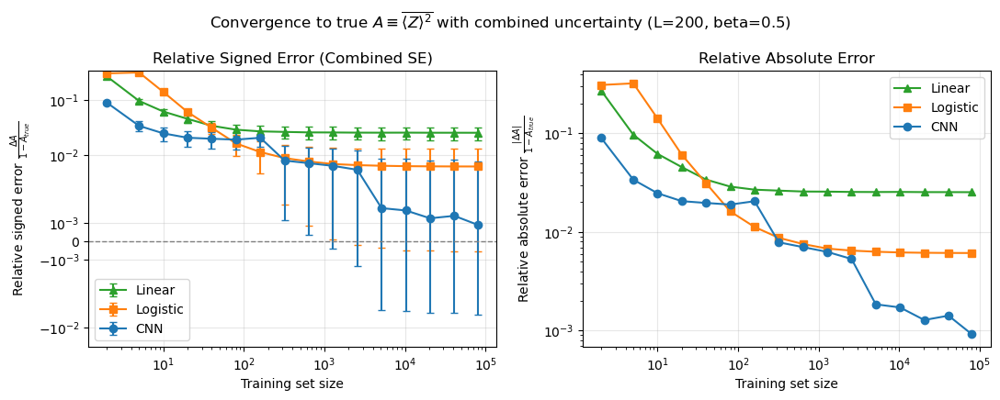

In [21]:
res = {}
for L in [20, 40, 60, 100, 200]:
    print(f"Processing L={L}...")
    res[L] = Plot_Convergence_Curves_PBC(L=L, beta=0.5, save_fig=False)

In [86]:
# save res
print(res)
import pickle
pickle.dump(res, open("figures/convergence_curves_pbc_results_beta0.5.pkl", "wb"))

{20: (np.float64(0.28398141158514656), array([2.000e+00, 5.000e+00, 1.000e+01, 2.000e+01, 4.000e+01, 8.000e+01,
       1.600e+02, 3.200e+02, 6.400e+02, 1.280e+03, 2.560e+03, 5.120e+03,
       1.024e+04, 2.048e+04, 4.096e+04, 8.000e+04]), {'Linear': array([0.20775834, 0.06499703, 0.04135861, 0.03838955, 0.03197802,
       0.03127655, 0.02796986, 0.02732804, 0.02702944, 0.02581307,
       0.02469905, 0.02448467, 0.02426835, 0.02431331, 0.02432794,
       0.02428831]), 'Logistic': array([0.15792411, 0.08465784, 0.05480713, 0.04054938, 0.02827081,
       0.01186239, 0.00965429, 0.00724627, 0.00682501, 0.00561385,
       0.00538642, 0.0050035 , 0.00490723, 0.00485665, 0.00486386,
       0.00489674]), 'CNN': array([ 2.18808216e-01,  1.14861580e-01,  5.20348790e-02,  4.17899307e-02,
        3.52411236e-02,  1.24945921e-02,  1.04259651e-02,  9.42336773e-03,
        6.73685800e-03,  4.71942635e-03,  1.71413163e-03,  5.37761275e-04,
        1.66490585e-04,  5.95629611e-05,  1.28211466e-05, -2.06

Processing L=20...
True MSE (using Zexp): 0.469763 ± 0.003285
n_train=     2 | Linear train=0.370805±0.294683, val=0.612845±0.003191 | Logistic train=0.334789±0.231733, val=0.594362±0.003143 | CNN train=0.181269±0.053001, val=0.670143±0.003872
n_train=     5 | Linear train=0.525165±0.072928, val=0.548456±0.001991 | Logistic train=0.500665±0.079092, val=0.567448±0.002446 | CNN train=0.482658±0.077667, val=0.591133±0.002667
n_train=    10 | Linear train=0.486040±0.047526, val=0.520607±0.001831 | Logistic train=0.476374±0.049780, val=0.519766±0.002107 | CNN train=0.474034±0.050163, val=0.528860±0.002127
n_train=    20 | Linear train=0.436834±0.046450, val=0.502113±0.001832 | Logistic train=0.422494±0.049381, val=0.495562±0.002117 | CNN train=0.425397±0.047312, val=0.503781±0.002068
n_train=    40 | Linear train=0.470279±0.036679, val=0.489791±0.001883 | Logistic train=0.462843±0.040423, val=0.482502±0.002127 | CNN train=0.462077±0.038459, val=0.486145±0.002053
n_train=    80 | Linear trai

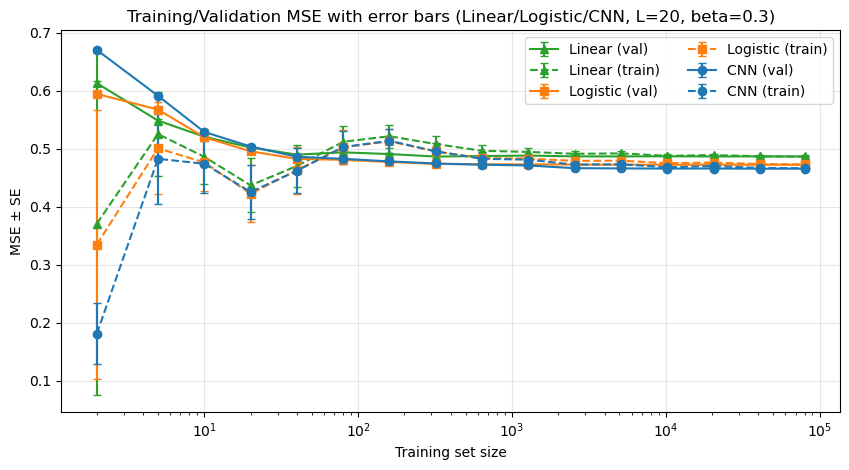

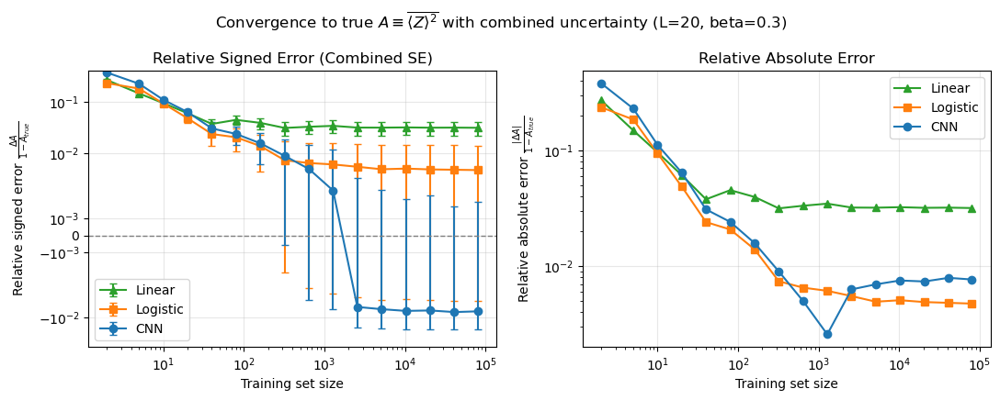

Processing L=40...
True MSE (using Zexp): 0.459960 ± 0.003296
n_train=     2 | Linear train=0.303303±0.044339, val=0.623821±0.002182 | Logistic train=0.111747±0.012323, val=0.736112±0.002810 | CNN train=0.283475±0.054811, val=0.652957±0.002435
n_train=     5 | Linear train=0.510175±0.019608, val=0.624847±0.001388 | Logistic train=0.493732±0.010960, val=0.666083±0.001670 | CNN train=0.523134±0.013621, val=0.625573±0.001517
n_train=    10 | Linear train=0.456371±0.047793, val=0.553395±0.001348 | Logistic train=0.434544±0.048327, val=0.563909±0.001585 | CNN train=0.463404±0.045623, val=0.544520±0.001525
n_train=    20 | Linear train=0.467229±0.036369, val=0.518040±0.001314 | Logistic train=0.454506±0.039185, val=0.511087±0.001486 | CNN train=0.468053±0.041770, val=0.523771±0.001522
n_train=    40 | Linear train=0.492690±0.028559, val=0.503585±0.001320 | Logistic train=0.482216±0.030834, val=0.490749±0.001441 | CNN train=0.494930±0.032620, val=0.499621±0.001444
n_train=    80 | Linear trai

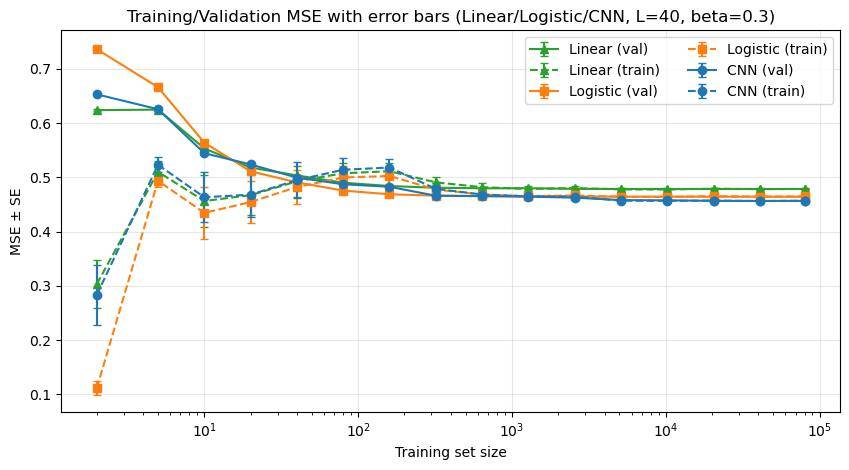

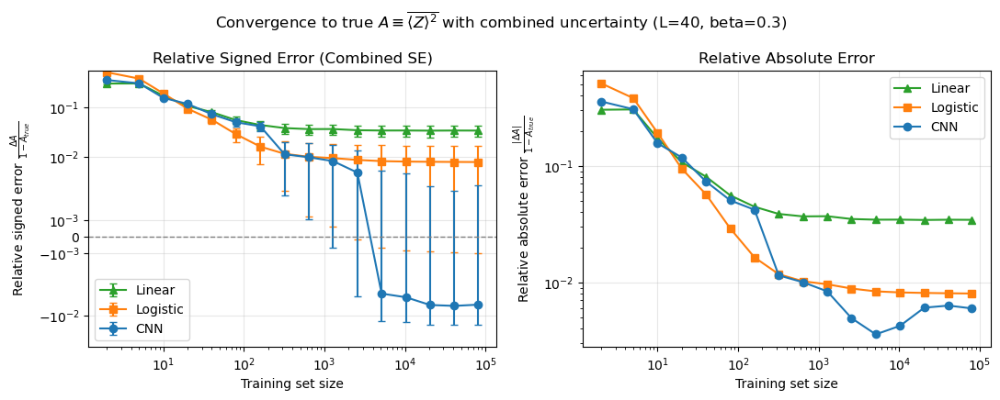

Processing L=60...
True MSE (using Zexp): 0.455956 ± 0.003296
n_train=     2 | Linear train=0.303552±0.101102, val=0.640050±0.001598 | Logistic train=0.135156±0.027556, val=0.708757±0.002070 | CNN train=0.318376±0.130253, val=0.606488±0.001747
n_train=     5 | Linear train=0.523534±0.068382, val=0.559765±0.001181 | Logistic train=0.475692±0.075127, val=0.593693±0.001481 | CNN train=0.525577±0.065628, val=0.542670±0.001274
n_train=    10 | Linear train=0.470460±0.060304, val=0.517222±0.001151 | Logistic train=0.436082±0.065362, val=0.530564±0.001354 | CNN train=0.468831±0.056493, val=0.509990±0.001290
n_train=    20 | Linear train=0.469790±0.042516, val=0.501688±0.001115 | Logistic train=0.450671±0.046626, val=0.503685±0.001281 | CNN train=0.476804±0.048759, val=0.506868±0.001268
n_train=    40 | Linear train=0.487806±0.026105, val=0.487187±0.001093 | Logistic train=0.472341±0.027725, val=0.476012±0.001199 | CNN train=0.493023±0.030253, val=0.485268±0.001201
n_train=    80 | Linear trai

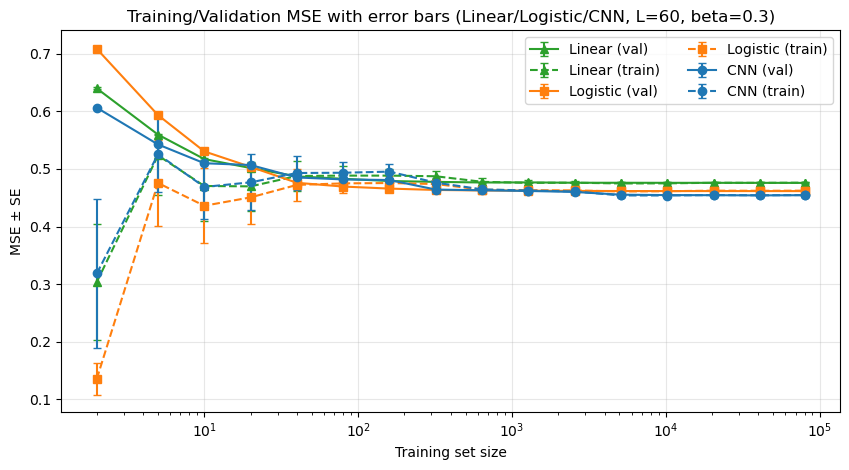

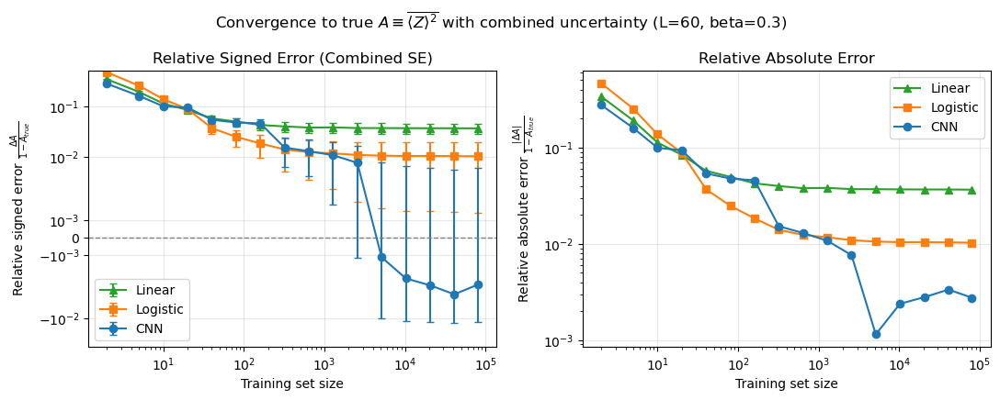

Processing L=100...
True MSE (using Zexp): 0.453640 ± 0.003296
n_train=     2 | Linear train=0.226806±0.037904, val=0.796431±0.001294 | Logistic train=0.028860±0.005438, val=0.870155±0.001666 | CNN train=0.249251±0.058784, val=0.688799±0.001471
n_train=     5 | Linear train=0.428794±0.036100, val=0.555435±0.001021 | Logistic train=0.390487±0.040089, val=0.612351±0.001279 | CNN train=0.443157±0.045156, val=0.536516±0.001117
n_train=    10 | Linear train=0.426457±0.039020, val=0.520176±0.000929 | Logistic train=0.398362±0.041916, val=0.539563±0.001101 | CNN train=0.426997±0.043707, val=0.504567±0.001016
n_train=    20 | Linear train=0.467607±0.035369, val=0.501545±0.000864 | Logistic train=0.449484±0.039081, val=0.498007±0.000977 | CNN train=0.464199±0.038726, val=0.483577±0.000935
n_train=    40 | Linear train=0.482812±0.021433, val=0.487116±0.000856 | Logistic train=0.470501±0.023373, val=0.477326±0.000931 | CNN train=0.482436±0.022519, val=0.474923±0.000916
n_train=    80 | Linear tra

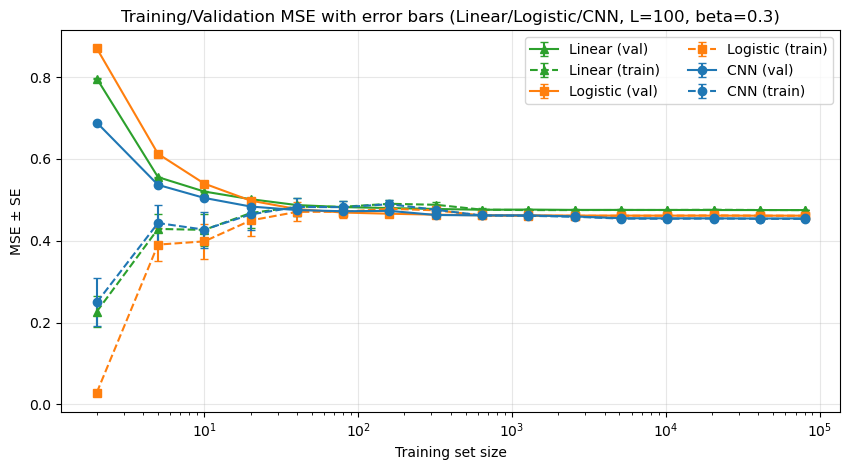

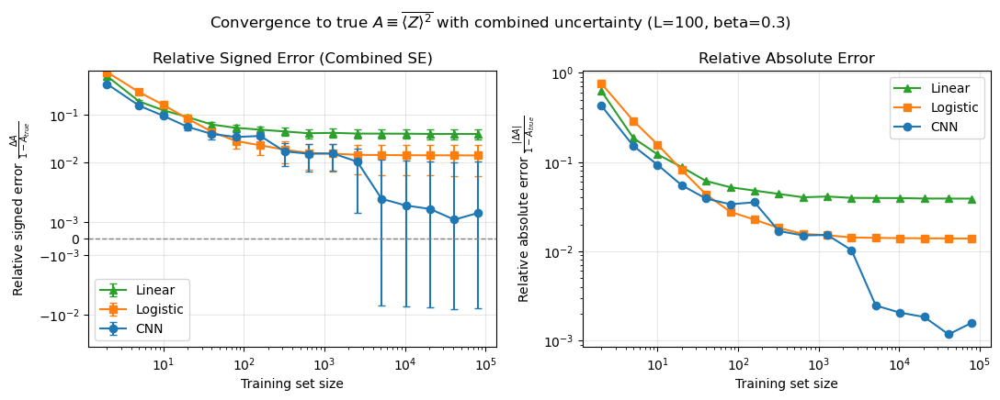

Processing L=200...
True MSE (using Zexp): 0.452486 ± 0.003295
n_train=     2 | Linear train=0.228623±0.017224, val=0.744488±0.001137 | Logistic train=0.019391±0.001087, val=0.837568±0.001415 | CNN train=0.338467±0.027783, val=0.541382±0.000843
n_train=     5 | Linear train=0.432842±0.023619, val=0.582584±0.000804 | Logistic train=0.379107±0.024620, val=0.649014±0.000998 | CNN train=0.485909±0.021430, val=0.495348±0.000694
n_train=    10 | Linear train=0.440463±0.035092, val=0.512984±0.000658 | Logistic train=0.406790±0.032376, val=0.537640±0.000791 | CNN train=0.459753±0.036462, val=0.477076±0.000675
n_train=    20 | Linear train=0.467445±0.026311, val=0.493424±0.000624 | Logistic train=0.445977±0.027252, val=0.494823±0.000708 | CNN train=0.470127±0.028126, val=0.468931±0.000657
n_train=    40 | Linear train=0.473782±0.015930, val=0.484386±0.000612 | Logistic train=0.458855±0.017048, val=0.476352±0.000670 | CNN train=0.473676±0.016673, val=0.468470±0.000651
n_train=    80 | Linear tra

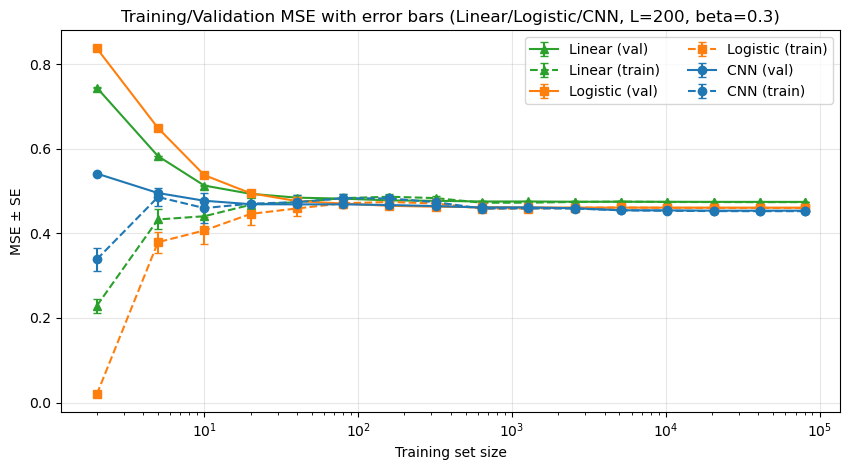

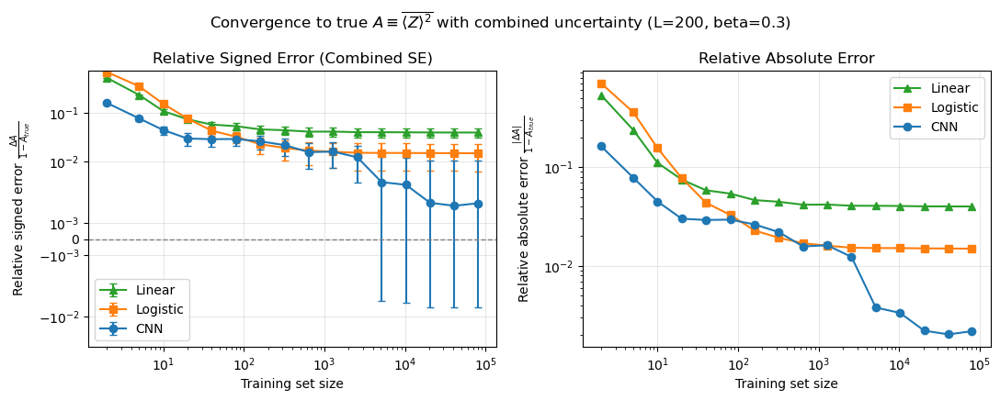

{20: (np.float64(0.469762899405739), array([2.000e+00, 5.000e+00, 1.000e+01, 2.000e+01, 4.000e+01, 8.000e+01,
       1.600e+02, 3.200e+02, 6.400e+02, 1.280e+03, 2.560e+03, 5.120e+03,
       1.024e+04, 2.048e+04, 4.096e+04, 8.000e+04]), {'Linear': array([0.26984599, 0.14841207, 0.09588869, 0.06101015, 0.03777251,
       0.04528638, 0.03960252, 0.03155394, 0.03322839, 0.03463959,
       0.03206454, 0.03197408, 0.03230708, 0.03189279, 0.03200939,
       0.03175518]), 'Logistic': array([0.23498733, 0.18422902, 0.09430346, 0.04865587, 0.0240256 ,
       0.02073004, 0.01399429, 0.00741598, 0.0065358 , 0.00613281,
       0.00552511, 0.00494164, 0.0050889 , 0.00490623, 0.00483227,
       0.00475802]), 'CNN': array([ 0.37790718,  0.22889869,  0.11145372,  0.06415655,  0.03089522,
        0.024104  ,  0.01583829,  0.00902465,  0.0050178 ,  0.00258359,
       -0.00631101, -0.00697278, -0.00753163, -0.0073837 , -0.00793777,
       -0.00768018])}, {'Linear': array([0.01062996, 0.00953323, 0.0094183

In [91]:
res = {}
beta = 0.3
for L in [20, 40, 60, 100, 200]:
    print(f"Processing L={L}...")
    res[L] = Plot_Convergence_Curves_PBC(L=L, beta=beta, save_fig=False)

print(res)
pickle.dump(res, open(f"figures/convergence_curves_pbc_results_beta{beta}.pkl", "wb"))

Processing L=20...
True MSE (using Zexp): 0.617964 ± 0.002790
n_train=     2 | Linear train=0.388422±0.332720, val=0.777113±0.004114 | Logistic train=0.371177±0.298475, val=0.764601±0.004088 | CNN train=0.281791±0.261504, val=0.843294±0.005119
n_train=     5 | Linear train=0.700186±0.078812, val=0.787856±0.001944 | Logistic train=0.694935±0.083759, val=0.795955±0.002057 | CNN train=0.678862±0.078746, val=0.818706±0.002160
n_train=    10 | Linear train=0.626112±0.068131, val=0.713382±0.002214 | Logistic train=0.631341±0.077855, val=0.730970±0.002489 | CNN train=0.625739±0.079069, val=0.745988±0.002581
n_train=    20 | Linear train=0.606339±0.063920, val=0.666225±0.002222 | Logistic train=0.603762±0.072401, val=0.666722±0.002544 | CNN train=0.603607±0.072707, val=0.678659±0.002598
n_train=    40 | Linear train=0.637625±0.052331, val=0.649875±0.002290 | Logistic train=0.639546±0.058958, val=0.645485±0.002533 | CNN train=0.641598±0.059007, val=0.659977±0.002573
n_train=    80 | Linear trai

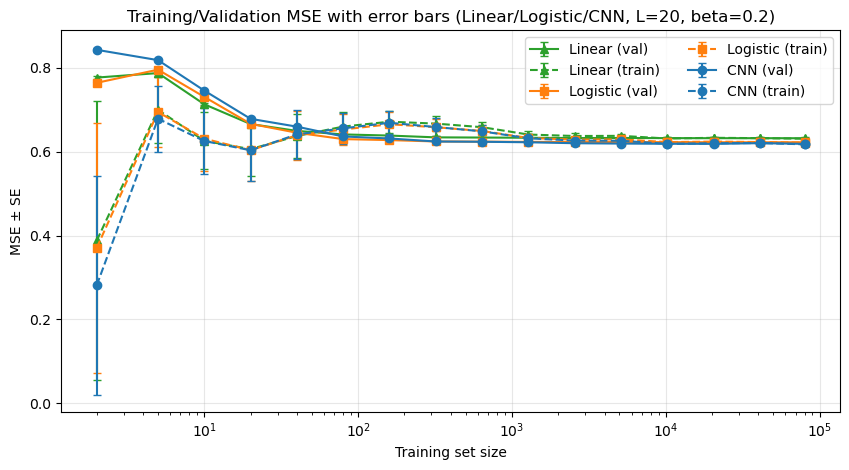

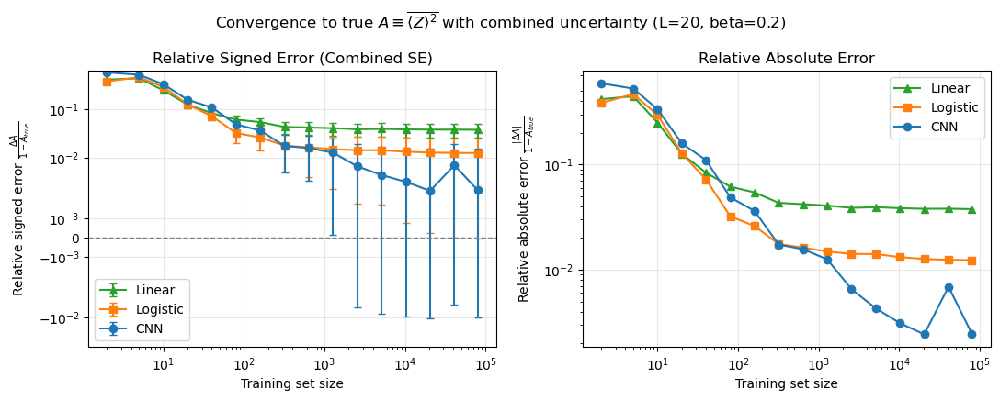

Processing L=40...
True MSE (using Zexp): 0.591232 ± 0.002839
n_train=     2 | Linear train=0.202534±0.006972, val=0.861889±0.002674 | Logistic train=0.073543±0.009511, val=0.915645±0.003170 | CNN train=0.175759±0.003505, val=0.840944±0.003167
n_train=     5 | Linear train=0.593962±0.058629, val=0.784441±0.001584 | Logistic train=0.562238±0.062327, val=0.813822±0.001815 | CNN train=0.592603±0.063129, val=0.788162±0.001766
n_train=    10 | Linear train=0.578704±0.036538, val=0.731559±0.001581 | Logistic train=0.561204±0.043345, val=0.743085±0.001835 | CNN train=0.584185±0.034125, val=0.743049±0.001772
n_train=    20 | Linear train=0.557899±0.041224, val=0.666292±0.001643 | Logistic train=0.543133±0.046551, val=0.670973±0.001878 | CNN train=0.553462±0.043483, val=0.693473±0.001850
n_train=    40 | Linear train=0.632551±0.040932, val=0.637811±0.001691 | Logistic train=0.624307±0.044528, val=0.628440±0.001825 | CNN train=0.637682±0.042237, val=0.636552±0.001705
n_train=    80 | Linear trai

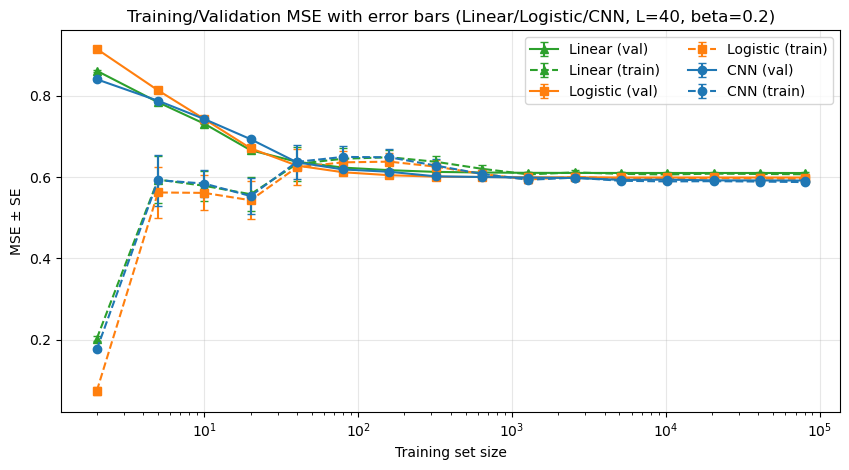

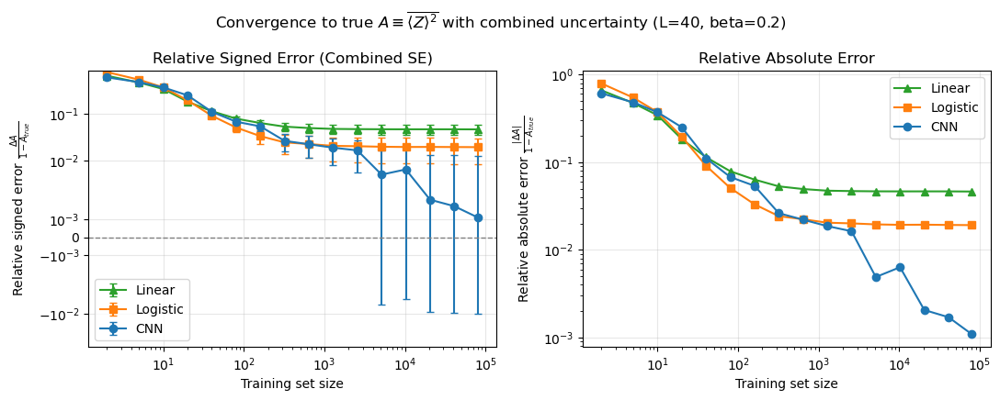

Processing L=60...
True MSE (using Zexp): 0.581019 ± 0.002847
n_train=     2 | Linear train=0.377120±0.079314, val=0.851146±0.002267 | Logistic train=0.267801±0.077298, val=0.973309±0.002716 | CNN train=0.495429±0.136807, val=0.779990±0.002251
n_train=     5 | Linear train=0.640190±0.088456, val=0.787433±0.001367 | Logistic train=0.625397±0.091945, val=0.803474±0.001544 | CNN train=0.684718±0.066542, val=0.730603±0.001285
n_train=    10 | Linear train=0.594776±0.058155, val=0.684095±0.001425 | Logistic train=0.586907±0.063522, val=0.694701±0.001598 | CNN train=0.617449±0.059726, val=0.665608±0.001475
n_train=    20 | Linear train=0.580687±0.046516, val=0.638447±0.001444 | Logistic train=0.569480±0.050152, val=0.640943±0.001607 | CNN train=0.588184±0.049614, val=0.648585±0.001532
n_train=    40 | Linear train=0.607606±0.033261, val=0.621919±0.001486 | Logistic train=0.597039±0.035298, val=0.612648±0.001593 | CNN train=0.614949±0.033964, val=0.615346±0.001491
n_train=    80 | Linear trai

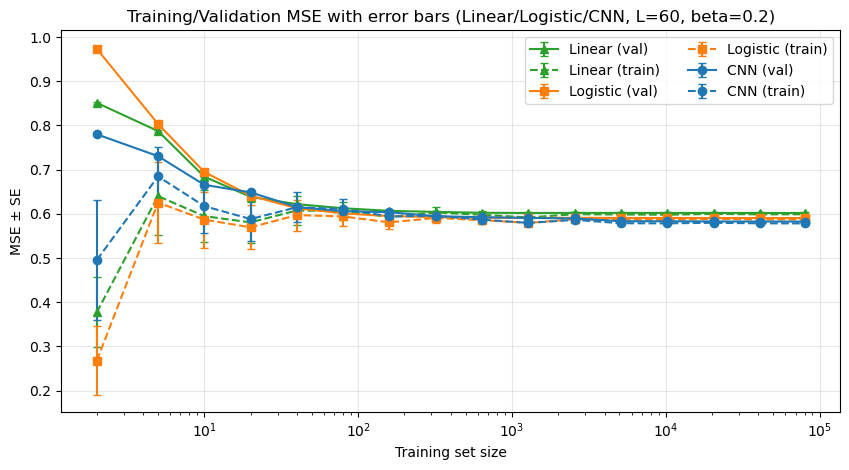

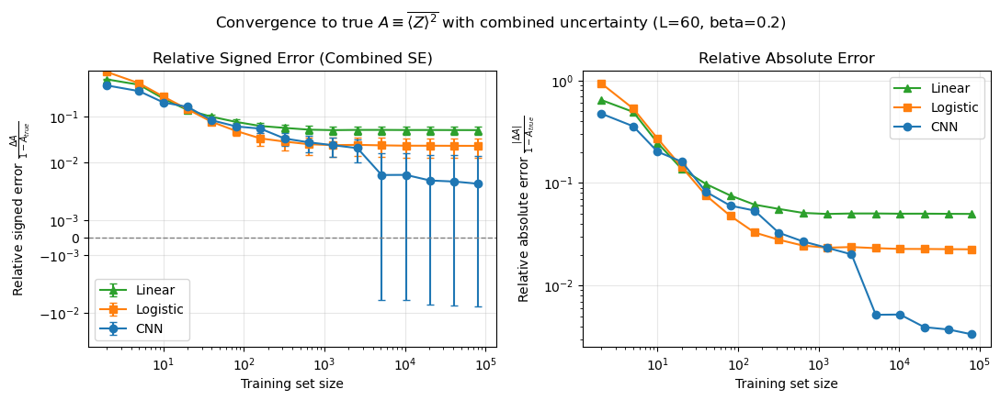

Processing L=100...
True MSE (using Zexp): 0.572310 ± 0.002853
n_train=     2 | Linear train=0.259278±0.047820, val=0.913748±0.001684 | Logistic train=0.034360±0.004231, val=1.042125±0.002147 | CNN train=0.287351±0.031408, val=0.881932±0.002017
n_train=     5 | Linear train=0.554181±0.049832, val=0.683897±0.001272 | Logistic train=0.516238±0.060887, val=0.744597±0.001563 | CNN train=0.550866±0.059908, val=0.650951±0.001411
n_train=    10 | Linear train=0.544861±0.044370, val=0.656296±0.001207 | Logistic train=0.523432±0.046091, val=0.679484±0.001399 | CNN train=0.543314±0.047693, val=0.630845±0.001336
n_train=    20 | Linear train=0.581136±0.040782, val=0.621871±0.001157 | Logistic train=0.566193±0.044285, val=0.620100±0.001273 | CNN train=0.575854±0.043562, val=0.606705±0.001265
n_train=    40 | Linear train=0.627941±0.027682, val=0.613767±0.001120 | Logistic train=0.617981±0.029855, val=0.605858±0.001191 | CNN train=0.625003±0.031326, val=0.599757±0.001224
n_train=    80 | Linear tra

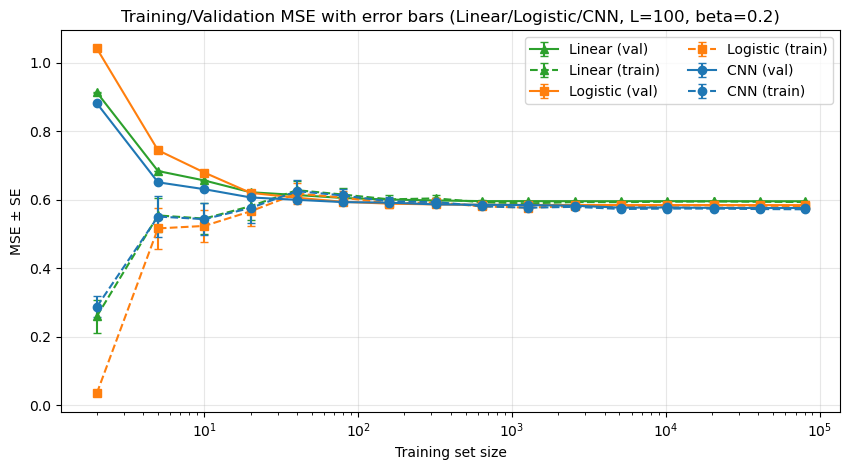

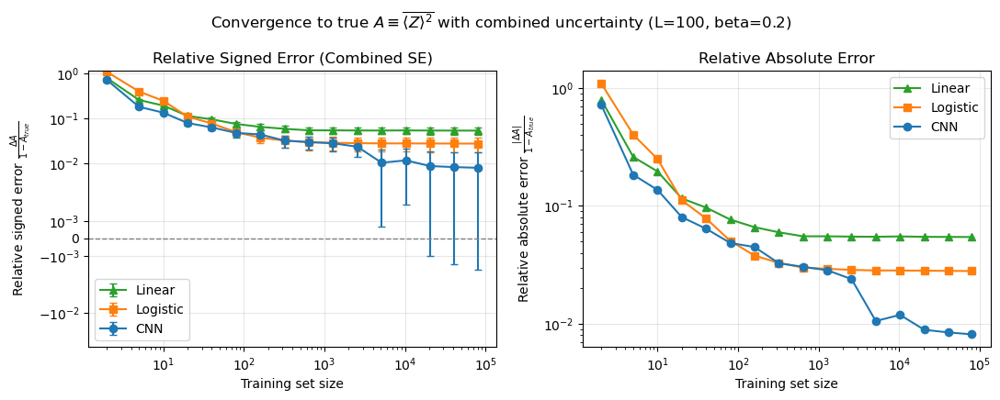

Processing L=200...
True MSE (using Zexp): 0.569395 ± 0.002856
n_train=     2 | Linear train=0.278890±0.014617, val=0.868854±0.001281 | Logistic train=0.030915±0.001140, val=1.062357±0.001627 | CNN train=0.418287±0.054177, val=0.730158±0.001239
n_train=     5 | Linear train=0.506643±0.015823, val=0.705217±0.000938 | Logistic train=0.462059±0.021082, val=0.767911±0.001154 | CNN train=0.565691±0.019160, val=0.621598±0.000892
n_train=    10 | Linear train=0.519338±0.029650, val=0.650365±0.000868 | Logistic train=0.495309±0.031043, val=0.675510±0.001009 | CNN train=0.545507±0.029523, val=0.604846±0.000891
n_train=    20 | Linear train=0.587533±0.027067, val=0.625613±0.000807 | Logistic train=0.574040±0.029475, val=0.626611±0.000884 | CNN train=0.604436±0.028476, val=0.597048±0.000840
n_train=    40 | Linear train=0.603370±0.017545, val=0.607241±0.000816 | Logistic train=0.592675±0.018523, val=0.600879±0.000868 | CNN train=0.609614±0.018591, val=0.595162±0.000845
n_train=    80 | Linear tra

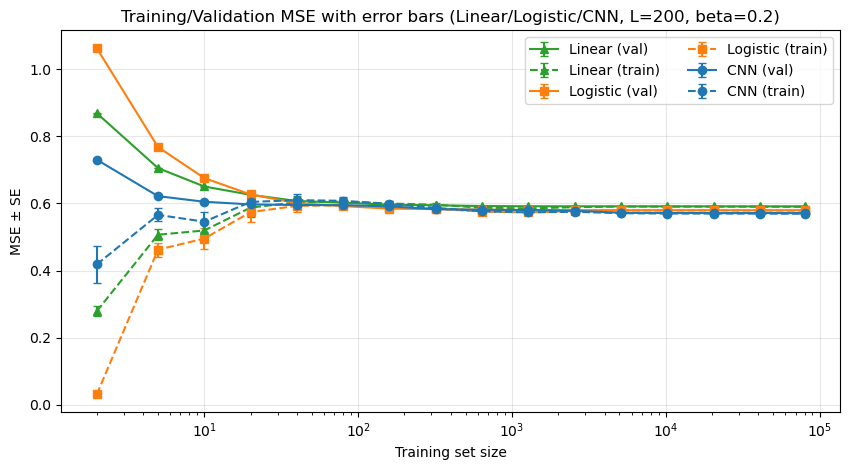

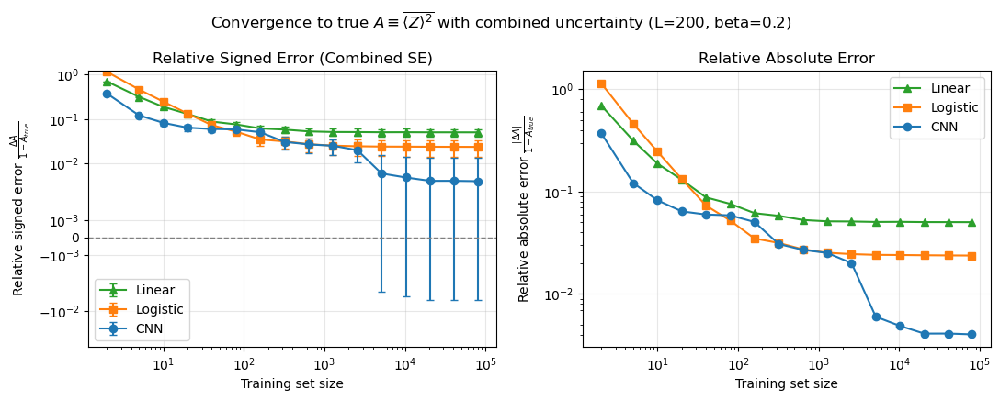

{20: (np.float64(0.6179644034547891), array([2.000e+00, 5.000e+00, 1.000e+01, 2.000e+01, 4.000e+01, 8.000e+01,
       1.600e+02, 3.200e+02, 6.400e+02, 1.280e+03, 2.560e+03, 5.120e+03,
       1.024e+04, 2.048e+04, 4.096e+04, 8.000e+04]), {'Linear': array([0.41657988, 0.44470164, 0.24976031, 0.1263243 , 0.08352695,
       0.06154408, 0.05433409, 0.04317875, 0.04198919, 0.04067702,
       0.03871179, 0.03930994, 0.03845395, 0.0379544 , 0.03802076,
       0.03768697]), 'Logistic': array([0.38383043, 0.46590181, 0.29579898, 0.12762533, 0.0720356 ,
       0.0322309 , 0.02603555, 0.01752521, 0.01624492, 0.01490363,
       0.01413586, 0.01410638, 0.01317962, 0.01266398, 0.01242075,
       0.01235023]), 'CNN': array([0.58981269, 0.52545331, 0.33510848, 0.15887226, 0.10996917,
       0.04874702, 0.03622513, 0.01731256, 0.01570369, 0.0125426 ,
       0.00653136, 0.00430373, 0.003108  , 0.00243447, 0.00690284,
       0.00246458])}, {'Linear': array([0.01492015, 0.01151225, 0.01184211, 0.0118523 , 

In [92]:
res = {}
beta = 0.2
for L in [20, 40, 60, 100, 200]:
    print(f"Processing L={L}...")
    res[L] = Plot_Convergence_Curves_PBC(L=L, beta=beta, save_fig=False)

print(res)
pickle.dump(res, open(f"figures/convergence_curves_pbc_results_beta{beta}.pkl", "wb"))

Processing L=20...
True MSE (using Zexp): 0.842106 ± 0.001576
n_train=     2 | Linear train=0.684228±0.136896, val=1.492574±0.002679 | Logistic train=0.694392±0.134563, val=1.479429±0.002762 | CNN train=0.662865±0.211829, val=1.697869±0.003813
n_train=     5 | Linear train=0.810274±0.080969, val=1.060132±0.001233 | Logistic train=0.805157±0.085082, val=1.061347±0.001219 | CNN train=0.781481±0.077654, val=1.065506±0.001316
n_train=    10 | Linear train=0.764814±0.094725, val=0.939677±0.002207 | Logistic train=0.765460±0.099050, val=0.949387±0.002289 | CNN train=0.759419±0.100794, val=0.962946±0.002364
n_train=    20 | Linear train=0.774452±0.076478, val=0.878317±0.002683 | Logistic train=0.774856±0.080197, val=0.879075±0.002832 | CNN train=0.769621±0.077711, val=0.878454±0.002756
n_train=    40 | Linear train=0.837413±0.057935, val=0.856081±0.002554 | Logistic train=0.840013±0.060318, val=0.855043±0.002631 | CNN train=0.836835±0.058091, val=0.859188±0.002534
n_train=    80 | Linear trai

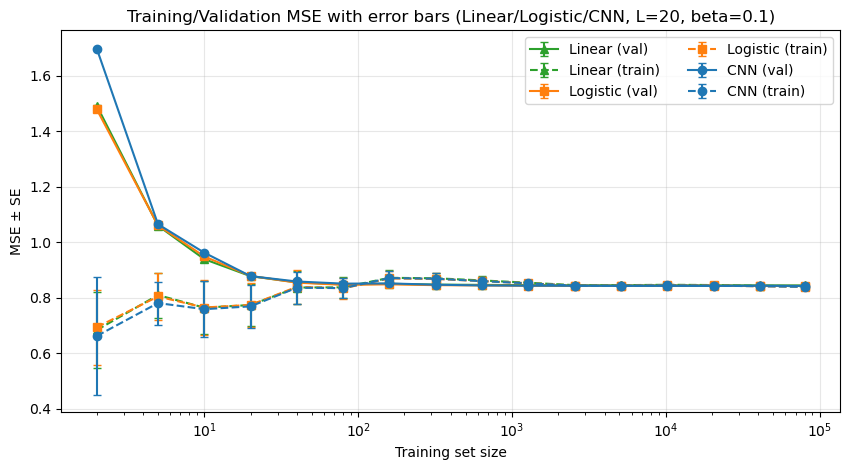

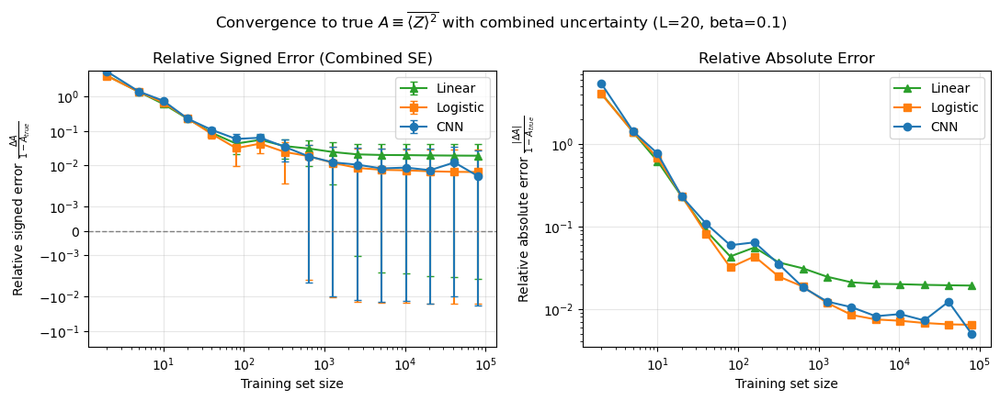

Processing L=40...
True MSE (using Zexp): 0.803929 ± 0.001794
n_train=     2 | Linear train=0.351604±0.080118, val=1.143537±0.003336 | Logistic train=0.182461±0.025132, val=1.307399±0.003797 | CNN train=0.382970±0.084498, val=1.156357±0.003933
n_train=     5 | Linear train=0.655450±0.074521, val=1.020352±0.001910 | Logistic train=0.647269±0.085735, val=1.069089±0.002108 | CNN train=0.694043±0.074946, val=1.024353±0.001974
n_train=    10 | Linear train=0.742168±0.052836, val=0.915454±0.001795 | Logistic train=0.737769±0.054784, val=0.923830±0.001901 | CNN train=0.758073±0.047595, val=0.908366±0.001779
n_train=    20 | Linear train=0.764214±0.062618, val=0.857739±0.002002 | Logistic train=0.760062±0.064071, val=0.860155±0.002127 | CNN train=0.762899±0.059848, val=0.856527±0.002004
n_train=    40 | Linear train=0.810116±0.050037, val=0.833357±0.001998 | Logistic train=0.809667±0.052320, val=0.830804±0.002104 | CNN train=0.822091±0.049633, val=0.840747±0.002020
n_train=    80 | Linear trai

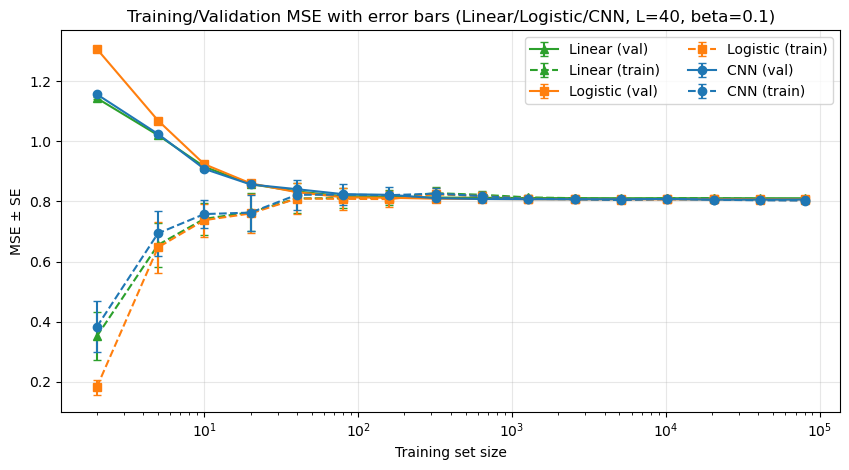

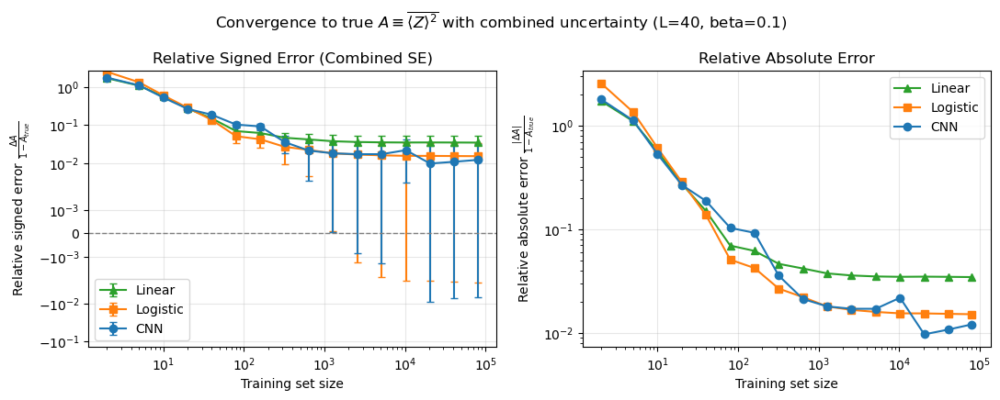

Processing L=60...
True MSE (using Zexp): 0.782952 ± 0.001877
n_train=     2 | Linear train=0.497372±0.113603, val=1.059092±0.003443 | Logistic train=0.415443±0.118199, val=1.133377±0.003347 | CNN train=0.692137±0.142634, val=1.079417±0.001566
n_train=     5 | Linear train=0.691564±0.083419, val=1.027850±0.001908 | Logistic train=0.680404±0.088753, val=1.048924±0.001971 | CNN train=0.767545±0.057138, val=0.904326±0.001576
n_train=    10 | Linear train=0.721374±0.054250, val=0.864921±0.001840 | Logistic train=0.713968±0.058673, val=0.881060±0.001981 | CNN train=0.749764±0.054176, val=0.853080±0.001880
n_train=    20 | Linear train=0.765937±0.066117, val=0.844821±0.001810 | Logistic train=0.764197±0.068988, val=0.849660±0.001911 | CNN train=0.781980±0.061642, val=0.846284±0.001790
n_train=    40 | Linear train=0.754234±0.047630, val=0.816710±0.002028 | Logistic train=0.747971±0.050818, val=0.815424±0.002179 | CNN train=0.776017±0.044030, val=0.828158±0.002011
n_train=    80 | Linear trai

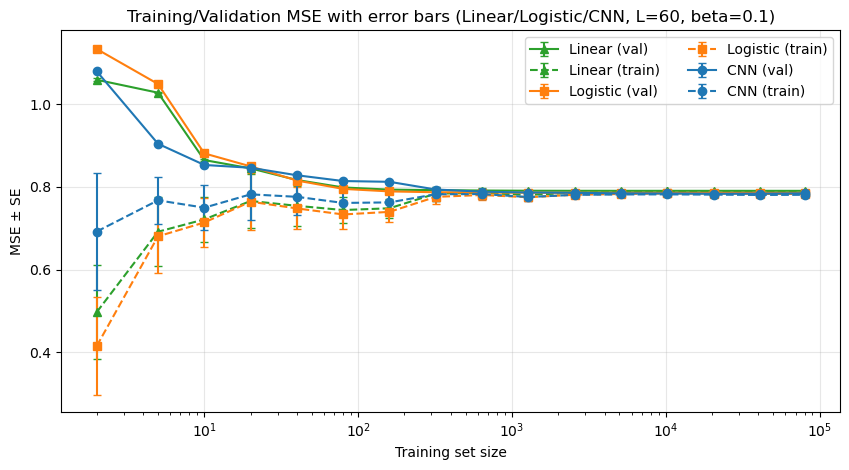

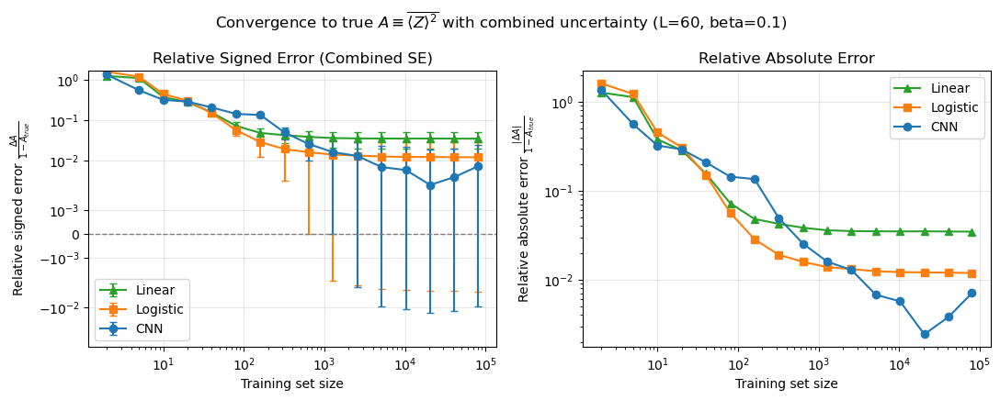

Processing L=100...
True MSE (using Zexp): 0.758946 ± 0.001957
n_train=     2 | Linear train=0.471609±0.024843, val=1.198545±0.001920 | Logistic train=0.357779±0.008271, val=1.371448±0.002277 | CNN train=0.554455±0.011534, val=1.053195±0.001984
n_train=     5 | Linear train=0.697726±0.037011, val=0.886799±0.001807 | Logistic train=0.683439±0.041155, val=0.921279±0.001945 | CNN train=0.727015±0.057270, val=0.858541±0.001879
n_train=    10 | Linear train=0.697207±0.064076, val=0.832787±0.001741 | Logistic train=0.690607±0.066297, val=0.842966±0.001910 | CNN train=0.710037±0.074452, val=0.818685±0.001852
n_train=    20 | Linear train=0.757104±0.063172, val=0.809519±0.001630 | Logistic train=0.753294±0.065890, val=0.810303±0.001740 | CNN train=0.765173±0.066692, val=0.804574±0.001713
n_train=    40 | Linear train=0.762013±0.039756, val=0.794400±0.001676 | Logistic train=0.758078±0.041771, val=0.790904±0.001790 | CNN train=0.771272±0.042343, val=0.793509±0.001767
n_train=    80 | Linear tra

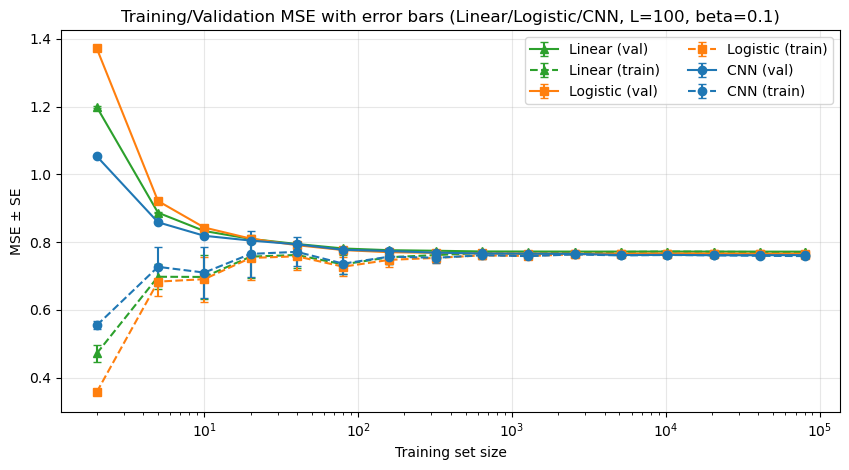

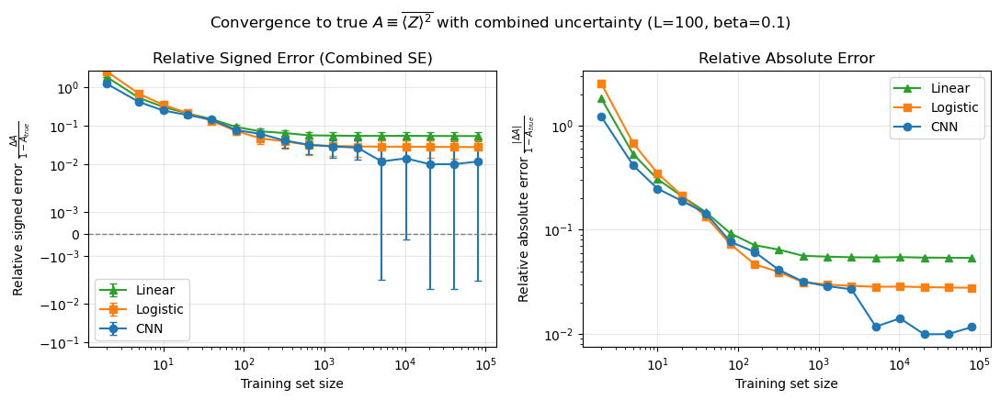

Processing L=200...
True MSE (using Zexp): 0.737140 ± 0.001996
n_train=     2 | Linear train=0.513737±0.110831, val=1.167358±0.001269 | Logistic train=0.434619±0.122651, val=1.372065±0.001485 | CNN train=0.692849±0.147092, val=1.001734±0.001197
n_train=     5 | Linear train=0.651337±0.071747, val=0.880742±0.001475 | Logistic train=0.643966±0.077111, val=0.906311±0.001643 | CNN train=0.732353±0.062988, val=0.789894±0.001440
n_train=    10 | Linear train=0.654684±0.059707, val=0.821089±0.001339 | Logistic train=0.647272±0.061828, val=0.836885±0.001512 | CNN train=0.705279±0.063143, val=0.773207±0.001348
n_train=    20 | Linear train=0.723612±0.043754, val=0.792984±0.001231 | Logistic train=0.718175±0.045433, val=0.795380±0.001327 | CNN train=0.752897±0.043926, val=0.766394±0.001240
n_train=    40 | Linear train=0.733928±0.029869, val=0.772336±0.001286 | Logistic train=0.728598±0.030880, val=0.768855±0.001370 | CNN train=0.754789±0.031019, val=0.766932±0.001346
n_train=    80 | Linear tra

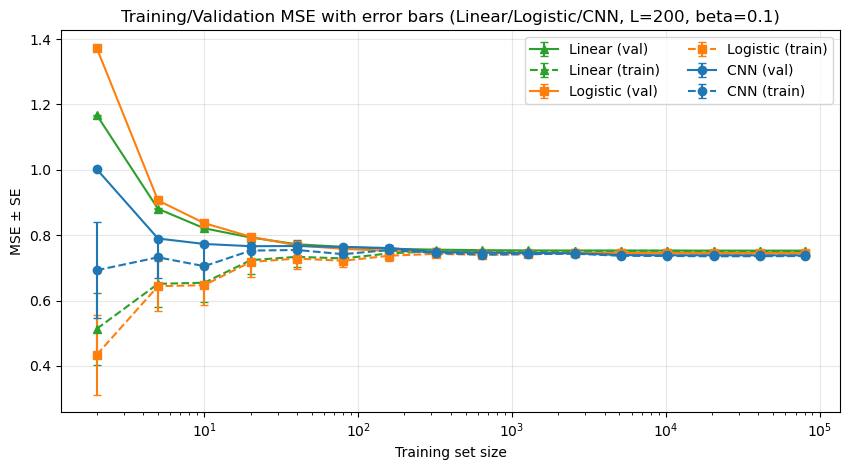

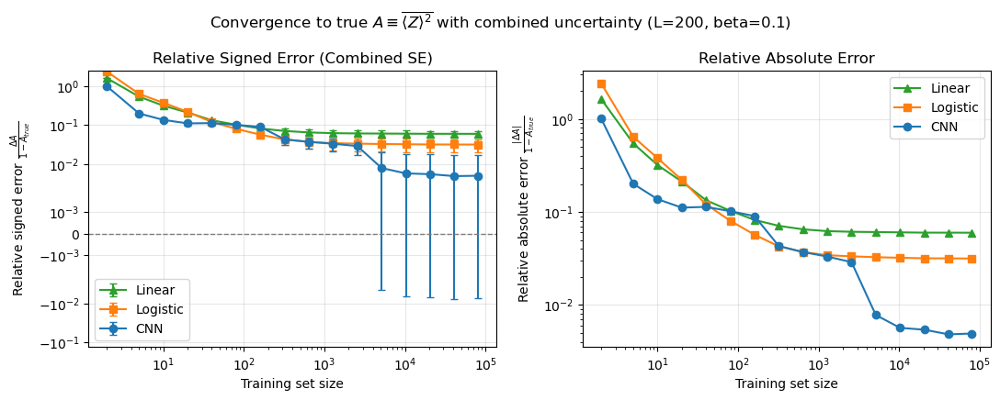

{20: (np.float64(0.8421061365473848), array([2.000e+00, 5.000e+00, 1.000e+01, 2.000e+01, 4.000e+01, 8.000e+01,
       1.600e+02, 3.200e+02, 6.400e+02, 1.280e+03, 2.560e+03, 5.120e+03,
       1.024e+04, 2.048e+04, 4.096e+04, 8.000e+04]), {'Linear': array([4.11965043, 1.38083865, 0.61795005, 0.22933471, 0.08850846,
       0.04318005, 0.055524  , 0.03654038, 0.03095311, 0.0244709 ,
       0.02095273, 0.02010399, 0.01990695, 0.01953547, 0.01931028,
       0.01914253]), 'Logistic': array([4.03639748, 1.38853395, 0.67944743, 0.23413511, 0.08193388,
       0.03177381, 0.04319011, 0.02461796, 0.01859309, 0.01178566,
       0.00843688, 0.00743613, 0.00716773, 0.00673927, 0.00648181,
       0.00640971]), 'CNN': array([5.41986260e+00, 1.41487276e+00, 7.65322599e-01, 2.30203086e-01,
       1.08183974e-01, 5.90620247e-02, 6.39925283e-02, 3.47892697e-02,
       1.81967151e-02, 1.22439464e-02, 1.04768775e-02, 8.14393877e-03,
       8.63242140e-03, 7.23454567e-03, 1.22035541e-02, 4.90424946e-03])}, {'

In [93]:
res = {}
beta = 0.1
for L in [20, 40, 60, 100, 200]:
    print(f"Processing L={L}...")
    res[L] = Plot_Convergence_Curves_PBC(L=L, beta=beta, save_fig=False)

print(res)
pickle.dump(res, open(f"figures/convergence_curves_pbc_results_beta{beta}.pkl", "wb"))

Processing L=20...
True MSE (using Zexp): 0.951535 ± 0.000591
n_train=     2 | Linear train=0.713960±0.124061, val=1.383353±0.001827 | Logistic train=0.720011±0.119649, val=1.356061±0.001846 | CNN train=0.681717±0.201048, val=1.492746±0.002484
n_train=     5 | Linear train=0.774903±0.142877, val=1.062241±0.002606 | Logistic train=0.772638±0.142022, val=1.066513±0.002639 | CNN train=0.746544±0.140180, val=1.097310±0.002617
n_train=    10 | Linear train=0.856686±0.108110, val=1.007435±0.002077 | Logistic train=0.861107±0.109793, val=1.010376±0.002121 | CNN train=0.853506±0.113238, val=1.012889±0.002178
n_train=    20 | Linear train=0.847169±0.076803, val=0.985340±0.002741 | Logistic train=0.852631±0.079647, val=0.988409±0.002845 | CNN train=0.849123±0.077295, val=0.990267±0.002741
n_train=    40 | Linear train=0.912445±0.049014, val=0.968377±0.002304 | Logistic train=0.915044±0.050029, val=0.968709±0.002328 | CNN train=0.912931±0.045292, val=0.967056±0.002107
n_train=    80 | Linear trai

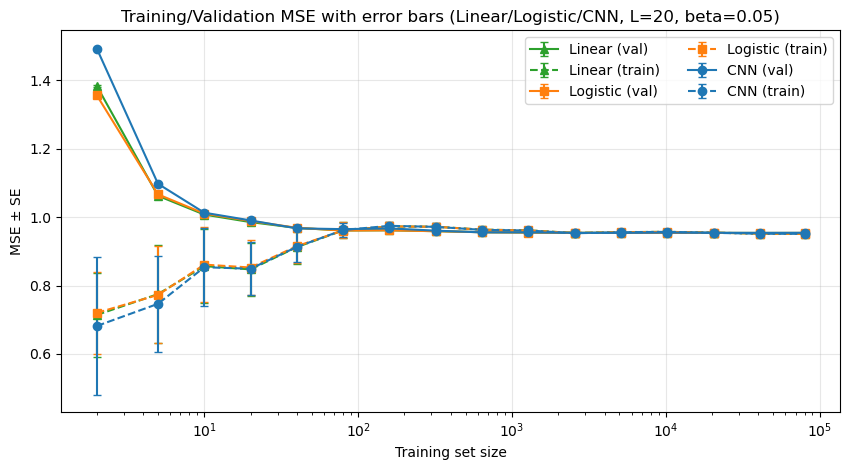

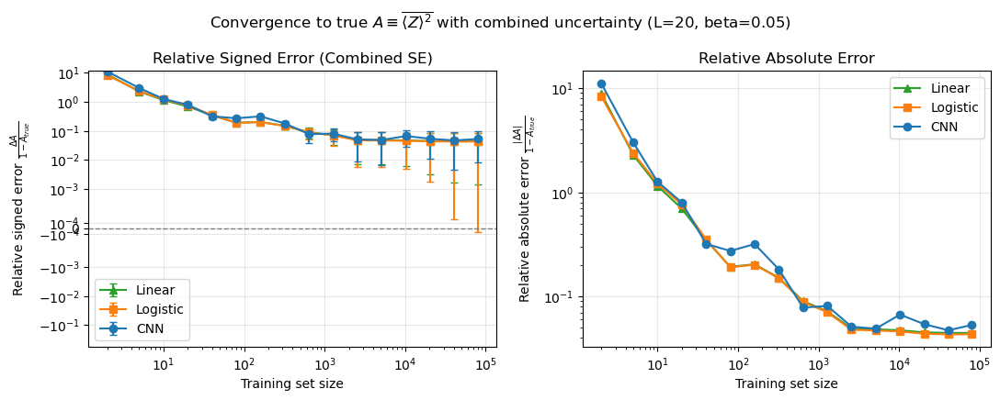

Processing L=40...
True MSE (using Zexp): 0.934041 ± 0.000769
n_train=     2 | Linear train=0.467113±0.062879, val=1.288959±0.003815 | Logistic train=0.406445±0.026398, val=1.368816±0.003921 | CNN train=0.549317±0.022604, val=1.287209±0.003033
n_train=     5 | Linear train=0.772346±0.149720, val=1.075094±0.001881 | Logistic train=0.772365±0.151351, val=1.084575±0.001935 | CNN train=0.776382±0.132324, val=1.056287±0.001856
n_train=    10 | Linear train=0.876694±0.065914, val=1.004190±0.001334 | Logistic train=0.878447±0.066477, val=1.004483±0.001347 | CNN train=0.883726±0.051894, val=0.998169±0.001083
n_train=    20 | Linear train=0.877278±0.062203, val=0.968587±0.001817 | Logistic train=0.878107±0.063278, val=0.969684±0.001852 | CNN train=0.868523±0.053240, val=0.975697±0.001750
n_train=    40 | Linear train=0.923012±0.044083, val=0.950792±0.001712 | Logistic train=0.923236±0.044617, val=0.950833±0.001732 | CNN train=0.934541±0.040348, val=0.960879±0.001617
n_train=    80 | Linear trai

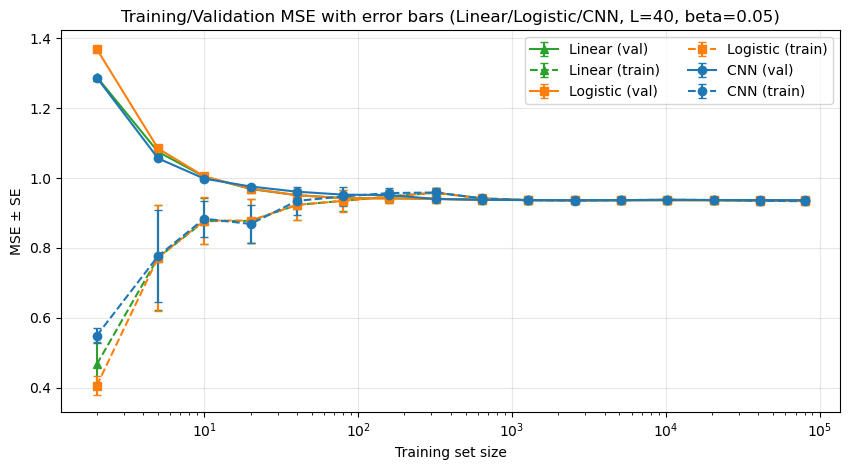

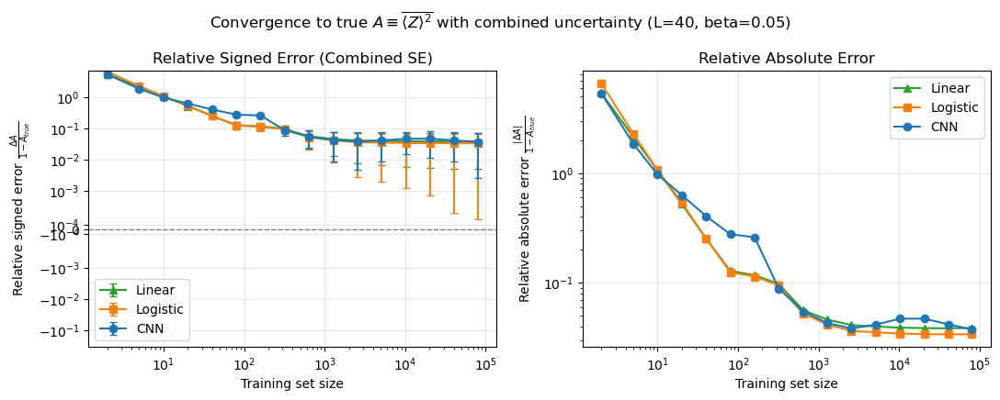

Processing L=60...
True MSE (using Zexp): 0.923115 ± 0.000866
n_train=     2 | Linear train=0.405536±0.088472, val=1.334635±0.005290 | Logistic train=0.352214±0.079822, val=1.387768±0.004361 | CNN train=0.689695±0.102181, val=1.218657±0.001363
n_train=     5 | Linear train=0.787178±0.076131, val=1.179636±0.001372 | Logistic train=0.779166±0.077401, val=1.200275±0.001325 | CNN train=0.855072±0.046379, val=1.044966±0.001057
n_train=    10 | Linear train=0.873277±0.044884, val=1.007351±0.001505 | Logistic train=0.870024±0.046389, val=1.007970±0.001509 | CNN train=0.902724±0.030697, val=0.985683±0.001033
n_train=    20 | Linear train=0.889928±0.058544, val=0.964046±0.001699 | Logistic train=0.890463±0.059868, val=0.964675±0.001721 | CNN train=0.907573±0.040224, val=0.963999±0.001252
n_train=    40 | Linear train=0.895583±0.045796, val=0.945828±0.001931 | Logistic train=0.896623±0.046760, val=0.945869±0.001961 | CNN train=0.926260±0.030852, val=0.956835±0.001396
n_train=    80 | Linear trai

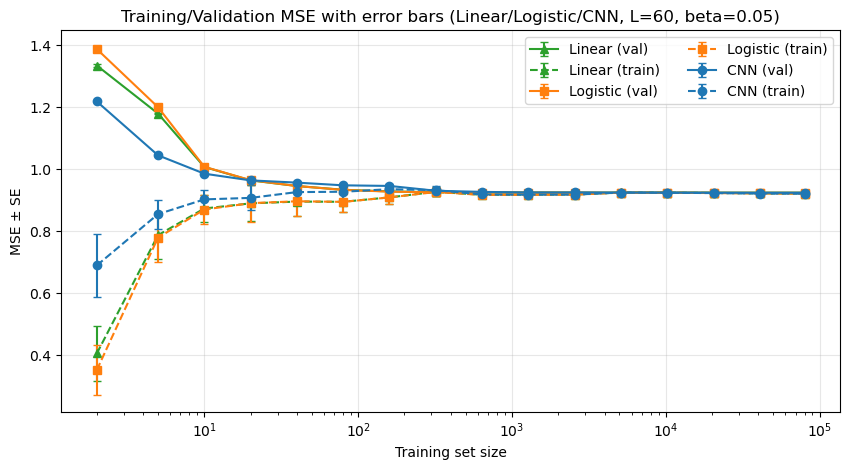

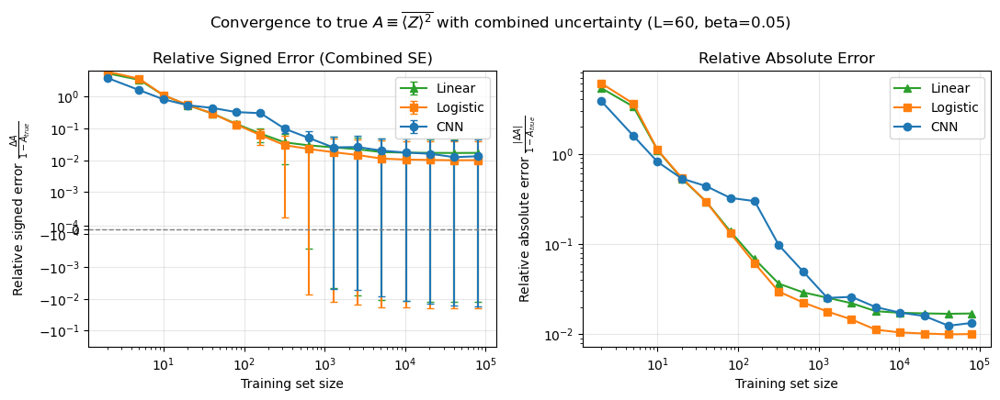

Processing L=100...
True MSE (using Zexp): 0.904964 ± 0.001007
n_train=     2 | Linear train=0.442417±0.000906, val=1.300754±0.002222 | Logistic train=0.290762±0.036403, val=1.560097±0.002464 | CNN train=0.513859±0.016204, val=1.278377±0.002524
n_train=     5 | Linear train=0.723624±0.064162, val=1.075140±0.002244 | Logistic train=0.720840±0.066271, val=1.100719±0.002362 | CNN train=0.747942±0.055660, val=1.035062±0.002178
n_train=    10 | Linear train=0.822171±0.043080, val=0.997191±0.001717 | Logistic train=0.823635±0.043690, val=0.999207±0.001790 | CNN train=0.832592±0.045679, val=0.977747±0.001872
n_train=    20 | Linear train=0.894720±0.047238, val=0.962118±0.001351 | Logistic train=0.894058±0.047350, val=0.961880±0.001374 | CNN train=0.919965±0.052116, val=0.950861±0.001417
n_train=    40 | Linear train=0.895196±0.038644, val=0.934919±0.001644 | Logistic train=0.895002±0.039345, val=0.934246±0.001687 | CNN train=0.908190±0.041610, val=0.931893±0.001739
n_train=    80 | Linear tra

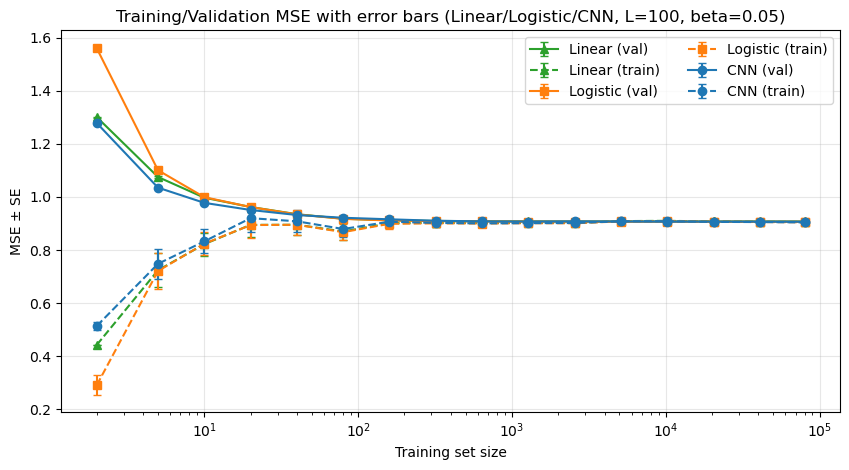

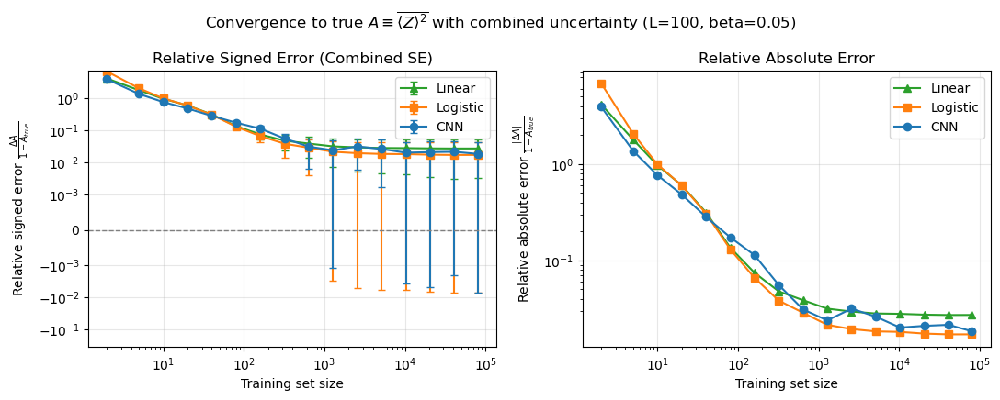

{20: (np.float64(0.9515349359861988), array([2.000e+00, 5.000e+00, 1.000e+01, 2.000e+01, 4.000e+01, 8.000e+01,
       1.600e+02, 3.200e+02, 6.400e+02, 1.280e+03, 2.560e+03, 5.120e+03,
       1.024e+04, 2.048e+04, 4.096e+04, 8.000e+04]), {'Linear': array([8.90988329, 2.28424858, 1.15341144, 0.69750965, 0.34751397,
       0.19257883, 0.20394504, 0.15106011, 0.09034653, 0.07184211,
       0.049152  , 0.04835776, 0.04731905, 0.04520275, 0.04460889,
       0.04466839]), 'Logistic': array([8.34675317, 2.37239928, 1.21409926, 0.76084629, 0.35436319,
       0.19068646, 0.20191374, 0.14962062, 0.08865953, 0.07052543,
       0.04788024, 0.04709314, 0.04603424, 0.04388324, 0.04324863,
       0.04331013]), 'CNN': array([11.1670447 ,  3.0078345 ,  1.26593734,  0.79917449,  0.32025829,
        0.27383646,  0.31889562,  0.18244525,  0.07819353,  0.08113163,
        0.0512119 ,  0.04903507,  0.06701421,  0.05413648,  0.04727762,
        0.05332355])}, {'Linear': array([0.04145909, 0.05645839, 0.046192

In [100]:
res005 = {}
beta = 0.05
for L in [20, 40, 60, 100]:
    print(f"Processing L={L}...")
    res005[L] = Plot_Convergence_Curves_PBC(L=L, beta=beta, save_fig=False)

print(res005)
pickle.dump(res005, open(f"figures/convergence_curves_pbc_results_beta{beta}.pkl", "wb"))

Processing L=200...
True MSE (using Zexp): 0.881053 ± 0.001156
n_train=     2 | Linear train=0.505308±0.081007, val=1.583854±0.001933 | Logistic train=0.413094±0.039606, val=1.813672±0.001620 | CNN train=0.664894±0.069127, val=1.285976±0.001025
n_train=     5 | Linear train=0.816294±0.048946, val=1.053703±0.001571 | Logistic train=0.814648±0.052366, val=1.045889±0.001597 | CNN train=0.880741±0.030713, val=1.028646±0.000595
n_train=    10 | Linear train=0.854903±0.053044, val=0.971956±0.001489 | Logistic train=0.854390±0.055139, val=0.968705±0.001522 | CNN train=0.913577±0.025413, val=0.959159±0.000829
n_train=    20 | Linear train=0.884198±0.041547, val=0.922271±0.001387 | Logistic train=0.880069±0.041437, val=0.921413±0.001424 | CNN train=0.913719±0.028000, val=0.926880±0.001048
n_train=    40 | Linear train=0.881527±0.034930, val=0.904505±0.001565 | Logistic train=0.878270±0.035088, val=0.902823±0.001609 | CNN train=0.920604±0.029285, val=0.914154±0.001320
n_train=    80 | Linear tra

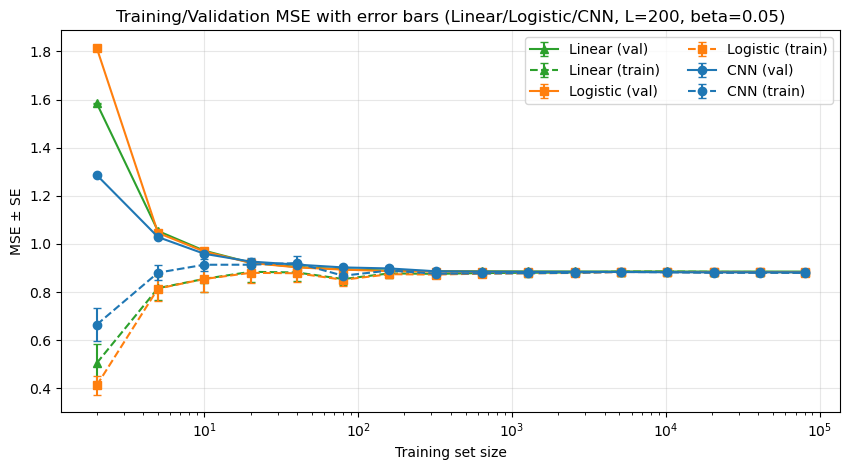

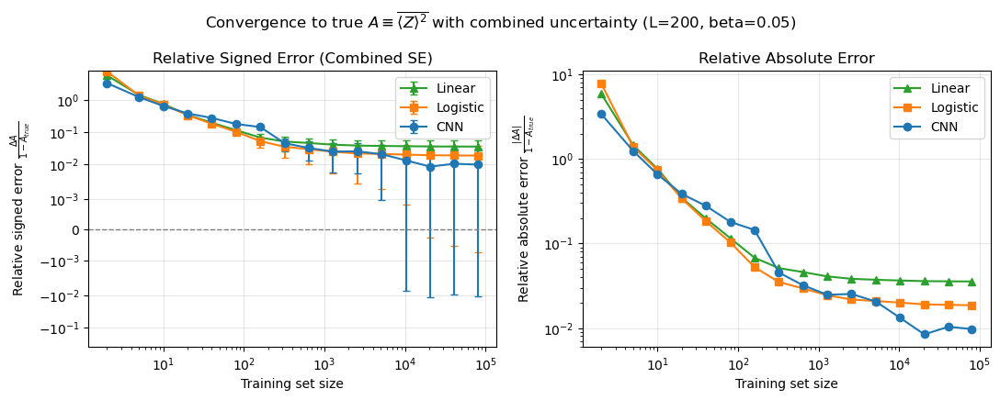

{20: (np.float64(0.9515349359861988), array([2.000e+00, 5.000e+00, 1.000e+01, 2.000e+01, 4.000e+01, 8.000e+01,
       1.600e+02, 3.200e+02, 6.400e+02, 1.280e+03, 2.560e+03, 5.120e+03,
       1.024e+04, 2.048e+04, 4.096e+04, 8.000e+04]), {'Linear': array([8.90988329, 2.28424858, 1.15341144, 0.69750965, 0.34751397,
       0.19257883, 0.20394504, 0.15106011, 0.09034653, 0.07184211,
       0.049152  , 0.04835776, 0.04731905, 0.04520275, 0.04460889,
       0.04466839]), 'Logistic': array([8.34675317, 2.37239928, 1.21409926, 0.76084629, 0.35436319,
       0.19068646, 0.20191374, 0.14962062, 0.08865953, 0.07052543,
       0.04788024, 0.04709314, 0.04603424, 0.04388324, 0.04324863,
       0.04331013]), 'CNN': array([11.1670447 ,  3.0078345 ,  1.26593734,  0.79917449,  0.32025829,
        0.27383646,  0.31889562,  0.18244525,  0.07819353,  0.08113163,
        0.0512119 ,  0.04903507,  0.06701421,  0.05413648,  0.04727762,
        0.05332355])}, {'Linear': array([0.04145909, 0.05645839, 0.046192

In [104]:
beta = 0.05
for L in [200]:
    print(f"Processing L={L}...")
    res005[L] = Plot_Convergence_Curves_PBC(L=L, beta=beta, save_fig=False)

print(res005)
pickle.dump(res005, open(f"figures/convergence_curves_pbc_results_beta{beta}.pkl", "wb"))

Processing L=20...
True MSE (using Zexp): 0.991634 ± 0.000111
n_train=     2 | Linear train=0.740357±0.160816, val=1.377026±0.001652 | Logistic train=0.748262±0.151033, val=1.312972±0.001515 | CNN train=0.721276±0.206942, val=1.456586±0.001975
n_train=     5 | Linear train=0.849172±0.118477, val=1.110562±0.001781 | Logistic train=0.847492±0.118442, val=1.107786±0.001763 | CNN train=0.813169±0.118970, val=1.128890±0.001730
n_train=    10 | Linear train=0.950028±0.028683, val=1.050940±0.000622 | Logistic train=0.949796±0.028742, val=1.048955±0.000608 | CNN train=0.943450±0.023562, val=1.048208±0.000554
n_train=    20 | Linear train=0.961407±0.035647, val=1.013346±0.001230 | Logistic train=0.961825±0.035675, val=1.013204±0.001225 | CNN train=0.960799±0.030138, val=1.009757±0.001058
n_train=    40 | Linear train=0.988300±0.005997, val=1.007646±0.000289 | Logistic train=0.988320±0.005983, val=1.007609±0.000288 | CNN train=0.987417±0.006163, val=1.004385±0.000289
n_train=    80 | Linear trai

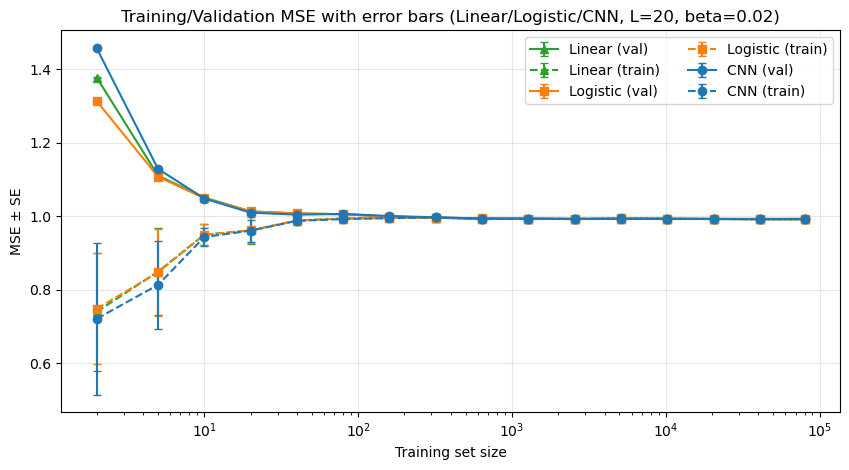

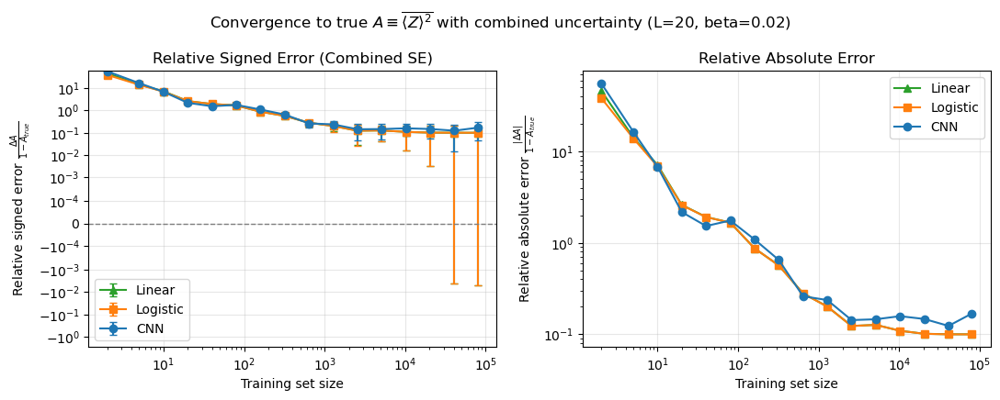

Processing L=40...
True MSE (using Zexp): 0.988072 ± 0.000160
n_train=     2 | Linear train=0.466816±0.059220, val=1.419962±0.004203 | Logistic train=0.425174±0.029489, val=1.503089±0.003970 | CNN train=0.547380±0.067397, val=1.413706±0.003418
n_train=     5 | Linear train=0.818926±0.116996, val=1.149713±0.001332 | Logistic train=0.817458±0.117950, val=1.151732±0.001319 | CNN train=0.825823±0.115045, val=1.116938±0.001216
n_train=    10 | Linear train=0.948813±0.028052, val=1.045545±0.000464 | Logistic train=0.947515±0.027844, val=1.045074±0.000460 | CNN train=0.955222±0.025701, val=1.048125±0.000472
n_train=    20 | Linear train=0.955292±0.034958, val=1.018203±0.000905 | Logistic train=0.955560±0.034983, val=1.018312±0.000902 | CNN train=0.961518±0.025807, val=1.021995±0.000700
n_train=    40 | Linear train=0.981617±0.018324, val=1.001638±0.000688 | Logistic train=0.981645±0.018329, val=1.001641±0.000688 | CNN train=0.977730±0.013374, val=1.007891±0.000530
n_train=    80 | Linear trai

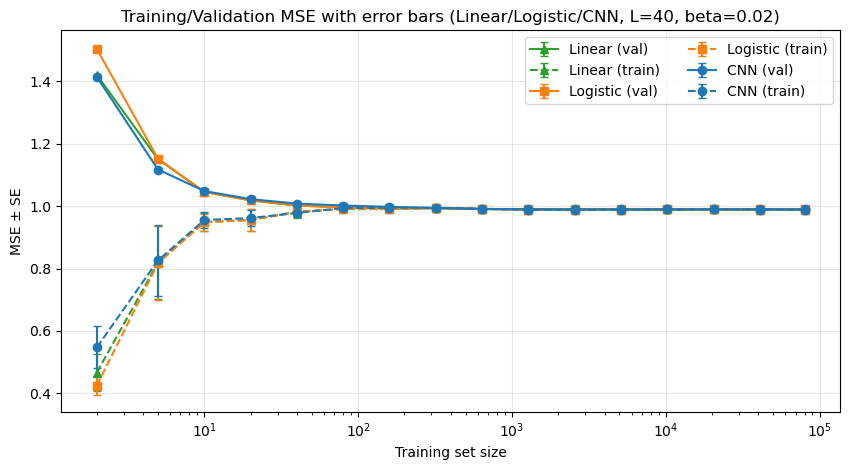

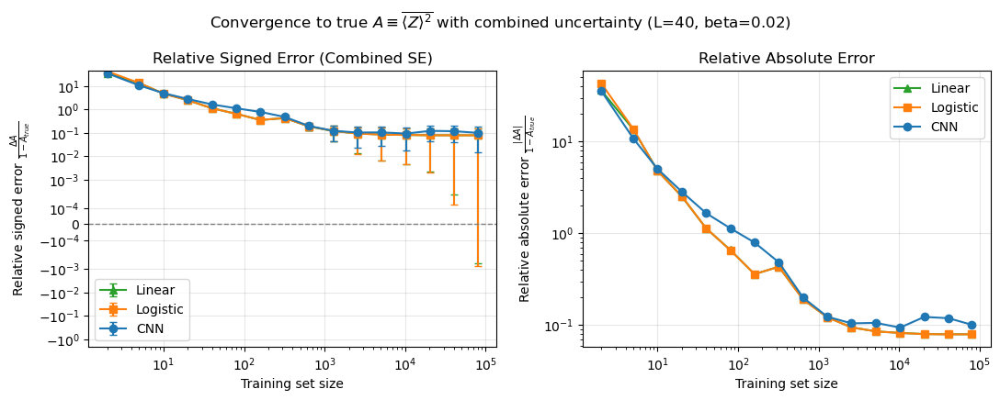

Processing L=60...
True MSE (using Zexp): 0.985881 ± 0.000187
n_train=     2 | Linear train=0.381745±0.077871, val=1.551410±0.005987 | Logistic train=0.320253±0.065462, val=1.575883±0.004737 | CNN train=0.702512±0.082935, val=1.266520±0.001534
n_train=     5 | Linear train=0.747042±0.136852, val=1.236733±0.001835 | Logistic train=0.747628±0.140877, val=1.240852±0.001737 | CNN train=0.807024±0.108957, val=1.134512±0.001579
n_train=    10 | Linear train=0.912720±0.056109, val=1.061926±0.001254 | Logistic train=0.911607±0.056051, val=1.060279±0.001229 | CNN train=0.935553±0.035697, val=1.035749±0.000842
n_train=    20 | Linear train=0.947743±0.038501, val=1.022859±0.001064 | Logistic train=0.947979±0.038841, val=1.022926±0.001062 | CNN train=0.965916±0.020681, val=1.011512±0.000624
n_train=    40 | Linear train=0.953010±0.034280, val=1.008094±0.001403 | Logistic train=0.953150±0.034398, val=1.008062±0.001401 | CNN train=0.969637±0.016946, val=1.003222±0.000729
n_train=    80 | Linear trai

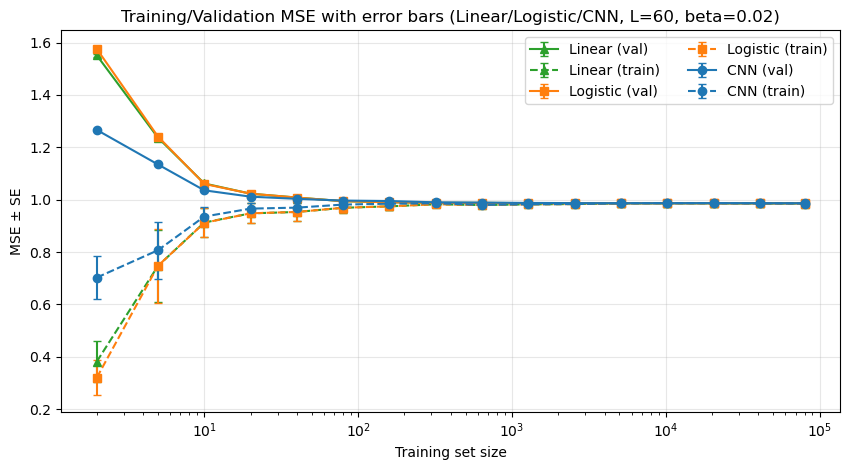

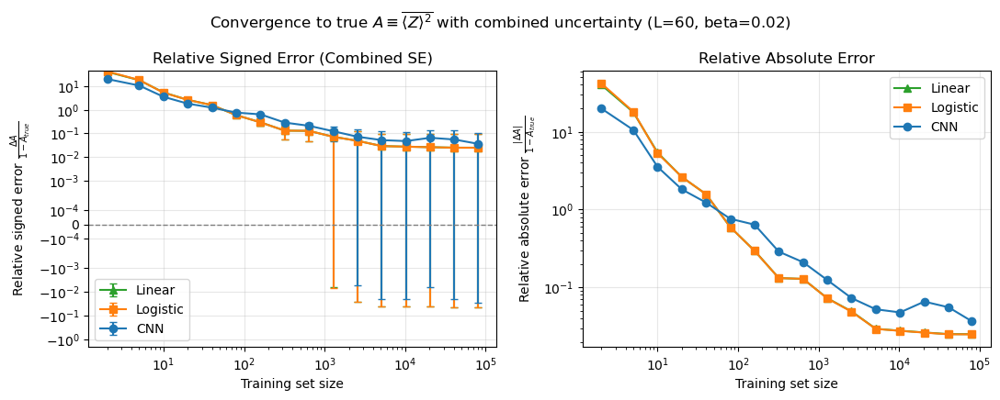

Processing L=100...
True MSE (using Zexp): 0.981404 ± 0.000243
n_train=     2 | Linear train=0.483630±0.025801, val=1.388516±0.002373 | Logistic train=0.376402±0.027771, val=1.617732±0.002418 | CNN train=0.589667±0.035207, val=1.327197±0.002552
n_train=     5 | Linear train=0.715564±0.086842, val=1.192201±0.002723 | Logistic train=0.718399±0.093391, val=1.224253±0.002731 | CNN train=0.749940±0.074928, val=1.145079±0.002633
n_train=    10 | Linear train=0.905543±0.050675, val=1.048888±0.001339 | Logistic train=0.906305±0.051232, val=1.048062±0.001335 | CNN train=0.914378±0.047927, val=1.020064±0.001207
n_train=    20 | Linear train=0.961488±0.015613, val=1.022786±0.000442 | Logistic train=0.961606±0.015648, val=1.022856±0.000441 | CNN train=0.969342±0.011024, val=1.011538±0.000331
n_train=    40 | Linear train=0.964766±0.023822, val=1.003106±0.000926 | Logistic train=0.964451±0.023798, val=1.003053±0.000927 | CNN train=0.979486±0.016679, val=0.998179±0.000656
n_train=    80 | Linear tra

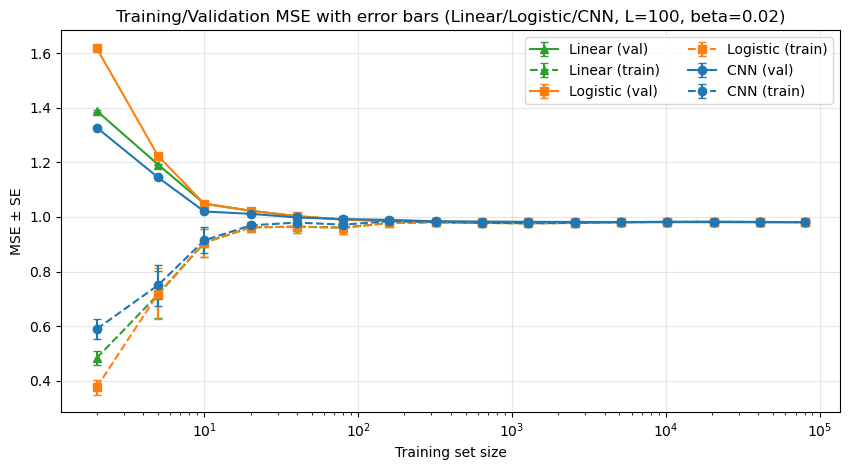

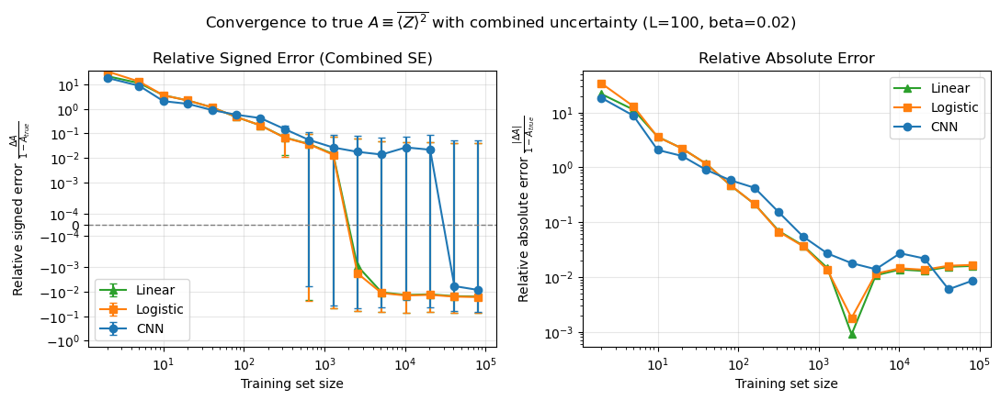

{20: (np.float64(0.9916336173151097), array([2.000e+00, 5.000e+00, 1.000e+01, 2.000e+01, 4.000e+01, 8.000e+01,
       1.600e+02, 3.200e+02, 6.400e+02, 1.280e+03, 2.560e+03, 5.120e+03,
       1.024e+04, 2.048e+04, 4.096e+04, 8.000e+04]), {'Linear': array([46.06441917, 14.21500623,  7.08864637,  2.59524209,  1.91394212,
        1.66184096,  0.86811744,  0.56506996,  0.27903215,  0.20041404,
        0.12281589,  0.1262177 ,  0.10879328,  0.10084208,  0.09960173,
        0.09952148]), 'Logistic': array([38.40833263, 13.88324747,  6.85137524,  2.57816134,  1.90951701,
        1.65896952,  0.86763758,  0.56400691,  0.2784791 ,  0.19979117,
        0.12269909,  0.126133  ,  0.10873545,  0.10075623,  0.09946674,
        0.09938837]), 'CNN': array([55.57394161, 16.40574942,  6.76212197,  2.16617715,  1.52409222,
        1.75189893,  1.08576236,  0.64785283,  0.25964244,  0.23587576,
        0.14237641,  0.14538999,  0.15720209,  0.14641589,  0.12299831,
        0.16817351])}, {'Linear': array([

In [101]:
res002 = {}
beta = 0.02
for L in [20, 40, 60, 100]:
    print(f"Processing L={L}...")
    res002[L] = Plot_Convergence_Curves_PBC(L=L, beta=beta, save_fig=False)

print(res002)
pickle.dump(res002, open(f"figures/convergence_curves_pbc_results_beta{beta}.pkl", "wb"))

Processing L=200...
True MSE (using Zexp): 0.974214 ± 0.000327
n_train=     2 | Linear train=0.565348±0.104432, val=1.472579±0.001244 | Logistic train=0.525108±0.101168, val=1.621561±0.001228 | CNN train=0.705543±0.076545, val=1.283358±0.000956
n_train=     5 | Linear train=0.839529±0.034956, val=1.140058±0.000790 | Logistic train=0.839155±0.036681, val=1.140234±0.000784 | CNN train=0.910312±0.038993, val=1.049631±0.000506
n_train=    10 | Linear train=0.906813±0.029382, val=1.068741±0.000781 | Logistic train=0.906853±0.029604, val=1.067307±0.000771 | CNN train=0.948691±0.014103, val=1.021644±0.000366
n_train=    20 | Linear train=0.954951±0.012068, val=1.022665±0.000463 | Logistic train=0.955004±0.012105, val=1.022422±0.000463 | CNN train=0.976592±0.009508, val=1.006403±0.000286
n_train=    40 | Linear train=0.973092±0.011452, val=0.999645±0.000562 | Logistic train=0.973142±0.011510, val=0.999535±0.000564 | CNN train=0.985374±0.005743, val=0.999993±0.000258
n_train=    80 | Linear tra

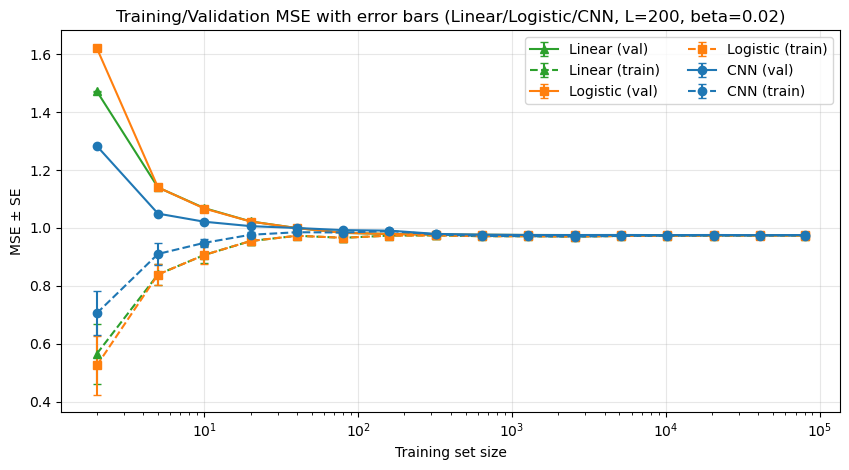

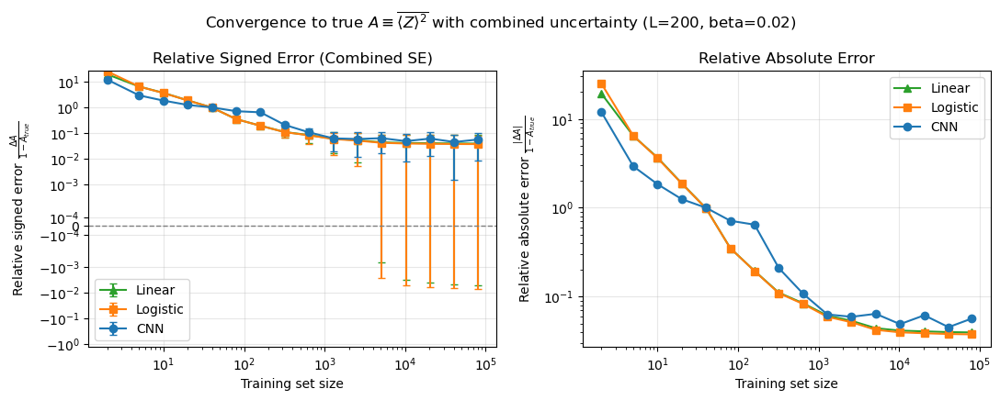

{20: (np.float64(0.9916336173151097), array([2.000e+00, 5.000e+00, 1.000e+01, 2.000e+01, 4.000e+01, 8.000e+01,
       1.600e+02, 3.200e+02, 6.400e+02, 1.280e+03, 2.560e+03, 5.120e+03,
       1.024e+04, 2.048e+04, 4.096e+04, 8.000e+04]), {'Linear': array([46.06441917, 14.21500623,  7.08864637,  2.59524209,  1.91394212,
        1.66184096,  0.86811744,  0.56506996,  0.27903215,  0.20041404,
        0.12281589,  0.1262177 ,  0.10879328,  0.10084208,  0.09960173,
        0.09952148]), 'Logistic': array([38.40833263, 13.88324747,  6.85137524,  2.57816134,  1.90951701,
        1.65896952,  0.86763758,  0.56400691,  0.2784791 ,  0.19979117,
        0.12269909,  0.126133  ,  0.10873545,  0.10075623,  0.09946674,
        0.09938837]), 'CNN': array([55.57394161, 16.40574942,  6.76212197,  2.16617715,  1.52409222,
        1.75189893,  1.08576236,  0.64785283,  0.25964244,  0.23587576,
        0.14237641,  0.14538999,  0.15720209,  0.14641589,  0.12299831,
        0.16817351])}, {'Linear': array([

In [103]:
beta = 0.02
for L in [200]:
    print(f"Processing L={L}...")
    res002[L] = Plot_Convergence_Curves_PBC(L=L, beta=beta, save_fig=False)

print(res002)
pickle.dump(res002, open(f"figures/convergence_curves_pbc_results_beta{beta}.pkl", "wb"))

Processing L=20...
True MSE (using Zexp): 0.997887 ± 0.000029
n_train=     2 | Linear train=0.723801±0.247519, val=1.403267±0.002673 | Logistic train=0.719100±0.216718, val=1.347343±0.002537 | CNN train=0.678050±0.286043, val=1.497490±0.003335
n_train=     5 | Linear train=0.834856±0.111426, val=1.143758±0.001598 | Logistic train=0.838474±0.111945, val=1.137340±0.001543 | CNN train=0.802969±0.109482, val=1.162630±0.001529
n_train=    10 | Linear train=0.935335±0.032700, val=1.075997±0.000781 | Logistic train=0.937358±0.033468, val=1.074222±0.000768 | CNN train=0.931811±0.029999, val=1.068650±0.000715
n_train=    20 | Linear train=0.972227±0.019332, val=1.022164±0.000643 | Logistic train=0.972267±0.019299, val=1.021995±0.000640 | CNN train=0.971412±0.017177, val=1.017846±0.000600
n_train=    40 | Linear train=0.980622±0.018692, val=1.025580±0.000918 | Logistic train=0.980551±0.018683, val=1.025465±0.000915 | CNN train=0.981411±0.014515, val=1.021620±0.000719
n_train=    80 | Linear trai

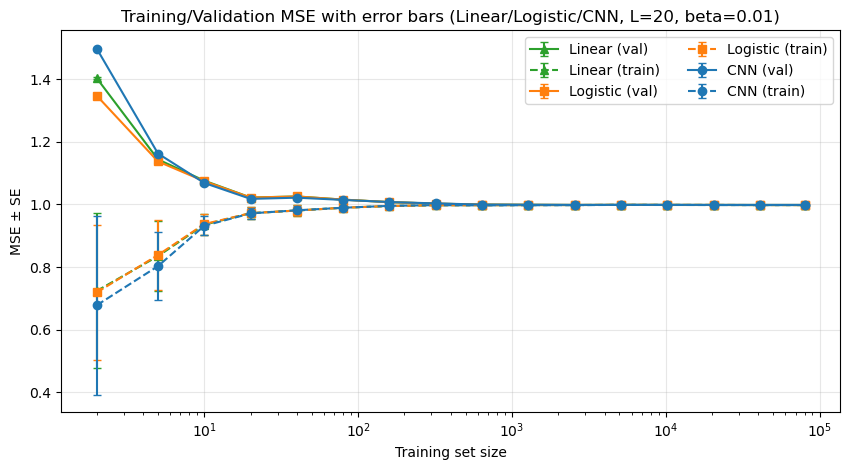

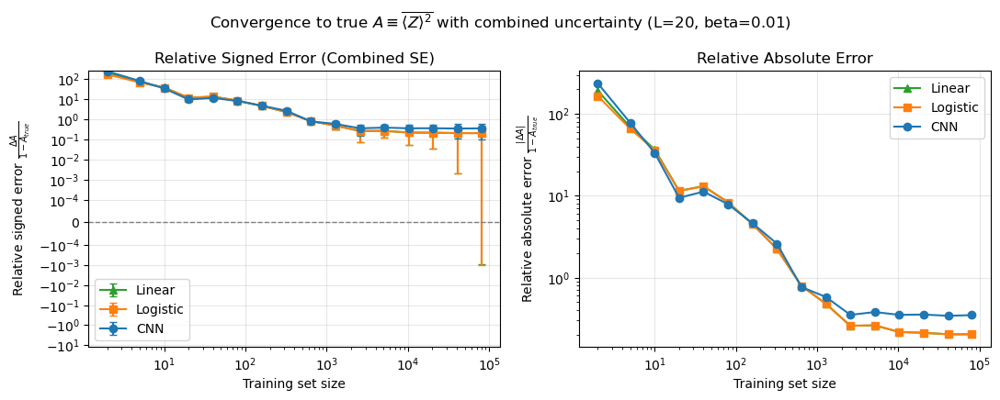

Processing L=40...
True MSE (using Zexp): 0.996972 ± 0.000042
n_train=     2 | Linear train=0.409141±0.014030, val=1.531494±0.005024 | Logistic train=0.340034±0.010805, val=1.599323±0.004554 | CNN train=0.465543±0.007354, val=1.521595±0.004373
n_train=     5 | Linear train=0.812310±0.062933, val=1.168885±0.000996 | Logistic train=0.814228±0.063544, val=1.173264±0.000986 | CNN train=0.827240±0.081126, val=1.135106±0.000906
n_train=    10 | Linear train=0.938408±0.033314, val=1.068120±0.000975 | Logistic train=0.938027±0.033207, val=1.068003±0.000972 | CNN train=0.941456±0.034235, val=1.062085±0.000893
n_train=    20 | Linear train=0.970806±0.013347, val=1.025160±0.000378 | Logistic train=0.971174±0.013325, val=1.025071±0.000378 | CNN train=0.978960±0.014220, val=1.025955±0.000403
n_train=    40 | Linear train=0.990269±0.006392, val=1.007910±0.000260 | Logistic train=0.990230±0.006392, val=1.007894±0.000261 | CNN train=0.985483±0.007975, val=1.011443±0.000340
n_train=    80 | Linear trai

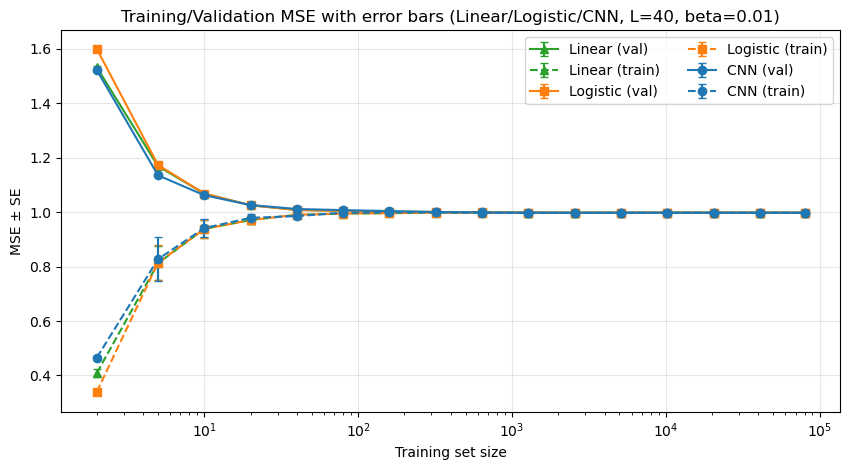

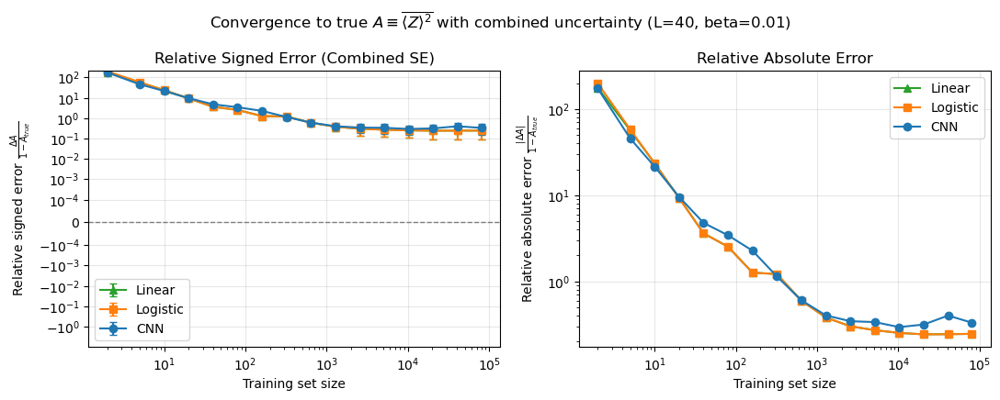

Processing L=60...
True MSE (using Zexp): 0.996403 ± 0.000049
n_train=     2 | Linear train=0.509667±0.131146, val=1.548426±0.005052 | Logistic train=0.437161±0.041829, val=1.614891±0.003614 | CNN train=0.719662±0.041090, val=1.312963±0.001497
n_train=     5 | Linear train=0.750983±0.096142, val=1.282919±0.001362 | Logistic train=0.742942±0.097203, val=1.319478±0.001347 | CNN train=0.823416±0.086146, val=1.134801±0.001171
n_train=    10 | Linear train=0.913325±0.034848, val=1.092364±0.000667 | Logistic train=0.913173±0.034553, val=1.089981±0.000652 | CNN train=0.940570±0.025848, val=1.054348±0.000639
n_train=    20 | Linear train=0.962737±0.022708, val=1.033306±0.000617 | Logistic train=0.962594±0.022785, val=1.032920±0.000614 | CNN train=0.979587±0.015652, val=1.017914±0.000440
n_train=    40 | Linear train=0.973866±0.023537, val=1.015213±0.001003 | Logistic train=0.973893±0.023536, val=1.015141±0.000999 | CNN train=0.981016±0.010842, val=1.011140±0.000462
n_train=    80 | Linear trai

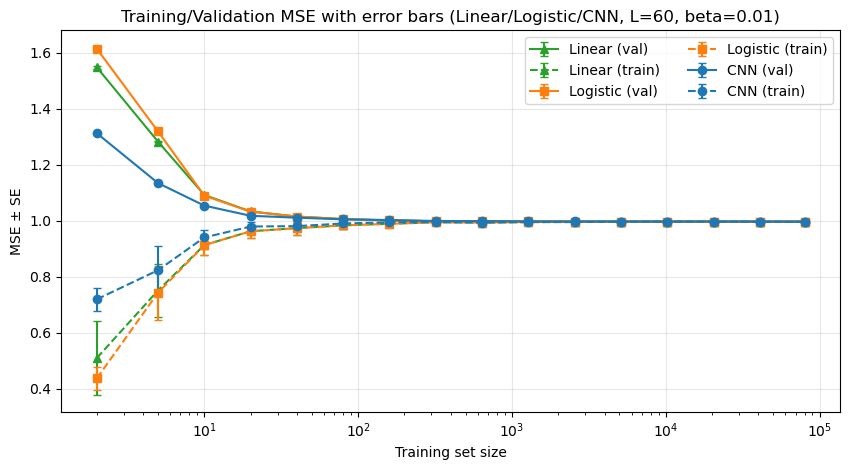

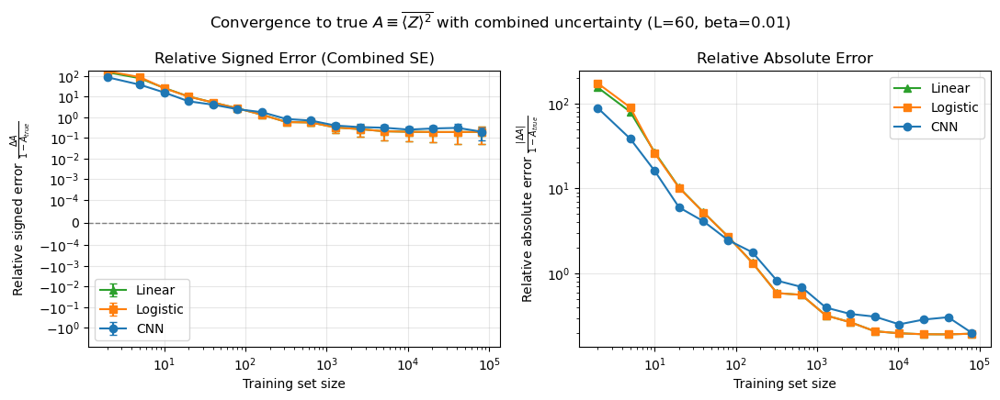

{20: (np.float64(0.9978866382231594), array([2.000e+00, 5.000e+00, 1.000e+01, 2.000e+01, 4.000e+01, 8.000e+01,
       1.600e+02, 3.200e+02, 6.400e+02, 1.280e+03, 2.560e+03, 5.120e+03,
       1.024e+04, 2.048e+04, 4.096e+04, 8.000e+04]), {'Linear': array([191.81778917,  69.0235983 ,  36.96023791,  11.48752628,
        13.10386057,   8.31643215,   4.50610053,   2.2456483 ,
         0.79373474,   0.47960698,   0.25791755,   0.26085884,
         0.21651027,   0.21142203,   0.20306567,   0.2026143 ]), 'Logistic': array([165.35565921,  65.98631398,  36.12050189,  11.40739499,
        13.04935863,   8.29398733,   4.50493157,   2.24508103,
         0.7925335 ,   0.47868261,   0.25779114,   0.26080894,
         0.2164727 ,   0.21139604,   0.20299133,   0.20251187]), 'CNN': array([236.40204816,  77.95331777,  33.48396258,   9.44430389,
        11.23021927,   7.88582322,   4.61402353,   2.59977089,
         0.76720657,   0.58024417,   0.35049674,   0.37926452,
         0.35075057,   0.35348633,  

In [102]:
res001 = {}
beta = 0.01
for L in [20, 40, 60]:
    print(f"Processing L={L}...")
    res001[L] = Plot_Convergence_Curves_PBC(L=L, beta=beta, save_fig=False)

print(res001)
pickle.dump(res001, open(f"figures/convergence_curves_pbc_results_beta{beta}.pkl", "wb"))

Processing L=100...
True MSE (using Zexp): 0.995175 ± 0.000066
n_train=     2 | Linear train=0.569152±0.029280, val=1.400997±0.002037 | Logistic train=0.469582±0.031633, val=1.618188±0.002311 | CNN train=0.635682±0.015447, val=1.341188±0.001541
n_train=     5 | Linear train=0.795156±0.097620, val=1.201049±0.002435 | Logistic train=0.795279±0.101567, val=1.200270±0.002368 | CNN train=0.851084±0.078029, val=1.108551±0.001762
n_train=    10 | Linear train=0.939498±0.019746, val=1.062014±0.000645 | Logistic train=0.939575±0.019970, val=1.060586±0.000637 | CNN train=0.958328±0.011639, val=1.029338±0.000375
n_train=    20 | Linear train=0.968577±0.014548, val=1.037346±0.000388 | Logistic train=0.968435±0.014604, val=1.037108±0.000386 | CNN train=0.975720±0.010371, val=1.020896±0.000270
n_train=    40 | Linear train=0.981595±0.009633, val=1.013563±0.000427 | Logistic train=0.981538±0.009670, val=1.013491±0.000426 | CNN train=0.987953±0.004826, val=1.007781±0.000225
n_train=    80 | Linear tra

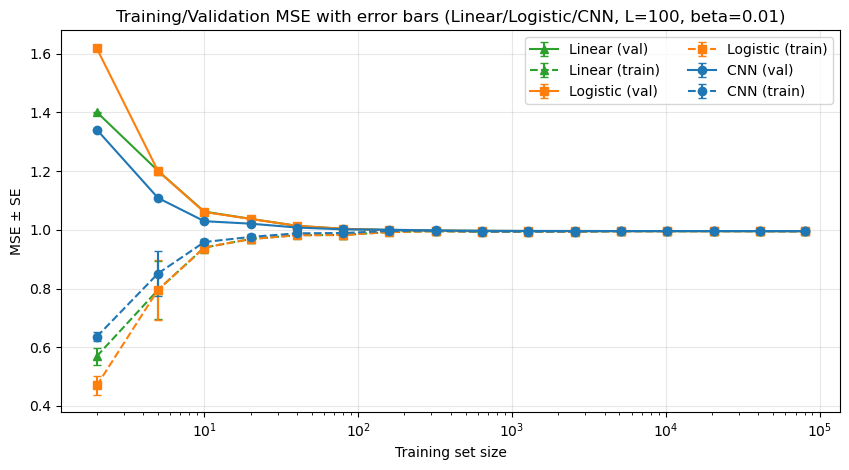

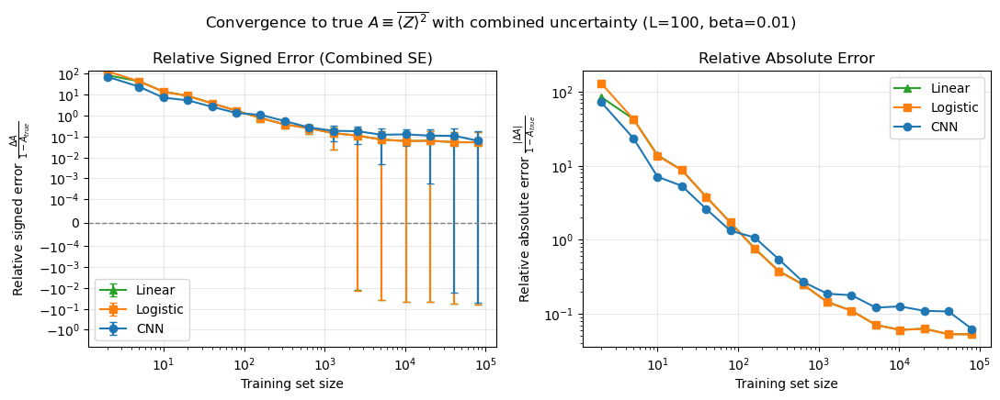

Processing L=200...
True MSE (using Zexp): 0.993179 ± 0.000094
n_train=     2 | Linear train=0.565294±0.021035, val=1.468806±0.000989 | Logistic train=0.502184±0.004096, val=1.651050±0.001181 | CNN train=0.705379±0.043615, val=1.241166±0.001020
n_train=     5 | Linear train=0.846725±0.042255, val=1.146210±0.000692 | Logistic train=0.844056±0.043723, val=1.152457±0.000687 | CNN train=0.913477±0.041213, val=1.055266±0.000427
n_train=    10 | Linear train=0.911449±0.032080, val=1.085181±0.000713 | Logistic train=0.910971±0.032271, val=1.084522±0.000706 | CNN train=0.952587±0.016102, val=1.029422±0.000355
n_train=    20 | Linear train=0.957382±0.010974, val=1.039773±0.000298 | Logistic train=0.957634±0.010959, val=1.039556±0.000297 | CNN train=0.978890±0.008903, val=1.013663±0.000239
n_train=    40 | Linear train=0.980365±0.004074, val=1.017318±0.000163 | Logistic train=0.980412±0.004071, val=1.017333±0.000163 | CNN train=0.992742±0.003882, val=1.006447±0.000142
n_train=    80 | Linear tra

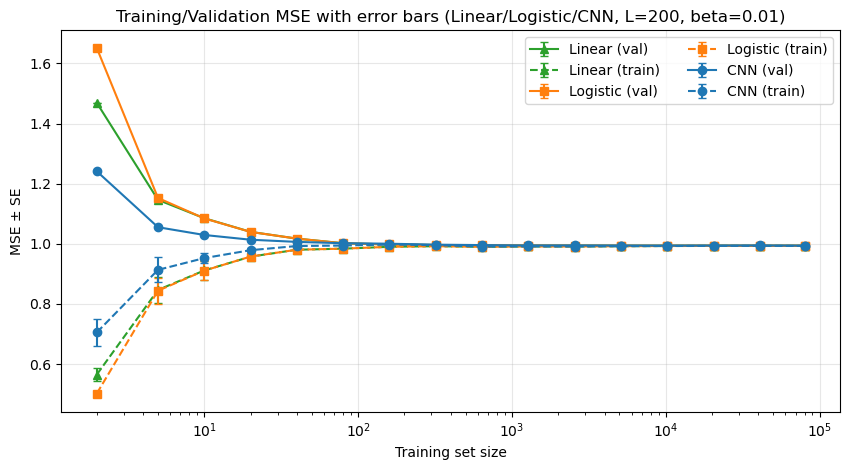

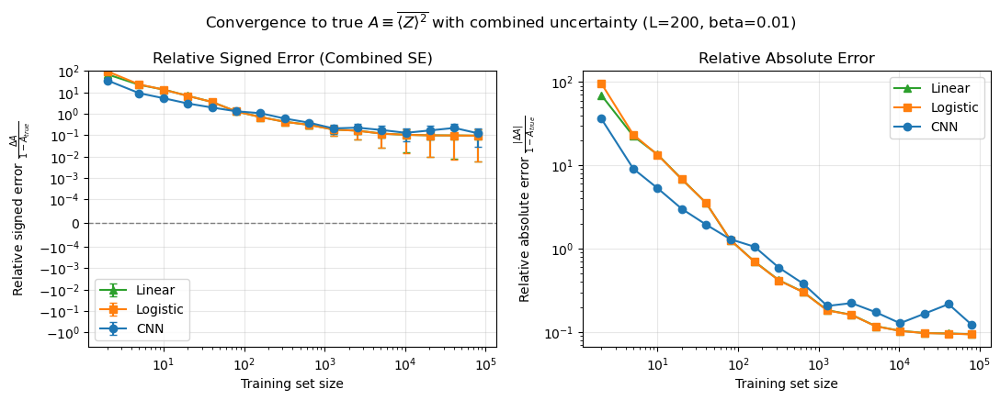

{20: (np.float64(0.9978866382231594), array([2.000e+00, 5.000e+00, 1.000e+01, 2.000e+01, 4.000e+01, 8.000e+01,
       1.600e+02, 3.200e+02, 6.400e+02, 1.280e+03, 2.560e+03, 5.120e+03,
       1.024e+04, 2.048e+04, 4.096e+04, 8.000e+04]), {'Linear': array([191.81778917,  69.0235983 ,  36.96023791,  11.48752628,
        13.10386057,   8.31643215,   4.50610053,   2.2456483 ,
         0.79373474,   0.47960698,   0.25791755,   0.26085884,
         0.21651027,   0.21142203,   0.20306567,   0.2026143 ]), 'Logistic': array([165.35565921,  65.98631398,  36.12050189,  11.40739499,
        13.04935863,   8.29398733,   4.50493157,   2.24508103,
         0.7925335 ,   0.47868261,   0.25779114,   0.26080894,
         0.2164727 ,   0.21139604,   0.20299133,   0.20251187]), 'CNN': array([236.40204816,  77.95331777,  33.48396258,   9.44430389,
        11.23021927,   7.88582322,   4.61402353,   2.59977089,
         0.76720657,   0.58024417,   0.35049674,   0.37926452,
         0.35075057,   0.35348633,  

In [105]:
beta = 0.01
for L in [100, 200]:
    print(f"Processing L={L}...")
    res001[L] = Plot_Convergence_Curves_PBC(L=L, beta=beta, save_fig=False)

print(res001)
pickle.dump(res001, open(f"figures/convergence_curves_pbc_results_beta{beta}.pkl", "wb"))

In [17]:
L = 100
beta = 0.5
n_train = [2, 5, 10, 20, 40, 80, 160, 320, 640, 1280, 2560, 5120, 10240, 20480, 40960, 80000]

linear_val = [
    0.448279, 0.340311, 0.321946, 0.311246,
    0.307522, 0.302632, 0.300964, 0.300805,
    0.300245, 0.300167, 0.299990, 0.299958,
    0.299960, 0.299873, 0.299850, 0.299831
]

logistic_val = [
    1.154958, 0.425349, 0.361387, 0.316449,
    0.306223, 0.293241, 0.290167, 0.288343,
    0.287324, 0.286615, 0.286336, 0.286166,
    0.286125, 0.286101, 0.286096, 0.286090
]

cnn_val = [
    0.423484, 0.327994, 0.307526, 0.301646,
    0.297051, 0.290985, 0.289845, 0.288865,
    0.286339, 0.286242, 0.284645, 0.282936,
    0.283219, 0.282495, 0.282628, 0.282519
]

In [18]:
y_20_true = 0.283981
y_20_lin = 0.301372
y_20_log = 0.287490
y_20_cnn = 0.283833

y_40_true = 0.282687
y_40_lin = 0.301123
y_40_log = 0.287062
y_40_cnn = 0.283397

y_60_true = 0.281492
y_60_lin = 0.300263
y_60_log = 0.286277
y_60_cnn = 0.282771

y_100_true = 0.280994
y_100_lin = 0.299831
y_100_log = 0.286090
y_100_cnn = 0.282519

y_200_true = 0.281214
y_200_lin = 0.299412
y_200_log = 0.285612
y_200_cnn = 0.281873

# absolute relative error to irreducible error (1 - true value)
rel_err_lin = np.abs(np.array([y_20_lin, y_40_lin, y_60_lin, y_100_lin, y_200_lin]) - np.array([y_20_true, y_40_true, y_60_true, y_100_true, y_200_true])) / (1 - np.array([y_20_true, y_40_true, y_60_true, y_100_true, y_200_true]))
rel_err_log = np.abs(np.array([y_20_log, y_40_log, y_60_log, y_100_log, y_200_log]) - np.array([y_20_true, y_40_true, y_60_true, y_100_true, y_200_true])) / (1 - np.array([y_20_true, y_40_true, y_60_true, y_100_true, y_200_true]))
rel_err_cnn = np.abs(np.array([y_20_cnn, y_40_cnn, y_60_cnn, y_100_cnn, y_200_cnn]) - np.array([y_20_true, y_40_true, y_60_true, y_100_true, y_200_true])) / (1 - np.array([y_20_true, y_40_true, y_60_true, y_100_true, y_200_true]))

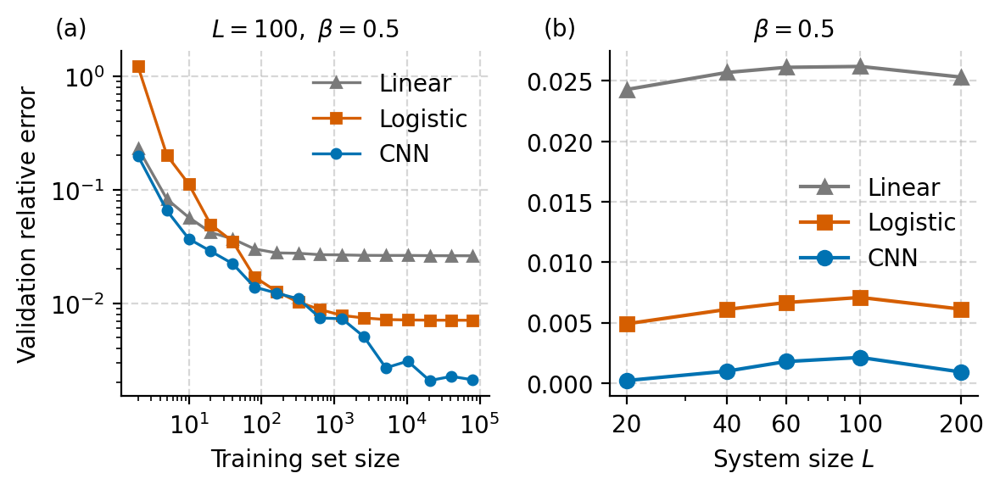

In [20]:
true_mu = 0.280994  # From the saved output of the convergence cell above

rel_abs_linear = np.abs(np.asarray(linear_val, dtype=np.float64) - true_mu) / (1 - true_mu)
rel_abs_logistic = np.abs(np.asarray(logistic_val, dtype=np.float64) - true_mu) / (1 - true_mu)
rel_abs_cnn = np.abs(np.asarray(cnn_val, dtype=np.float64) - true_mu) / (1 - true_mu)

colors = {"Linear": "#7A7A7A", "Logistic": "#D55E00", "CNN": "#0072B2"}
markers = {"Linear": "^", "Logistic": "s", "CNN": "o"}

fig, (ax,ax1) = plt.subplots(1,2,figsize=(3*2, 3), dpi=200)
ax.plot(n_train, rel_abs_linear, marker=markers["Linear"], color=colors["Linear"], linewidth=1.2, markersize=4, label="Linear")
ax.plot(n_train, rel_abs_logistic, marker=markers["Logistic"], color=colors["Logistic"], linewidth=1.2, markersize=4, label="Logistic")
ax.plot(n_train, rel_abs_cnn, marker=markers["CNN"], color=colors["CNN"], linewidth=1.2, markersize=4, label="CNN")

ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlabel("Training set size", fontsize=10)
ax.set_ylabel(r"Validation relative error", fontsize=10)
ax.grid(alpha=0.5, which="major", linestyle="--")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(frameon=False, loc="upper right", fontsize=10)
ax.set_title(r"$L=100,~\beta=0.5$", fontsize=10)
ax.text(-0.18, 1.03, "(a)", transform=ax.transAxes, fontsize=10, va="bottom", ha="left")




L_values = np.array([20, 40, 60, 100, 200])
ax1.plot(L_values, rel_err_lin, marker="^", color=colors["Linear"], label="Linear")
ax1.plot(L_values, rel_err_log, marker="s", color=colors["Logistic"], label="Logistic")
ax1.plot(L_values, rel_err_cnn, marker="o", color=colors["CNN"], label="CNN")
ax1.set_xscale("log")
# ax1.set_yscale("log")
ax1.set_xlabel(r"System size $L$", fontsize=10)
# ax1.set_ylabel(r"Validation relative error")
ax1.grid(alpha=0.5, which="major", linestyle="--")
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.legend(frameon=False, loc="best", fontsize=10)
ax1.set_title(r"$\beta=0.5$", fontsize=10)
ax1.set_xticks(L_values, [str(L) for L in L_values])

ax1.text(-0.18, 1.03, "(b)", transform=ax1.transAxes, fontsize=10, va="bottom", ha="left")

ax.tick_params(axis="both", labelsize=10)
ax1.tick_params(axis="both", labelsize=10)



fig.tight_layout()
plt.show()

# fig.savefig("figures/convergence_curves.pdf", dpi=300, bbox_inches="tight", pad_inches=0)


# Curves per method

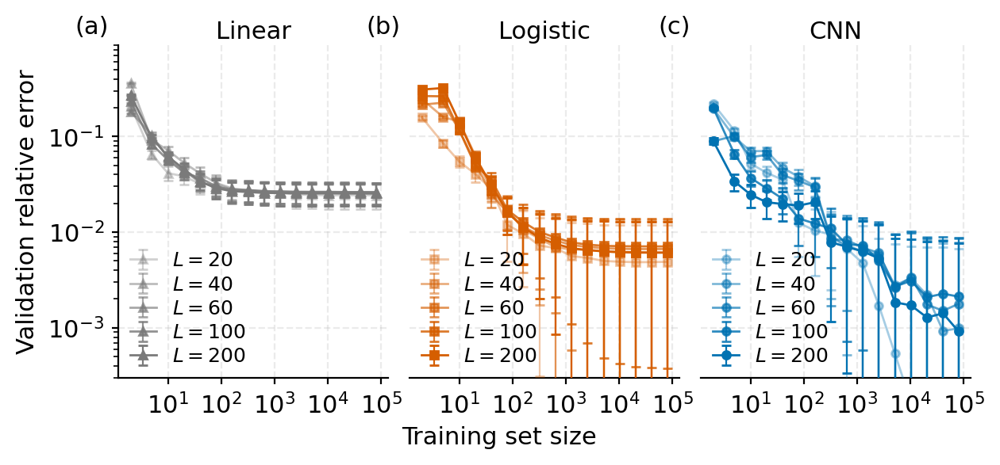

In [85]:
colors = {"Linear": "#7A7A7A", "Logistic": "#D55E00", "CNN": "#0072B2"}
markers = {"Linear": "^", "Logistic": "s", "CNN": "o"}
model_names = ["Linear", "Logistic", "CNN"]
axes_by_model = {}

fig, axes = plt.subplots(1, 3, figsize=(6, 3), dpi=200, sharex=True, sharey=True)
for ax, model in zip(axes, model_names):
    axes_by_model[model] = ax

L_values = np.array([20, 40, 60, 100, 200])
alpha_list = {20: 0.35, 40: 0.50, 60: 0.65, 100: 0.82, 200: 1.00}

for model in model_names:
    ax = axes_by_model[model]
    for L in L_values:
        res_L = res[L]
        train_sizes_arr = res_L[1]
        delta_dict = res_L[2]
        se_comb_dict = res_L[3]
        ax.errorbar(
            train_sizes_arr,
            delta_dict[model],
            yerr=se_comb_dict[model],
            fmt=markers[model] + "-",
            color=colors[model],
            linewidth=1.0,
            markersize=3.6,
            capsize=2.0,
            elinewidth=0.8,
            alpha=alpha_list[L],
            label=fr"$L={L}$",
            zorder=3,
        )

for ax, model, panel in zip(axes, model_names, ["(a)", "(b)", "(c)"]):
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_ylim(3e-4, 0.9)
    ax.grid( alpha=0.25, which="major", linestyle="--")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="both", labelsize=11, width=0.8, length=3)
    
    ax.set_xticks([10, 100, 1000, 10000, 100000])
    ax.tick_params(axis="x", labelsize=11)
    
    
    ax.set_title(model, fontsize=11, pad=3)
    ax.text(-0.16, 1.02, panel, transform=ax.transAxes, fontsize=11, va="bottom", ha="left")
    ax.legend(loc="lower left", frameon=False, fontsize=9, handlelength=1.3, labelspacing=0.25, borderaxespad=0.2)

axes[1].tick_params(axis="y", which="both", left=False, labelleft=False)
axes[2].tick_params(axis="y", which="both", left=False, labelleft=False)
axes[1].spines["left"].set_visible(False)
axes[2].spines["left"].set_visible(False)

axes[0].set_ylabel(r"Validation relative error", fontsize=11)
fig.supxlabel("Training set size", fontsize=11, y=0.07)

fig.subplots_adjust(left=0.10, right=0.995, bottom=0.22, top=0.92, wspace=0.08)
# fig.tight_layout()
# plt.show()
fig.savefig("figures/convergence_curves_separate.pdf", dpi=300, bbox_inches="tight", pad_inches=0)


In [61]:
res = pickle.load(open("figures/convergence_curves_pbc_results_beta0.5.pkl", "rb"))

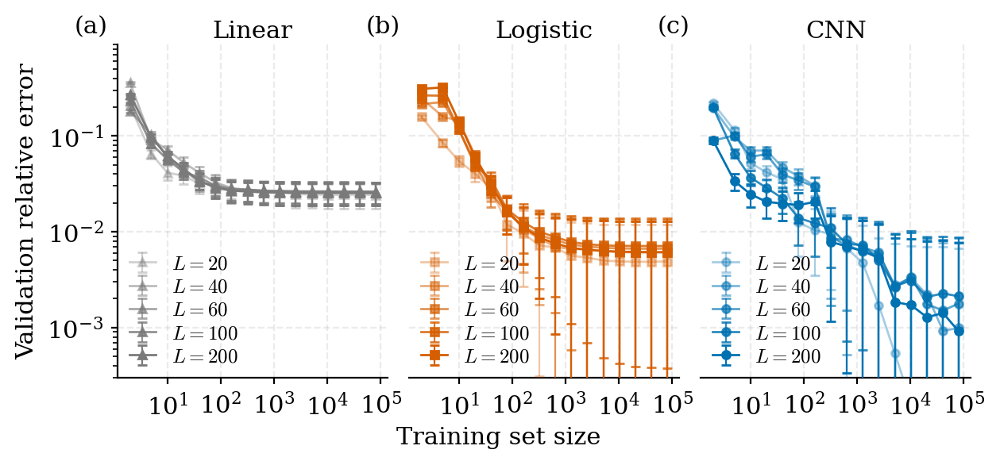

In [67]:
colors = {"Linear": "#7A7A7A", "Logistic": "#D55E00", "CNN": "#0072B2"}
markers = {"Linear": "^", "Logistic": "s", "CNN": "o"}
model_names = ["Linear", "Logistic", "CNN"]
axes_by_model = {}

fig, axes = plt.subplots(1, 3, figsize=(6, 3), dpi=200, sharex=True, sharey=True)
for ax, model in zip(axes, model_names):
    axes_by_model[model] = ax

L_values = np.array([20, 40, 60, 100, 200])
alpha_list = {20: 0.35, 40: 0.50, 60: 0.65, 100: 0.82, 200: 1.00}

for model in model_names:
    ax = axes_by_model[model]
    for L in L_values:
        res_L = res[L]
        train_sizes_arr = res_L[1]
        delta_dict = res_L[2]
        se_comb_dict = res_L[3]
        ax.errorbar(
            train_sizes_arr,
            delta_dict[model],
            yerr=se_comb_dict[model],
            fmt=markers[model] + "-",
            color=colors[model],
            linewidth=1.0,
            markersize=3.6,
            capsize=2.0,
            elinewidth=0.8,
            alpha=alpha_list[L],
            label=fr"$L={L}$",
            zorder=3,
        )

for ax, model, panel in zip(axes, model_names, ["(a)", "(b)", "(c)"]):
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_ylim(3e-4, 0.9)
    ax.grid( alpha=0.25, which="major", linestyle="--")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="both", labelsize=11, width=0.8, length=3)
    
    ax.set_xticks([10, 100, 1000, 10000, 100000])
    ax.tick_params(axis="x", labelsize=11)
    
    
    ax.set_title(model, fontsize=11, pad=3)
    ax.text(-0.16, 1.02, panel, transform=ax.transAxes, fontsize=11, va="bottom", ha="left")
    ax.legend(loc="lower left", frameon=False, fontsize=9, handlelength=1.3, labelspacing=0.25, borderaxespad=0.2)

axes[1].tick_params(axis="y", which="both", left=False, labelleft=False)
axes[2].tick_params(axis="y", which="both", left=False, labelleft=False)
axes[1].spines["left"].set_visible(False)
axes[2].spines["left"].set_visible(False)

axes[0].set_ylabel(r"Validation relative error", fontsize=11)
fig.supxlabel("Training set size", fontsize=11, y=0.07)

fig.subplots_adjust(left=0.10, right=0.995, bottom=0.22, top=0.92, wspace=0.08)
# fig.tight_layout()
# plt.show()
fig.savefig("figures/convergence_curves_separate1.pdf", dpi=300, bbox_inches="tight", pad_inches=0)


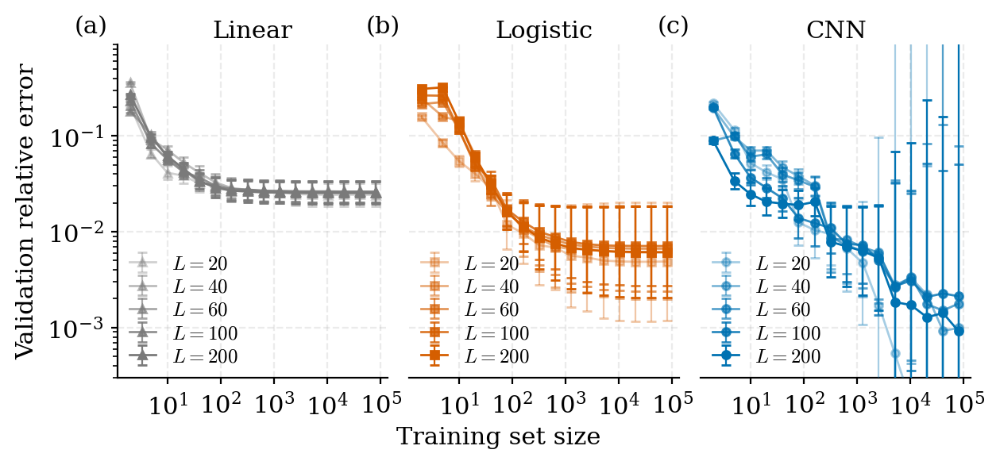

In [62]:
# Curves per method with log-symmetric multiplicative error bars.
colors = {"Linear": "#7A7A7A", "Logistic": "#D55E00", "CNN": "#0072B2"}
markers = {"Linear": "^", "Logistic": "s", "CNN": "o"}
model_names = ["Linear", "Logistic", "CNN"]
axes_by_model = {}

fig, axes = plt.subplots(1, 3, figsize=(6, 3), dpi=200, sharex=True, sharey=True)
for ax, model in zip(axes, model_names):
    axes_by_model[model] = ax

L_values = np.array([20, 40, 60, 100, 200])
alpha_list = {20: 0.35, 40: 0.50, 60: 0.65, 100: 0.82, 200: 1.00}

for model in model_names:
    ax = axes_by_model[model]
    for L in L_values:
        res_L = res[L]
        train_sizes_arr = np.asarray(res_L[1], dtype=float)
        y = np.asarray(res_L[2][model], dtype=float)
        se = np.asarray(res_L[3][model], dtype=float)

        # Convert additive SE in linear space into multiplicative error bars
        # that appear symmetric around y on a log-scaled axis.
        positive = np.isfinite(y) & np.isfinite(se) & (y > 0)
        x_plot = train_sizes_arr[positive]
        y_plot = y[positive]
        se_plot = se[positive]
        sigma_log = np.clip(se_plot / y_plot, a_min=0.0, a_max=50.0)
        yerr_lower = y_plot * (1.0 - np.exp(-sigma_log))
        yerr_upper = y_plot * (np.exp(sigma_log) - 1.0)

        ax.errorbar(
            x_plot,
            y_plot,
            yerr=[yerr_lower, yerr_upper],
            fmt=markers[model] + "-",
            color=colors[model],
            linewidth=1.0,
            markersize=3.6,
            capsize=2.0,
            elinewidth=0.8,
            alpha=alpha_list[L],
            label=fr"$L={L}$",
            zorder=3,
        )

for ax, model, panel in zip(axes, model_names, ["(a)", "(b)", "(c)"]):
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_ylim(3e-4, 0.9)
    ax.grid(alpha=0.25, which="major", linestyle="--")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="both", labelsize=11, width=0.8, length=3)
    ax.set_xticks([10, 100, 1000, 10000, 100000])
    ax.tick_params(axis="x", labelsize=11)
    ax.set_title(model, fontsize=11, pad=3)
    ax.text(-0.16, 1.02, panel, transform=ax.transAxes, fontsize=11, va="bottom", ha="left")
    ax.legend(loc="lower left", frameon=False, fontsize=9, handlelength=1.3, labelspacing=0.25, borderaxespad=0.2)

axes[1].tick_params(axis="y", which="both", left=False, labelleft=False)
axes[2].tick_params(axis="y", which="both", left=False, labelleft=False)
axes[1].spines["left"].set_visible(False)
axes[2].spines["left"].set_visible(False)

axes[0].set_ylabel(r"Validation relative error", fontsize=11)
fig.supxlabel("Training set size", fontsize=11, y=0.07)

fig.subplots_adjust(left=0.10, right=0.995, bottom=0.22, top=0.92, wspace=0.08)
# fig.savefig("figures/convergence_curves_separate_logsym.pdf", dpi=300, bbox_inches="tight", pad_inches=0)
plt.show()


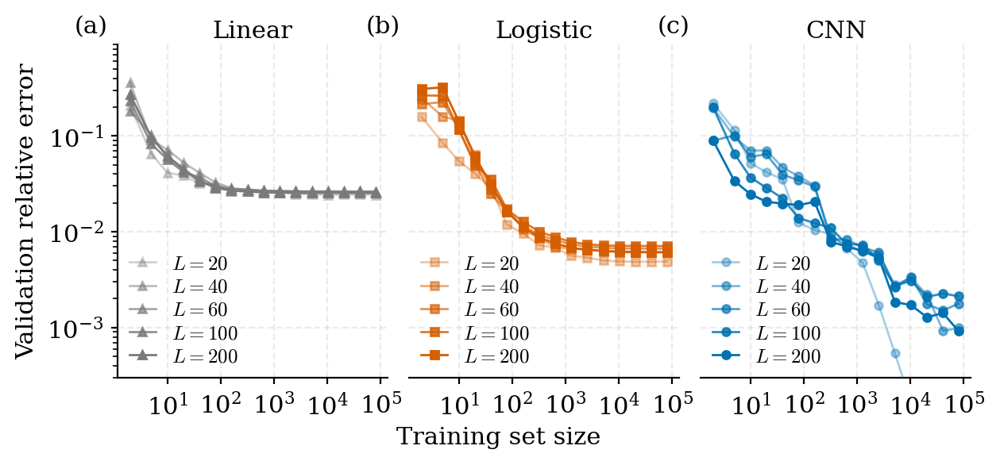

In [63]:
# Curves per method without error bars.
colors = {"Linear": "#7A7A7A", "Logistic": "#D55E00", "CNN": "#0072B2"}
markers = {"Linear": "^", "Logistic": "s", "CNN": "o"}
model_names = ["Linear", "Logistic", "CNN"]
axes_by_model = {}

fig, axes = plt.subplots(1, 3, figsize=(6, 3), dpi=200, sharex=True, sharey=True)
for ax, model in zip(axes, model_names):
    axes_by_model[model] = ax

L_values = np.array([20, 40, 60, 100, 200])
alpha_list = {20: 0.35, 40: 0.50, 60: 0.65, 100: 0.82, 200: 1.00}

for model in model_names:
    ax = axes_by_model[model]
    for L in L_values:
        res_L = res[L]
        train_sizes_arr = np.asarray(res_L[1], dtype=float)
        y = np.asarray(res_L[2][model], dtype=float)
        positive = np.isfinite(y) & (y > 0)
        ax.plot(
            train_sizes_arr[positive],
            y[positive],
            markers[model] + "-",
            color=colors[model],
            linewidth=1.0,
            markersize=3.6,
            alpha=alpha_list[L],
            label=fr"$L={L}$",
            zorder=3,
        )

for ax, model, panel in zip(axes, model_names, ["(a)", "(b)", "(c)"]):
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_ylim(3e-4, 0.9)
    ax.grid(alpha=0.25, which="major", linestyle="--")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="both", labelsize=11, width=0.8, length=3)
    ax.set_xticks([10, 100, 1000, 10000, 100000])
    ax.tick_params(axis="x", labelsize=11)
    ax.set_title(model, fontsize=11, pad=3)
    ax.text(-0.16, 1.02, panel, transform=ax.transAxes, fontsize=11, va="bottom", ha="left")
    ax.legend(loc="lower left", frameon=False, fontsize=9, handlelength=1.3, labelspacing=0.25, borderaxespad=0.2)

axes[1].tick_params(axis="y", which="both", left=False, labelleft=False)
axes[2].tick_params(axis="y", which="both", left=False, labelleft=False)
axes[1].spines["left"].set_visible(False)
axes[2].spines["left"].set_visible(False)

axes[0].set_ylabel(r"Validation relative error", fontsize=11)
fig.supxlabel("Training set size", fontsize=11, y=0.07)

fig.subplots_adjust(left=0.10, right=0.995, bottom=0.22, top=0.92, wspace=0.08)
# fig.savefig("figures/convergence_curves_separate_noerr.pdf", dpi=300, bbox_inches="tight", pad_inches=0)
plt.show()


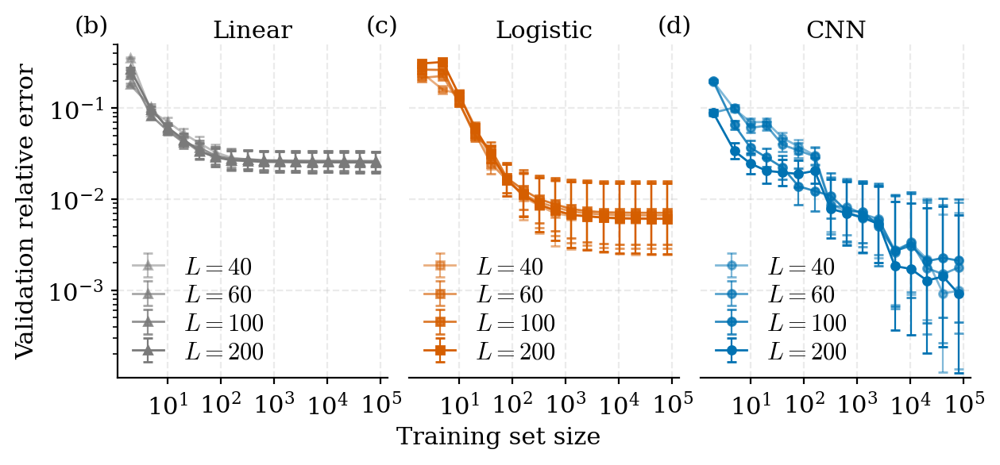

In [74]:
# Curves per method with uncertainty estimated in log space from mean and SE.
# Note: the saved results only contain the mean curve and linear-space SE,
# not the raw repeated samples y_i. We therefore approximate the uncertainty
# of log(y) by moment-matching to a lognormal distribution.
colors = {"Linear": "#7A7A7A", "Logistic": "#D55E00", "CNN": "#0072B2"}
markers = {"Linear": "^", "Logistic": "s", "CNN": "o"}
model_names = ["Linear", "Logistic", "CNN"]
axes_by_model = {}

fig, axes = plt.subplots(1, 3, figsize=(6, 3), dpi=200, sharex=True, sharey=True)
for ax, model in zip(axes, model_names):
    axes_by_model[model] = ax

L_values = np.array([40, 60, 100, 200])
alpha_list = {20: 0.35, 40: 0.50, 60: 0.65, 100: 0.82, 200: 1.00}

for model in model_names:
    ax = axes_by_model[model]
    for L in L_values:
        res_L = res[L]
        train_sizes_arr = np.asarray(res_L[1], dtype=float)
        y = np.asarray(res_L[2][model], dtype=float)
        se = np.asarray(res_L[3][model], dtype=float)

        positive = np.isfinite(y) & np.isfinite(se) & (y > 0) & (se >= 0)
        x_plot = train_sizes_arr[positive]
        y_plot = y[positive]
        se_plot = se[positive]

        rel_var = (se_plot / y_plot) ** 2
        sigma_log = np.sqrt(np.log1p(rel_var))
        yerr_lower = y_plot * (1.0 - np.exp(-sigma_log))
        yerr_upper = y_plot * (np.exp(sigma_log) - 1.0)

        ax.errorbar(
            x_plot,
            y_plot,
            yerr=[yerr_lower, yerr_upper],
            fmt=markers[model] + "-",
            color=colors[model],
            linewidth=1.0,
            markersize=3.6,
            capsize=2.0,
            elinewidth=0.8,
            alpha=alpha_list[L],
            label=fr"$L={L}$",
            zorder=3,
        )

for ax, model, panel in zip(axes, model_names, ["(b)", "(c)", "(d)"]):
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_ylim(1.1e-4, 0.5)
    ax.grid(alpha=0.25, which="major", linestyle="--")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="both", labelsize=11, width=0.8, length=3)
    ax.set_xticks([10, 100, 1000, 10000, 100000])
    ax.tick_params(axis="x", labelsize=11)
    ax.set_title(model, fontsize=11, pad=3)
    ax.text(-0.16, 1.02, panel, transform=ax.transAxes, fontsize=11, va="bottom", ha="left")
    ax.legend(loc="lower left", frameon=False, fontsize=11, handlelength=1.3, labelspacing=0.25, borderaxespad=0.2)

axes[1].tick_params(axis="y", which="both", left=False, labelleft=False)
axes[2].tick_params(axis="y", which="both", left=False, labelleft=False)
axes[1].spines["left"].set_visible(False)
axes[2].spines["left"].set_visible(False)

axes[0].set_ylabel(r"Validation relative error", fontsize=11)
fig.supxlabel("Training set size", fontsize=11, y=0.07)

fig.subplots_adjust(left=0.10, right=0.995, bottom=0.22, top=0.92, wspace=0.08)
fig.savefig("figures/convergence_curves_separate_logy_est.pdf", dpi=300, bbox_inches="tight", pad_inches=0)
plt.show()


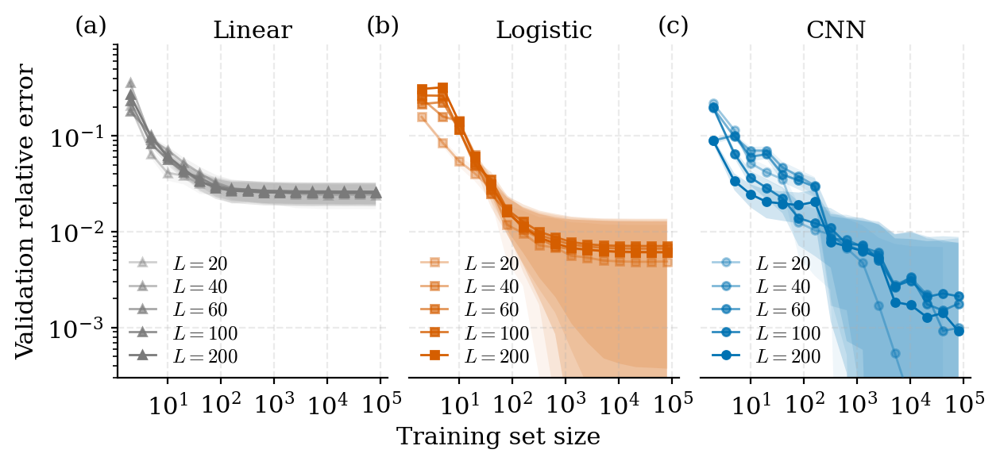

In [ ]:
# Curves per method with shaded uncertainty bands.
colors = {"Linear": "#7A7A7A", "Logistic": "#D55E00", "CNN": "#0072B2"}
markers = {"Linear": "^", "Logistic": "s", "CNN": "o"}
model_names = ["Linear", "Logistic", "CNN"]
axes_by_model = {}

fig, axes = plt.subplots(1, 3, figsize=(6, 3), dpi=200, sharex=True, sharey=True)
for ax, model in zip(axes, model_names):
    axes_by_model[model] = ax

L_values = np.array([20, 40, 60, 100, 200])
alpha_list = {20: 0.35, 40: 0.50, 60: 0.65, 100: 0.82, 200: 1.00}
band_alpha_scale = 0.18
y_floor = 1e-8

for model in model_names:
    ax = axes_by_model[model]
    for L in L_values:
        res_L = res[L]
        train_sizes_arr = np.asarray(res_L[1], dtype=float)
        y = np.asarray(res_L[2][model], dtype=float)
        se = np.asarray(res_L[3][model], dtype=float)

        positive = np.isfinite(y) & np.isfinite(se) & (y > 0) & (se >= 0)
        x_plot = train_sizes_arr[positive]
        y_plot = y[positive]
        se_plot = se[positive]
        y_lower = np.clip(y_plot - se_plot, y_floor, None)
        y_upper = y_plot + se_plot

        ax.fill_between(
            x_plot,
            y_lower,
            y_upper,
            color=colors[model],
            alpha=band_alpha_scale * alpha_list[L],
            linewidth=0,
            zorder=1,
        )
        ax.plot(
            x_plot,
            y_plot,
            markers[model] + "-",
            color=colors[model],
            linewidth=1.0,
            markersize=3.6,
            alpha=alpha_list[L],
            label=fr"$L={L}$",
            zorder=3,
        )

for ax, model, panel in zip(axes, model_names, ["(a)", "(b)", "(c)"]):
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_ylim(3e-4, 0.9)
    ax.grid(alpha=0.25, which="major", linestyle="--")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="both", labelsize=11, width=0.8, length=3)
    ax.set_xticks([10, 100, 1000, 10000, 100000])
    ax.tick_params(axis="x", labelsize=11)
    ax.set_title(model, fontsize=11, pad=3)
    ax.text(-0.16, 1.02, panel, transform=ax.transAxes, fontsize=11, va="bottom", ha="left")
    ax.legend(loc="lower left", frameon=False, fontsize=9, handlelength=1.3, labelspacing=0.25, borderaxespad=0.2)

axes[1].tick_params(axis="y", which="both", left=False, labelleft=False)
axes[2].tick_params(axis="y", which="both", left=False, labelleft=False)
axes[1].spines["left"].set_visible(False)
axes[2].spines["left"].set_visible(False)

axes[0].set_ylabel(r"Validation relative error", fontsize=11)
fig.supxlabel("Training set size", fontsize=11, y=0.07)

fig.subplots_adjust(left=0.10, right=0.995, bottom=0.22, top=0.92, wspace=0.08)


# Curves per method with uncertainty estimated in log space from mean and SE.
# Note: the saved results only contain the mean curve and linear-space SE,
# not the raw repeated samples y_i. We therefore approximate the uncertainty
# of log(y) by moment-matching to a lognormal distribution.
colors = {"Linear": "#7A7A7A", "Logistic": "#D55E00", "CNN": "#0072B2"}
markers = {"Linear": "^", "Logistic": "s", "CNN": "o"}
model_names = ["Linear", "Logistic", "CNN"]
axes_by_model = {}

fig, axes = plt.subplots(1, 3, figsize=(6, 3), dpi=200, sharex=True, sharey=True)
for ax, model in zip(axes, model_names):
    axes_by_model[model] = ax

L_values = np.array([40, 60, 100, 200])
alpha_list = {20: 0.35, 40: 0.50, 60: 0.65, 100: 0.82, 200: 1.00}

for model in model_names:
    ax = axes_by_model[model]
    for L in L_values:
        res_L = res[L]
        train_sizes_arr = np.asarray(res_L[1], dtype=float)
        y = np.asarray(res_L[2][model], dtype=float)
        se = np.asarray(res_L[3][model], dtype=float)

        positive = np.isfinite(y) & np.isfinite(se) & (y > 0) & (se >= 0)
        x_plot = train_sizes_arr[positive]
        y_plot = y[positive]
        se_plot = se[positive]

        rel_var = (se_plot / y_plot) ** 2
        sigma_log = np.sqrt(np.log1p(rel_var))
        yerr_lower = y_plot * (1.0 - np.exp(-sigma_log))
        yerr_upper = y_plot * (np.exp(sigma_log) - 1.0)

        ax.errorbar(
            x_plot,
            y_plot,
            yerr=[yerr_lower, yerr_upper],
            fmt=markers[model] + "-",
            color=colors[model],
            linewidth=1.0,
            markersize=3.6,
            capsize=2.0,
            elinewidth=0.8,
            alpha=alpha_list[L],
            label=fr"$L={L}$",
            zorder=3,
        )

for ax, model, panel in zip(axes, model_names, ["(b)", "(c)", "(d)"]):
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_ylim(1.1e-4, 0.5)
    ax.grid(alpha=0.25, which="major", linestyle="--")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="both", labelsize=11, width=0.8, length=3)
    ax.set_xticks([10, 100, 1000, 10000, 100000])
    ax.tick_params(axis="x", labelsize=11)
    ax.set_title(model, fontsize=11, pad=3)
    ax.text(-0.16, 1.02, panel, transform=ax.transAxes, fontsize=11, va="bottom", ha="left")
    ax.legend(loc="lower left", frameon=False, fontsize=11, handlelength=1.3, labelspacing=0.25, borderaxespad=0.2)

axes[1].tick_params(axis="y", which="both", left=False, labelleft=False)
axes[2].tick_params(axis="y", which="both", left=False, labelleft=False)
axes[1].spines["left"].set_visible(False)
axes[2].spines["left"].set_visible(False)

axes[0].set_ylabel(r"Validation relative error", fontsize=11)
fig.supxlabel("Training set size", fontsize=11, y=0.07)

fig.subplots_adjust(left=0.10, right=0.995, bottom=0.22, top=0.92, wspace=0.08)
fig.savefig("figures/convergence_curves_separate_logy_est.pdf", dpi=300, bbox_inches="tight", pad_inches=0)
plt.show()



<>:128: SyntaxWarning: invalid escape sequence '\l'
<>:128: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_34326/3570882063.py:128: SyntaxWarning: invalid escape sequence '\l'
  label="$\langle Z_j \rangle_{\mathbf{s}}$",


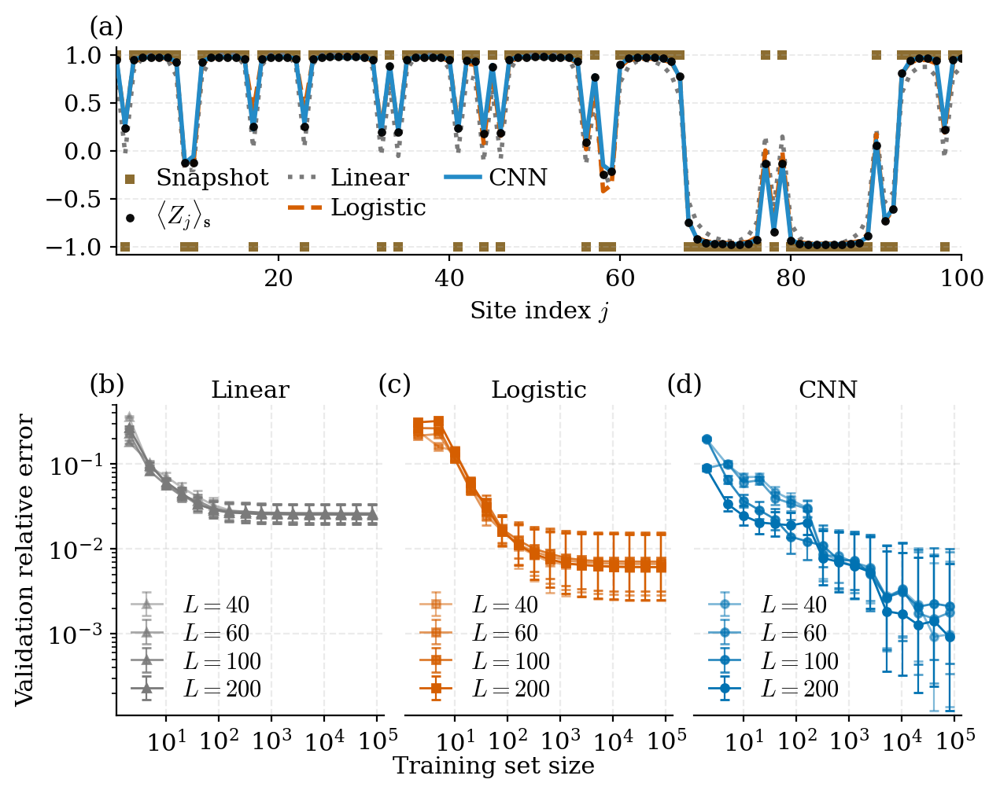

In [101]:
# TODO: combine the top magnetization panel with the bottom log-y-est panels.
import pickle
from pathlib import Path

if "res" not in globals():
    res = pickle.load(open("figures/convergence_curves_pbc_results_beta0.5.pkl", "rb"))

L = 100
beta = 0.5
N = 100000
# measurement outcome from training set
s = [1, -1, 1, 1, 1, 1, 1, 1, -1, -1, 1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, -1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, -1, 1, 1, 1, 1, 1, 1, -1, 1, 1, -1, 1, -1, 1, 1, 1, 1, 1, 1, 1, 1, 1, -1, 1, -1, -1, 1, 1, 1, 1, 1, 1, 1, 1, -1, -1, -1, -1, -1, -1, -1, -1, -1, 1, -1, 1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, 1, -1, -1, 1, 1, 1, 1, 1, -1, 1, 1]

Zexp = [0.9482362036114398, 0.23726664087863517, 0.951143756044781, 0.9744796335090715, 0.9767762113870042, 0.9761391867035544, 0.970431142602581, 0.9220727064712133, -0.1257287648832543, -0.12541858211094112, 0.9225576299527822, 0.970746008454795, 0.9764438016700304, 0.9771918802575102, 0.9752855562190098, 0.953759864604575, 0.25181577412216183, 0.9538846775353867, 0.9754008089529851, 0.9772362561824438, 0.9754544508305469, 0.9541277882993091, 0.25335247377280334, 0.9542786315895514, 0.9756728473256505, 0.9778268125859532, 0.9781609739695802, 0.978105707217673, 0.9775763753908869, 0.9746607856682393, 0.9483380395909897, 0.19712765258496942, 0.88453859463925, 0.19675073135858864, 0.9481276072398767, 0.9744908914261697, 0.9773054603423872, 0.9773855426186121, 0.9750009619391645, 0.9516525902719117, 0.23445250802625794, 0.9404425080744849, 0.9355556358096131, 0.17910968377205852, 0.8776551631337357, 0.1888001814810263, 0.9468195742940898, 0.9741829990316342, 0.9772823005935731, 0.9778252085550106, 0.9778432040419444, 0.9775286790610265, 0.976392345215821, 0.9712241549988658, 0.9325307502553011, 0.0872344622195817, 0.7658717958039966, -0.24713530308096313, -0.21815734832214895, 0.9017156800182479, 0.9642340166564863, 0.9726581033482748, 0.9735924617233763, 0.9715942520220509, 0.9641418744114274, 0.9345743758569875, 0.7745524371295222, -0.7437776447588489, -0.9226493848561353, -0.9588483329410498, -0.9688228401699718, -0.9722823696502053, -0.9734634825904503, -0.9729825537829446, -0.968086687106486, -0.9318587419952717, -0.13135252995543958, -0.844446035241192, -0.13440649651053685, -0.9337352475966411, -0.9693888707555797, -0.9743633275010034, -0.9753693967200323, -0.9754006497301557, -0.9748773337670862, -0.9735256870701442, -0.9699248637506712, -0.9573600640676809, -0.8903964036372046, 0.05803075805834255, -0.729997722318278, -0.608258618645825, 0.8066167734398423, 0.9411576656263829, 0.9647662015524862, 0.9674673521098078, 0.9425299970511741, 0.2160035079710859, 0.9450939242826669, 0.9687333096402221]
x_input = np.asarray(s, dtype=np.float32).reshape(1, -1)
y_pred = {}
# Prefer in-memory fitted models from the full-data training cell.
if "models_all" in globals() and isinstance(models_all, dict):
    for name in ["Linear", "Logistic", "CNN"]:
        mdl = models_all.get(name, None)
        if mdl is not None and hasattr(mdl, "predict_magnetization"):
            y_pred[name] = mdl.predict_magnetization(x_input)[0]
# Fallback: load saved models if needed.
save_dir = Path("../data")
lin_path = save_dir / f"linear_sharedpbc_L{L}_beta{beta}_N{N}.pkl"
log_path = save_dir / f"logistic_sharedpbc_L{L}_beta{beta}_N{N}.pkl"
cnn_path = save_dir / f"dilatedcnn_sharedpbc_L{L}_beta{beta}_N{N}.pt"
if "Linear" not in y_pred:
    if not lin_path.exists():
        raise FileNotFoundError(f"Linear checkpoint not found: {lin_path}")
    lin_model = myLinearRegressionModel.load(lin_path)
    y_pred["Linear"] = lin_model.predict_magnetization(x_input)[0]
if "Logistic" not in y_pred:
    if not log_path.exists():
        raise FileNotFoundError(f"Logistic checkpoint not found: {log_path}")
    log_model = myLogisticRegressionModel.load(log_path)
    y_pred["Logistic"] = log_model.predict_magnetization(x_input)[0]
if "CNN" not in y_pred:
    if not cnn_path.exists():
        raise FileNotFoundError(f"CNN checkpoint not found: {cnn_path}")
    cnn_model = dilatedCNNModel.load(cnn_path, map_location="cpu")
    y_pred["CNN"] = cnn_model.predict_magnetization(x_input)[0]
z_true = np.asarray(Zexp, dtype=np.float32)
rmse_linear = float(np.sqrt(np.mean((y_pred["Linear"] - z_true) ** 2)))
rmse_logistic = float(np.sqrt(np.mean((y_pred["Logistic"] - z_true) ** 2)))
rmse_cnn = float(np.sqrt(np.mean((y_pred["CNN"] - z_true) ** 2)))
site = np.arange(1, len(s) + 1)

plt.rcParams.update({
    "font.size": 11,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman", "CMU Serif", "DejaVu Serif"],
    "mathtext.fontset": "cm",
    "axes.labelsize": 11,
    "legend.fontsize": 11,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
})

top_colors = {
    "snapshot": "#8C6D31",
    "linear": "#7A7A7A",
    "logistic": "#D55E00",
    "cnn": "#248BC7",
    "truth": "#000000",
}
colors = {"Linear": "#7A7A7A", "Logistic": "#D55E00", "CNN": "#0072B2"}
markers = {"Linear": "^", "Logistic": "s", "CNN": "o"}
model_names = ["Linear", "Logistic", "CNN"]
axes_by_model = {}

L_values = np.array([40, 60, 100, 200])
alpha_list = {20: 0.35, 40: 0.50, 60: 0.65, 100: 0.82, 200: 1.00}

fig = plt.figure(figsize=(6, 3+2), dpi=200)
gs = fig.add_gridspec(2, 3, height_ratios=[2, 3.0], hspace=0.58, wspace=0.08)
ax_top = fig.add_subplot(gs[0, :])
axes = [fig.add_subplot(gs[1, i]) for i in range(3)]
for ax, model in zip(axes, model_names):
    axes_by_model[model] = ax

snapshot_handle = ax_top.scatter(
    site,
    s,
    marker="s",
    s=20,
    color=top_colors["snapshot"],
    alpha=1,
    linewidths=0,
    rasterized=True,
    label="Snapshot $s_j$",
    zorder=1,
)
linear_handle, = ax_top.plot(
    site,
    y_pred["Linear"],
    linestyle=":",
    linewidth=2,
    color=top_colors["linear"],
    label=f"Linear Regression",
    zorder=2,
)
logistic_handle, = ax_top.plot(
    site,
    y_pred["Logistic"],
    linestyle="--",
    linewidth=2,
    color=top_colors["logistic"],
    label=f"Logistic Regression",
    zorder=3,
)
cnn_handle, = ax_top.plot(
    site,
    y_pred["CNN"],
    linestyle="-",
    linewidth=2,
    color=top_colors["cnn"],
    label=f"Dilated CNN",
    zorder=4,
)
target_handle = ax_top.scatter(
    site,
    z_true,
    s=15,
    color=top_colors["truth"],
    alpha=0.95,
    linewidths=0,
    label="$\langle Z_j \rangle_{\mathbf{s}}$",
    zorder=5,
)

ax_top.set_xlim(1, len(s))
ax_top.set_ylim(-1.08, 1.08)
ax_top.set_xlabel(r"Site index $j$")
ax_top.set_yticks([-1.0, -0.5, 0.0, 0.5, 1.0])
ax_top.grid(axis="y", linestyle="--", linewidth=0.7, alpha=0.25)
ax_top.spines["top"].set_visible(False)
ax_top.spines["right"].set_visible(False)
ax_top.tick_params(axis="both", labelsize=11, width=0.8, length=3)
ax_top.legend(
    [snapshot_handle, target_handle, linear_handle, logistic_handle, cnn_handle],
    ["Snapshot", r"$\langle Z_j \rangle_{\mathbf{s}}$", "Linear", "Logistic", "CNN"],
    loc="lower left",
    bbox_to_anchor=(-0.03, 0.),
    ncol=3,
    frameon=False,
    columnspacing=0.8,
    handlelength=1.4,
    handletextpad=0.35,
    labelspacing=0.35,
)

for model in model_names:
    ax = axes_by_model[model]
    for L_curve in L_values:
        res_L = res[L_curve]
        train_sizes_arr = np.asarray(res_L[1], dtype=float)
        y = np.asarray(res_L[2][model], dtype=float)
        se = np.asarray(res_L[3][model], dtype=float)

        positive = np.isfinite(y) & np.isfinite(se) & (y > 0) & (se >= 0)
        x_plot = train_sizes_arr[positive]
        y_plot = y[positive]
        se_plot = se[positive]

        rel_var = (se_plot / y_plot) ** 2
        sigma_log = np.sqrt(np.log1p(rel_var))
        yerr_lower = y_plot * (1.0 - np.exp(-sigma_log))
        yerr_upper = y_plot * (np.exp(sigma_log) - 1.0)

        ax.errorbar(
            x_plot,
            y_plot,
            yerr=[yerr_lower, yerr_upper],
            fmt=markers[model] + "-",
            color=colors[model],
            linewidth=1.0,
            markersize=3.6,
            capsize=2.0,
            elinewidth=0.8,
            alpha=alpha_list[L_curve],
            label=fr"$L={L_curve}$",
            zorder=3,
        )

for ax, model in zip(axes, model_names):
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_ylim(1.1e-4, 0.5)
    ax.grid(alpha=0.25, which="major", linestyle="--")
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="both", labelsize=11, width=0.8, length=3)
    ax.set_xticks([10, 100, 1000, 10000, 100000])
    ax.tick_params(axis="x", labelsize=11)
    ax.set_title(model, fontsize=11, pad=3)
    ax.legend(loc="lower left", frameon=False, fontsize=11, handlelength=1.3, labelspacing=0.25, borderaxespad=0.2)

axes[1].tick_params(axis="y", which="both", left=False, labelleft=False)
axes[2].tick_params(axis="y", which="both", left=False, labelleft=False)
axes[1].spines["left"].set_visible(False)
axes[2].spines["left"].set_visible(False)
axes[0].set_ylabel(r"Validation relative error", fontsize=11)

fig.supxlabel("Training set size", fontsize=11, y=0.04)
fig.subplots_adjust(left=0.10, right=0.995, bottom=0.12, top=0.97)

label_pad = 0.030
bbox_top = ax_top.get_position()
bbox_b = axes[0].get_position()
bbox_c = axes[1].get_position()
bbox_d = axes[2].get_position()
fig.text(bbox_b.x0 - label_pad, bbox_top.y1 + 0.008, "(a)", fontsize=12, va="bottom", ha="left")
fig.text(bbox_b.x0 - label_pad, bbox_b.y1 + 0.008, "(b)", fontsize=12, va="bottom", ha="left")
fig.text(bbox_c.x0 - label_pad, bbox_c.y1 + 0.008, "(c)", fontsize=12, va="bottom", ha="left")
fig.text(bbox_d.x0 - label_pad, bbox_d.y1 + 0.008, "(d)", fontsize=12, va="bottom", ha="left")

fig.savefig("figures/combined.pdf", dpi=300, bbox_inches="tight", pad_inches=0)
plt.show()


# Finite-size scaling for one-point function

In [5]:
# dict for true value: key: (L, beta), value: true_mu
import pickle
dict_true_mu = {}
dict_train_linear = {}
dict_train_logistic = {}
dict_train_cnn = {}
for beta in [0.01, 0.02, 0.05, 0.1, 0.2, 0.3]:
    res = pickle.load(open(f"figures/convergence_curves_pbc_results_beta{beta}.pkl", "rb"))
    for L in [20, 40, 60, 100, 200]:
        res_L = res[L]
        true_mu = res_L[0]
        dict_true_mu[(L, beta)] = true_mu
        dict_train_linear[(L, beta)] = (res_L[4]["Linear"][-1], res_L[5]["Linear"][-1])
        dict_train_logistic[(L, beta)] = (res_L[4]["Logistic"][-1], res_L[5]["Logistic"][-1])
        dict_train_cnn[(L, beta)] = (res_L[4]["CNN"][-1], res_L[5]["CNN"][-1])
        

In [6]:
dict_true_se = {
    (20, 0.01): 0.000029,
    (40, 0.01): 0.000042,
    (60, 0.01): 0.000049,
    (100, 0.01): 0.000066,
    (200, 0.01): 0.000094,
    (20, 0.02): 0.000111,
    (40, 0.02): 0.000160,
    (60, 0.02): 0.000187,
    (100, 0.02): 0.000243,
    (200, 0.02): 0.000327,
    (20, 0.05): 0.000591,
    (40, 0.05): 0.000769,
    (60, 0.05): 0.000866,
    (100, 0.05): 0.001007,
    (200, 0.05): 0.001156,
    (20, 0.1): 0.001576,
    (40, 0.1): 0.001794,
    (60, 0.1): 0.001877,
    (100, 0.1): 0.001957,
    (200, 0.1): 0.001996,
    (20, 0.2): 0.002790,
    (40, 0.2): 0.002839,
    (60, 0.2): 0.002847,
    (100, 0.2): 0.002853,
    (200, 0.2): 0.002856,
    (20, 0.3): 0.003285,
    (40, 0.3): 0.003296,
    (60, 0.3): 0.003296,
    (100, 0.3): 0.003296,
    (200, 0.3): 0.003295,
}

<ErrorbarContainer object of 3 artists>

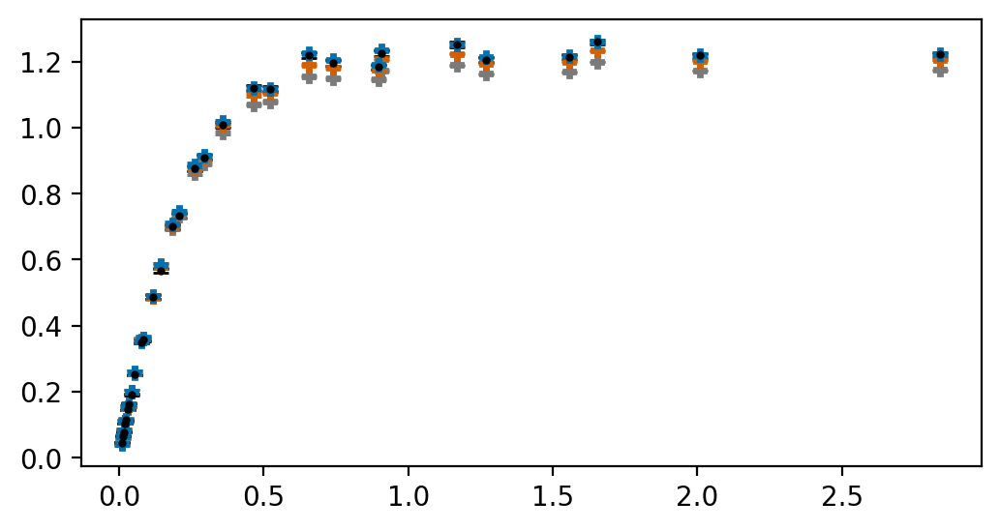

In [16]:
colors = {"Linear": "#7A7A7A", "Logistic": "#D55E00", "CNN": "#0072B2"}
markers = {"Linear": "^", "Logistic": "s", "CNN": "o"}
markers = {20: "^", 40: "s", 60: "o", 100: "D", 200: "P"}
model_names = ["Linear", "Logistic", "CNN"]
axes_by_model = {}

fig, ax = plt.subplots(1, 1, figsize=(6, 3), dpi=200, sharex=True, sharey=True)
coloralpha = {0.01: 0.1, 0.02: 0.2, 0.05: 0.3, 0.1: 0.4, 0.2: 0.6, 0.3: 1.0}
x_list = []
y_true_list = []
y_true_err_list = []
y_lin_list = []
y_log_list = []
y_cnn_list = []
y_lin_err_list = []
y_log_err_list = []
y_cnn_err_list = []
for L in [20, 40, 60, 100,200]:
    for beta in [0.01, 0.02, 0.05, 0.1, 0.2, 0.3]:
        Delta = 0.125
        x = (L * np.power(beta, 2/(1-2*Delta))) ** (1/2)
        true_mu = 1-dict_true_mu[(L, beta)]
        true_se = dict_true_se[(L, beta)]
        train_lin_mu, train_lin_se = dict_train_linear[(L, beta)]
        train_lin_mu = 1 - train_lin_mu
        train_log_mu, train_log_se = dict_train_logistic[(L, beta)]
        train_log_mu = 1 - train_log_mu
        train_cnn_mu, train_cnn_se = dict_train_cnn[(L, beta)]
        train_cnn_mu = 1 - train_cnn_mu
        y_factor = np.power(beta, -4*Delta/(1-2*Delta))
        x_list.append(x)
        y_true_list.append(true_mu * y_factor)
        y_true_err_list.append(true_se * y_factor)
        y_lin_list.append(train_lin_mu * y_factor)
        y_log_list.append(train_log_mu * y_factor)
        y_cnn_list.append(train_cnn_mu * y_factor)
        y_lin_err_list.append(train_lin_se * y_factor)
        y_log_err_list.append(train_log_se * y_factor)
        y_cnn_err_list.append(train_cnn_se * y_factor)
        
# sort x_list and corresponding y values
x_list = np.array(x_list)
y_true_list = np.array(y_true_list)
y_true_err_list = np.array(y_true_err_list)
y_lin_list = np.array(y_lin_list)
y_log_list = np.array(y_log_list)
y_cnn_list = np.array(y_cnn_list)
y_lin_err_list = np.array(y_lin_err_list)
y_log_err_list = np.array(y_log_err_list)
y_cnn_err_list = np.array(y_cnn_err_list)

sort_idx = np.argsort(x_list)
x_list = x_list[sort_idx]
y_true_list = y_true_list[sort_idx]
y_true_err_list = y_true_err_list[sort_idx]
y_lin_list = y_lin_list[sort_idx]
y_log_list = y_log_list[sort_idx]
y_cnn_list = y_cnn_list[sort_idx]
y_lin_err_list = y_lin_err_list[sort_idx]
y_log_err_list = y_log_err_list[sort_idx]
y_cnn_err_list = y_cnn_err_list[sort_idx]   

ax.errorbar(
    x_list,
    y_lin_list,
    yerr=y_lin_err_list,
    fmt=markers[L],
    color=colors["Linear"],
    alpha=coloralpha[beta],
    linewidth=1.0,
    markersize=4,
    capsize=3,
    elinewidth=0.8,
    label=f"Linear (L={L}, beta={beta})",
)
ax.errorbar(
    x_list,
    y_log_list,
    yerr=y_log_err_list,
    fmt=markers[L],
    color=colors["Logistic"],
    alpha=coloralpha[beta],
    linewidth=1.0,
    markersize=4,
    capsize=3,
    elinewidth=0.8,
    label=f"Logistic (L={L}, beta={beta})",
)
ax.errorbar(
    x_list,
    y_cnn_list,
    yerr=y_cnn_err_list,
    fmt=markers[L],
    color=colors["CNN"],
    alpha=coloralpha[beta],
    linewidth=1.0,
    markersize=4,
    capsize=3,
    elinewidth=0.8,
    label=f"CNN (L={L}, beta={beta})",
)

ax.errorbar(
    x_list,
    y_true_list,
    yerr=y_true_err_list,
    fmt=".",
    color="black",
    linewidth=1.0,
    markersize=4,
    capsize=3,
    elinewidth=0.8,
    alpha=1,
    label=f"True (L={L}, beta={beta})",
)

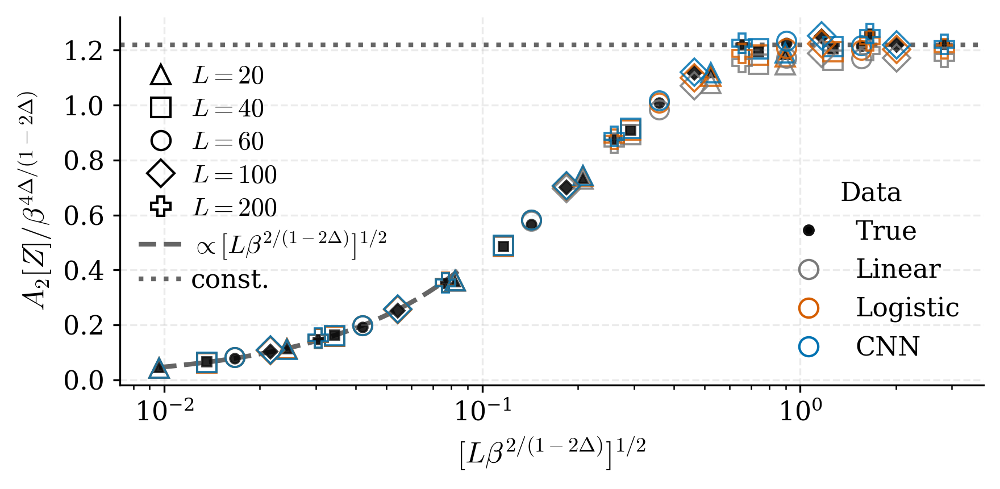

In [54]:
# Data-collapse panel only for the finite-size scaling of the one-point function.
import numpy as np
import matplotlib.pyplot as plt
Delta = 0.125
L_values = [20, 40, 60, 100, 200]
beta_values = [0.01, 0.02, 0.05, 0.1, 0.2, 0.3]
models = ["Linear", "Logistic", "CNN"]
model_dicts = {
    "Linear": dict_train_linear,
    "Logistic": dict_train_logistic,
    "CNN": dict_train_cnn,
}
model_colors = {
    "True": "#111111",
    "Linear": "#7A7A7A",
    "Logistic": "#D55E00",
    "CNN": "#0072B2",
}
guide_color = "#656565"
L_markers = {20: "^", 40: "s", 60: "o", 100: "D", 200: "P"}

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman", "CMU Serif", "DejaVu Serif"],
    "mathtext.fontset": "cm",
    "font.size": 11,
    "axes.labelsize": 12.5,
    "legend.fontsize": 11,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
})

x_by_L = {L: [] for L in L_values}
y_true_by_L = {L: [] for L in L_values}
yerr_true_by_L = {L: [] for L in L_values}
y_model_by_L = {model: {L: [] for L in L_values} for model in models}

for L in L_values:
    for beta in beta_values:
        x = (L * beta ** (2 / (1 - 2 * Delta))) ** 0.5
        y_factor = beta ** (-4 * Delta / (1 - 2 * Delta))

        true_A = 1 - dict_true_mu[(L, beta)]
        true_y = true_A * y_factor
        true_yerr = dict_true_se[(L, beta)] * y_factor

        x_by_L[L].append(x)
        y_true_by_L[L].append(true_y)
        yerr_true_by_L[L].append(true_yerr)

        for model in models:
            model_mse, _ = model_dicts[model][(L, beta)]
            model_y = (1 - model_mse) * y_factor
            y_model_by_L[model][L].append(model_y)

fig, ax = plt.subplots(1, 1, figsize=(6, 3), dpi=300)

for L in L_values:
    ax.plot(
        x_by_L[L],
        y_true_by_L[L],
        marker=L_markers[L],
        linestyle="None",
        color=model_colors["True"],
        markersize=4,
        markerfacecolor="black",
        markeredgewidth=0.9,
        alpha=0.85,
        zorder=1,
    )
    for model in models:
        ax.plot(
            x_by_L[L],
            y_model_by_L[model][L],
            marker=L_markers[L],
            linestyle="None",
            color=model_colors[model],
            markersize=8,
            markerfacecolor="none",
            markeredgewidth=0.9,
            alpha=0.85,
            zorder=3,
        )

all_x = np.concatenate([x_by_L[L] for L in L_values])
all_y = np.concatenate([y_true_by_L[L] for L in L_values])
small_mask = all_x < np.quantile(all_x, 0.28)
large_mask = all_x > np.quantile(all_x, 0.72)
guide_handles = []
if np.any(small_mask):
    c_linear = np.median(all_y[small_mask] / all_x[small_mask])
    x_guide = np.linspace(np.min(all_x), np.quantile(all_x, 0.35), 100)
    guide_line, = ax.plot(
        x_guide,
        c_linear * x_guide,
        color=guide_color,
        linestyle="--",
        linewidth=2,
        alpha=1,
        label=r"$\propto [L \beta^{2/(1-2\Delta)}]^{1/2}$",
        zorder=0,
    )
    guide_handles.append(guide_line)
if np.any(large_mask):
    plateau = np.median(all_y[large_mask])
    plateau_line = ax.axhline(
        plateau,
        color=guide_color,
        linestyle=":",
        linewidth=2,
        alpha=1,
        label="const.",
        zorder=0,
    )
    guide_handles.append(plateau_line)

ax.set_xscale("log")
# ax.set_yscale("log")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.grid(axis="both", which="major", alpha=0.25, linestyle="--")
ax.tick_params(axis="both", labelsize=11, width=0.8, length=3)
ax.set_xlabel(r"$[L \beta^{2/(1-2\Delta)}]^{1/2}$")
ax.set_ylabel(r"$A_2[Z] / \beta^{4\Delta/(1-2\Delta)}$")
# ax.set_title("Data collapse", fontsize=11, pad=3)

model_handles = [
    plt.Line2D([0], [0], marker="o", linestyle="None", color=model_colors["True"], markerfacecolor="black", label="True", markersize=4),
    *[
        plt.Line2D([0], [0], marker="o", linestyle="None", color=model_colors[model], markerfacecolor="none", label=model, markersize=8)
        for model in models
    ],
]
L_handles = [
    plt.Line2D([0], [0], marker=L_markers[L], linestyle="None", color="black", markerfacecolor="none", label=fr"$L={L}$", markersize=8)
    for L in L_values
]
leg1 = ax.legend(handles=model_handles, frameon=False, fontsize=11, loc="lower right", title="Data", title_fontsize=11)
ax.add_artist(leg1)
ax.legend(
    handles=L_handles + guide_handles,
    frameon=False,
    fontsize=11,
    loc=(0.01,0.22),#"upper left",
    ncol=1,
    handlelength=1.7,
    handletextpad=0.3,
    labelspacing=0.28,
)

fig.tight_layout()
fig.savefig("figures/data_collapse.pdf", dpi=300, bbox_inches="tight", pad_inches=0)
plt.show()


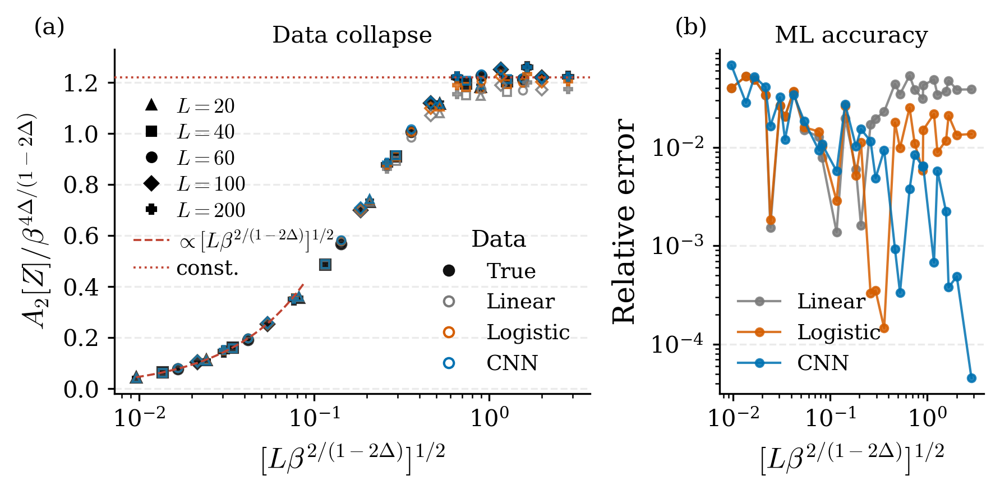

In [64]:
# Two-panel finite-size scaling collapse and ML accuracy diagnostic.
Delta = 0.125
L_values = [20, 40, 60, 100, 200]
beta_values = [0.01, 0.02, 0.05, 0.1, 0.2, 0.3]
models = ["Linear", "Logistic", "CNN"]
model_dicts = {
    "Linear": dict_train_linear,
    "Logistic": dict_train_logistic,
    "CNN": dict_train_cnn,
}
model_colors = {
    "True": "#111111",
    "Linear": "#7A7A7A",
    "Logistic": "#D55E00",
    "CNN": "#0072B2",
}
guide_color = "#C04433"
L_markers = {20: "^", 40: "s", 60: "o", 100: "D", 200: "P"}

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman", "CMU Serif", "DejaVu Serif"],
    "mathtext.fontset": "cm",
    "font.size": 8.5,
    "axes.labelsize": 12.5,
    "legend.fontsize": 10,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
})

x_by_L = {L: [] for L in L_values}
y_true_by_L = {L: [] for L in L_values}
yerr_true_by_L = {L: [] for L in L_values}
y_model_by_L = {model: {L: [] for L in L_values} for model in models}
yerr_model_by_L = {model: {L: [] for L in L_values} for model in models}
rel_err_by_model = {model: [] for model in models}
rel_err_x_by_model = {model: [] for model in models}

for L in L_values:
    for beta in beta_values:
        x = (L * beta ** (2 / (1 - 2 * Delta))) ** 0.5
        y_factor = beta ** (-4 * Delta / (1 - 2 * Delta))

        # The dictionaries store MSE; convert to A = 1 - MSE before scaling.
        true_A = 1 - dict_true_mu[(L, beta)]
        true_y = true_A * y_factor
        true_yerr = dict_true_se[(L, beta)] * y_factor

        x_by_L[L].append(x)
        y_true_by_L[L].append(true_y)
        yerr_true_by_L[L].append(true_yerr)

        for model in models:
            model_mse, model_se = model_dicts[model][(L, beta)]
            model_y = (1 - model_mse) * y_factor
            model_yerr = model_se * y_factor
            y_model_by_L[model][L].append(model_y)
            yerr_model_by_L[model][L].append(model_yerr)
            rel_err_x_by_model[model].append(x)
            rel_err_by_model[model].append(abs(model_y - true_y) / abs(true_y))

for L in L_values:
    order = np.argsort(x_by_L[L])
    x_by_L[L] = np.asarray(x_by_L[L])[order]
    y_true_by_L[L] = np.asarray(y_true_by_L[L])[order]
    yerr_true_by_L[L] = np.asarray(yerr_true_by_L[L])[order]
    for model in models:
        y_model_by_L[model][L] = np.asarray(y_model_by_L[model][L])[order]
        yerr_model_by_L[model][L] = np.asarray(yerr_model_by_L[model][L])[order]

fig, (ax, ax_err) = plt.subplots(1, 2, figsize=(6, 3), dpi=300, gridspec_kw={"width_ratios": [1.8, 1]})

# Panel (a): collapse curve. True values define the reference curve; ML points should lie on top.
for L in L_values:
    ax.errorbar(
        x_by_L[L],
        y_true_by_L[L],
        yerr=yerr_true_by_L[L],
        color=model_colors["True"],
        marker=L_markers[L],
        linestyle="",
        linewidth=1.1,
        markersize=4.2,
        capsize=2,
        elinewidth=0.8,
        alpha=0.85,
        zorder=1,
    )
    for model in models:
        ax.plot(
            x_by_L[L],
            y_model_by_L[model][L],
            marker=L_markers[L],
            linestyle="None",
            color=model_colors[model],
            markersize=3.4,
            markerfacecolor="none",
            markeredgewidth=0.9,
            alpha=0.85,
            zorder=3,
        )
        


all_x = np.concatenate([x_by_L[L] for L in L_values])
all_y = np.concatenate([y_true_by_L[L] for L in L_values])
small_mask = all_x < np.quantile(all_x, 0.28)
large_mask = all_x > np.quantile(all_x, 0.72)
guide_handles = []
if np.any(small_mask):
    c_linear = np.median(all_y[small_mask] / all_x[small_mask])
    x_guide = np.linspace(np.min(all_x), np.quantile(all_x, 0.35), 100)
    guide_line, = ax.plot(x_guide, c_linear * x_guide, color=guide_color, linestyle="--", linewidth=0.9, alpha=1, label=r"$\propto [L \beta^{2/(1-2\Delta)}]^{1/2}$", zorder=10)
    guide_handles.append(guide_line)
if np.any(large_mask):
    plateau = np.median(all_y[large_mask])
    plateau_line = ax.axhline(plateau, color=guide_color, linestyle=":", linewidth=0.9, alpha=1, label="const.", zorder=10)
    guide_handles.append(plateau_line)

# Panel (b): model accuracy relative to the true scaled value.
for model in models:
    order = np.argsort(rel_err_x_by_model[model])
    ax_err.plot(
        np.asarray(rel_err_x_by_model[model])[order],
        np.asarray(rel_err_by_model[model])[order],
        marker="o",
        linestyle="-",
        color=model_colors[model],
        linewidth=1.0,
        markersize=3.2,
        alpha=0.85,
        label=model,
    )

for this_ax in (ax, ax_err):
    this_ax.set_xscale("log")
    this_ax.spines["top"].set_visible(False)
    this_ax.spines["right"].set_visible(False)
    this_ax.grid(axis="y", which="major", alpha=0.25, linestyle="--")
    this_ax.tick_params(axis="both", labelsize=10, width=0.8, length=3)

ax.set_xlabel(r"$[L \beta^{2/(1-2\Delta)}]^{1/2}$")
ax.set_ylabel(r"$A_2[Z] / \beta^{4\Delta/(1-2\Delta)}$")
ax.set_title("Data collapse", fontsize=10, pad=3)
ax.text(-0.17, 1.03, "(a)", transform=ax.transAxes, fontsize=10, va="bottom", ha="left")

ax_err.set_yscale("log")
ax_err.set_xlabel(r"$[L \beta^{2/(1-2\Delta)}]^{1/2}$")
ax_err.set_ylabel(r"Relative error")
ax_err.set_title("ML accuracy", fontsize=10, pad=3)
ax_err.text(-0.17, 1.03, "(b)", transform=ax_err.transAxes, fontsize=10, va="bottom", ha="left")
ax_err.legend(frameon=False, fontsize=9, loc="best")

model_handles = [
    plt.Line2D([0], [0], marker="o", linestyle="None", color=model_colors["True"], markerfacecolor="none", label="True", markersize=4.2),
    *[
        plt.Line2D([0], [0], marker="o", linestyle="None", color=model_colors[model], markerfacecolor="none", label=model, markersize=4.2)
        for model in models
    ],
]
L_handles = [
    plt.Line2D([0], [0], marker=L_markers[L], linestyle="None", color="black", label=fr"$L={L}$", markersize=4.0)
    for L in L_values
]
leg1 = ax.legend(handles=model_handles, frameon=False, fontsize=9, loc="lower right", title="Data", title_fontsize=10)
ax.add_artist(leg1)
ax.legend(
    handles=L_handles + guide_handles,
    frameon=False,
    fontsize=9,
    loc="upper left",
    title=r" ",
    title_fontsize=10,
    ncol=1,
    handlelength=1.7,
    handletextpad=0.3,
    labelspacing=0.28,
)

fig.tight_layout(w_pad=1.1)
plt.show()

fig.savefig("figures/data_collapse_ml_accuracy.pdf", dpi=300, bbox_inches="tight", pad_inches=0)


# Uniform Sampling

In [68]:
def ZexpZexp_mps_data(L, beta, q=1, weight=None):
    Zcorr = np.load(f"../data/Fast_MPS_CritIsing_L{L}_beta{beta}_Zcorr_uniform_N10000_0_r.npy")
    # load <Z_r>_s, where each row corresponds to a different snapshot and each column corresponds to a different position r.
    Z = np.load(f"../data/Fast_MPS_CritIsing_L{L}_beta{beta}_Zexp_uniform_N10000_0_r.npy")
    _connected_corr = Z[:, :1] * Z
    return np.mean(np.power(_connected_corr, q), axis=0), np.std(np.power(_connected_corr, q), axis=0)/np.sqrt(Z.shape[0])

def ZexpZexp_ml_data(y_pred, q=1, weight=None):
    _connected_corr = y_pred[:, :1] * y_pred
    return np.mean(np.power(_connected_corr, q), axis=0), np.std(np.power(_connected_corr, q), axis=0)/np.sqrt(y_pred.shape[0])

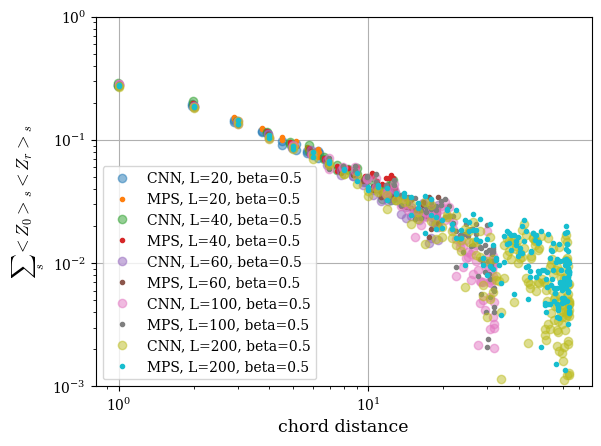

In [77]:
for L in [20, 40, 60, 100, 200]:
    for beta in [0.5]:

        save_dir = Path("../data")
        cnn_path = save_dir / f"dilatedcnn_sharedpbc_L{L}_beta{beta}_N100000.pt"
        cnn_model = dilatedCNNModel.load(cnn_path, map_location="cpu")
        x_input = np.load(f"../data/Uniform_L{L}_beta{beta}_N10000.npy")
        y_pred = cnn_model.predict_magnetization(x_input)

        x = np.arange(L)
        x_chord = L / np.pi * np.sin(np.pi * x / L)
        y = ZexpZexp_ml_data(y_pred, q=1)
        y0 = ZexpZexp_mps_data(L, beta, 1)[0]
        plt.loglog(x_chord, y[0], 'o', label=f"CNN, L={L}, beta={beta}", alpha=0.5)
        # ax = plt.gca()
        # c = ax.lines[-1].get_color()
        plt.loglog(x_chord, y0, '.', label=f"MPS, L={L}, beta={beta}")

plt.xlabel("chord distance")
plt.ylabel(r"$\sum_s <Z_0>_s <Z_r>_s$")
plt.legend()
plt.ylim(1e-3, 1)
plt.grid()
plt.show()


<>:18: SyntaxWarning: invalid escape sequence '\s'
<>:18: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_1613636/1968234138.py:18: SyntaxWarning: invalid escape sequence '\s'
  plt.loglog(x_chord, 0.45*x_chord**(-1), "--", label=f"$\sim x^{{-1}}$", alpha=1)
/tmp/ipykernel_1613636/1968234138.py:18: RuntimeWarning: divide by zero encountered in reciprocal
  plt.loglog(x_chord, 0.45*x_chord**(-1), "--", label=f"$\sim x^{{-1}}$", alpha=1)


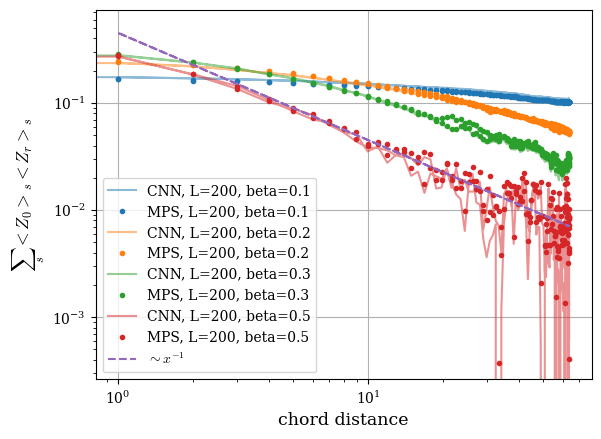

In [78]:
for L in [200]:
    for beta in [0.1, 0.2, 0.3, 0.5]:

        save_dir = Path("../data")
        cnn_path = save_dir / f"dilatedcnn_sharedpbc_L{L}_beta{beta}_N100000.pt"
        cnn_model = dilatedCNNModel.load(cnn_path, map_location="cpu")
        x_input = np.load(f"../data/Uniform_L{L}_beta{beta}_N10000.npy")
        y_pred = cnn_model.predict_magnetization(x_input)

        x = np.arange(L)
        x_chord = L / np.pi * np.sin(np.pi * x / L)
        y = ZexpZexp_ml_data(y_pred, q=1)
        y0 = ZexpZexp_mps_data(L, beta, 1)[0]
        plt.loglog(x_chord, y[0], label=f"CNN, L={L}, beta={beta}", alpha=0.5)
        ax = plt.gca()
        c = ax.lines[-1].get_color()
        plt.loglog(x_chord, y0, '.', color=c, label=f"MPS, L={L}, beta={beta}")
plt.loglog(x_chord, 0.45*x_chord**(-1), "--", label=f"$\sim x^{{-1}}$", alpha=1)
plt.xlabel("chord distance")
plt.ylabel(r"$\sum_s <Z_0>_s <Z_r>_s$")
plt.legend()
# plt.ylim(1e-2, 1)
plt.grid()
plt.show()


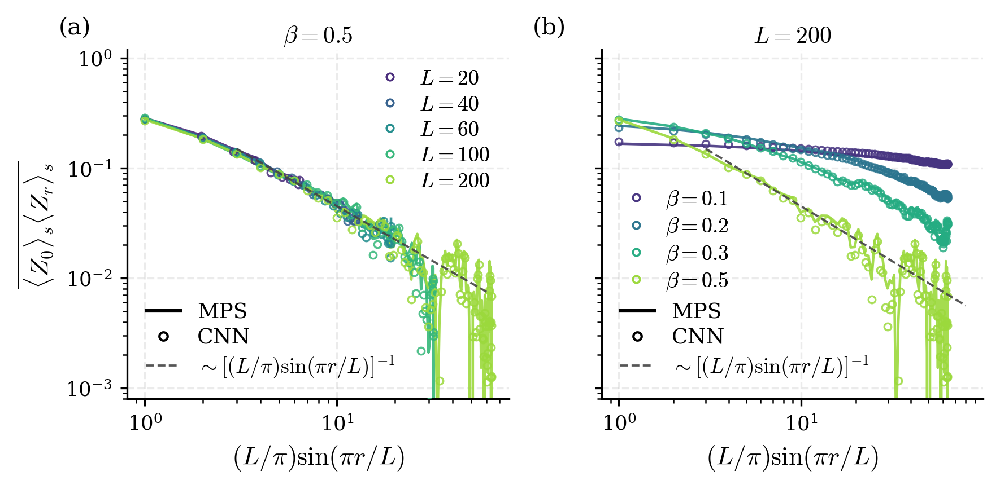

In [139]:
# Paper-style two-panel summary of uniform-sampling correlations.
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman", "CMU Serif", "DejaVu Serif"],
    "mathtext.fontset": "cm",
    "font.size": 10,
    "axes.labelsize": 11,
    "legend.fontsize": 10,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
})

fig, (ax_L, ax_beta) = plt.subplots(1, 2, figsize=(6, 3), dpi=300, sharey=True)

# Panel (a): finite-size collapse at fixed beta.
beta_fixed = 0.5
L_list = [20, 40, 60, 100, 200]
L_colors = plt.cm.viridis(np.linspace(0.12, 0.85, len(L_list)))

for L, color in zip(L_list, L_colors):
    save_dir = Path("../data")
    cnn_path = save_dir / f"dilatedcnn_sharedpbc_L{L}_beta{beta_fixed}_N100000.pt"
    cnn_model = dilatedCNNModel.load(cnn_path, map_location="cpu")
    x_input = np.load(f"../data/Uniform_L{L}_beta{beta_fixed}_N10000.npy")
    y_pred = cnn_model.predict_magnetization(x_input)

    r = np.arange(L)
    r_chord = L / np.pi * np.sin(np.pi * r / L)
    keep = slice(1, L // 2 + 1)
    y_cnn, _ = ZexpZexp_ml_data(y_pred, q=1)
    y_mps, _ = ZexpZexp_mps_data(L, beta_fixed, q=1)

    ax_L.loglog(
        r_chord[keep],
        y_mps[keep],
        color=color,
        linewidth=1.1,
        alpha=0.9,
        zorder=2,
    )
    ax_L.loglog(
        r_chord[keep],
        y_cnn[keep],
        marker="o",
        linestyle="None",
        color=color,
        markerfacecolor="none",
        markeredgewidth=0.8,
        markersize=3.0,
        alpha=0.85,
        zorder=3,
        label=fr"$L={L}$",
    )

# Panel (b): beta dependence at fixed L.
L_fixed = 200
beta_list = [0.1, 0.2, 0.3, 0.5]
beta_colors = plt.cm.viridis(np.linspace(0.15, 0.85, len(beta_list)))

for beta, color in zip(beta_list, beta_colors):
    save_dir = Path("../data")
    cnn_path = save_dir / f"dilatedcnn_sharedpbc_L{L_fixed}_beta{beta}_N100000.pt"
    cnn_model = dilatedCNNModel.load(cnn_path, map_location="cpu")
    x_input = np.load(f"../data/Uniform_L{L_fixed}_beta{beta}_N10000.npy")
    y_pred = cnn_model.predict_magnetization(x_input)

    r = np.arange(L_fixed)
    r_chord = L_fixed / np.pi * np.sin(np.pi * r / L_fixed)
    keep = slice(1, L_fixed // 2 + 1)
    y_cnn, _ = ZexpZexp_ml_data(y_pred, q=1)
    y_mps, _ = ZexpZexp_mps_data(L_fixed, beta, q=1)

    ax_beta.loglog(
        r_chord[keep],
        y_mps[keep],
        color=color,
        linewidth=1.1,
        alpha=0.9,
        zorder=2,
    )
    ax_beta.loglog(
        r_chord[keep],
        y_cnn[keep],
        marker="o",
        linestyle="None",
        color=color,
        markerfacecolor="none",
        markeredgewidth=0.8,
        markersize=3.0,
        alpha=0.85,
        zorder=3,
        label=fr"$\beta={beta}$",
    )

# Power-law guides.
r_guide_L = np.logspace(np.log10(3), np.log10(60), 100)
guide_line_L, = ax_L.loglog(
    r_guide_L,
    0.45 * r_guide_L ** (-1),
    color="#444444",
    linestyle="--",
    linewidth=0.9,
    alpha=0.9,
    label=r"$\sim [(L/\pi)\sin(\pi r/L)]^{-1}$",
    zorder=6,
)
r_guide = np.logspace(np.log10(3), np.log10(80), 100)
guide_line, = ax_beta.loglog(
    r_guide,
    0.45 * r_guide ** (-1),
    color="#444444",
    linestyle="--",
    linewidth=0.9,
    alpha=0.9,
    label=r"$\sim [(L/\pi)\sin(\pi r/L)]^{-1}$",
    zorder=6,
)

for ax in (ax_L, ax_beta):
    ax.set_xlabel(r"$(L/\pi)\sin(\pi r/L)$")
    ax.grid(axis="both", which="major", linestyle="--", alpha=0.25)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="both", labelsize=8.5, width=0.8, length=3)
    ax.set_ylim(8e-4, 1.2)

ax_L.set_ylabel(r"$\overline{\langle Z_0\rangle_s\langle Z_r\rangle_s}$")
ax_L.set_title(fr"$\beta={beta_fixed}$", fontsize=10, pad=3)
ax_beta.set_title(fr"$L={L_fixed}$", fontsize=10, pad=3)
ax_L.text(-0.18, 1.03, "(a)", transform=ax_L.transAxes, fontsize=10, va="bottom", ha="left")
ax_beta.text(-0.18, 1.03, "(b)", transform=ax_beta.transAxes, fontsize=10, va="bottom", ha="left")

# Legends: solid line = MPS, open circle = CNN; colors encode L or beta.
style_handles = [
    plt.Line2D([0], [0], color="black", linewidth=1.5, label="MPS"),
    plt.Line2D([0], [0], marker="o", linestyle="None", color="black", markerfacecolor="none", markersize=3.5, label="CNN"),
]
leg_style_L = ax_L.legend(
    handles=style_handles + [guide_line_L],
    frameon=False,
    loc="lower left",
    fontsize=9,
    handlelength=1.6,
    labelspacing=0.25,
)
ax_L.add_artist(leg_style_L)
handles_L, labels_L = ax_L.get_legend_handles_labels()
handles_L, labels_L = handles_L[:len(L_list)], labels_L[:len(L_list)]
leg_color_L = ax_L.legend(handles=handles_L, labels=labels_L, frameon=False, loc="upper right", fontsize=9.0, handlelength=1.2, labelspacing=0.25)
ax_L.add_artist(leg_color_L)

leg_style_beta = ax_beta.legend(
    handles=style_handles + [guide_line],
    frameon=False,
    loc="lower left",
    fontsize=9,
    handlelength=1.6,
    labelspacing=0.25,
)
ax_beta.add_artist(leg_style_beta)
handles_beta, labels_beta = ax_beta.get_legend_handles_labels()
handles_beta, labels_beta = handles_beta[:len(beta_list)], labels_beta[:len(beta_list)]
leg_color_beta = ax_beta.legend(handles=handles_beta, labels=labels_beta, frameon=False, loc=(0.035,0.28), fontsize=9.0, handlelength=1.2, labelspacing=0.25)
ax_beta.add_artist(leg_color_beta)

fig.tight_layout(w_pad=1.2)
plt.show()

fig.savefig("figures/uniform_correlation_summary.pdf", dpi=300, bbox_inches="tight", pad_inches=0)


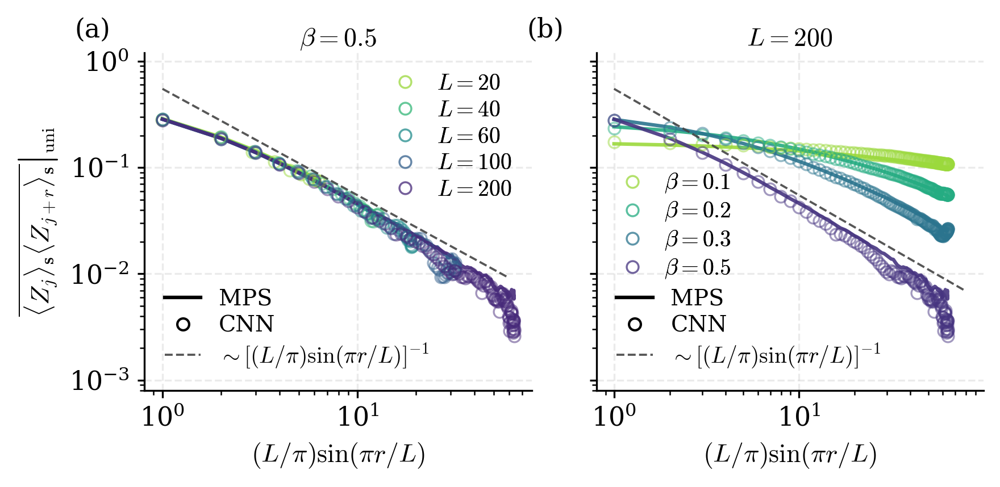

In [267]:
# Paper-style two-panel summary with spatially averaged uniform-sampling correlations.
def ZexpZexp_spatial_average_from_array(Z, q=1):
    """Return snapshot-averaged, spatially averaged <Z_i>_s <Z_{i+r}>_s with PBC."""
    Z = np.asarray(Z, dtype=np.float64)
    n_snapshots, L = Z.shape
    if q == 1:
        # Circular autocorrelation for each snapshot, averaged over all origins i.
        corr_by_snapshot = np.fft.ifft(np.abs(np.fft.fft(Z, axis=1)) ** 2, axis=1).real / L
    else:
        corr_by_snapshot = np.stack(
            [np.mean(np.power(Z * np.roll(Z, -r, axis=1), q), axis=1) for r in range(L)],
            axis=1,
        )
    return (
        np.mean(corr_by_snapshot, axis=0),
        np.std(corr_by_snapshot, axis=0, ddof=1) / np.sqrt(n_snapshots),
    )


def ZexpZexp_mps_spatial_average_data(L, beta, q=1):
    Z = np.load(f"../data/Fast_MPS_CritIsing_L{L}_beta{beta}_Zexp_uniform_N10000_0_r.npy")
    return ZexpZexp_spatial_average_from_array(Z, q=q)


def ZexpZexp_ml_spatial_average_data(y_pred, q=1):
    return ZexpZexp_spatial_average_from_array(y_pred, q=q)


plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman", "CMU Serif", "DejaVu Serif"],
    "mathtext.fontset": "cm",
    "font.size": 11,
    "axes.labelsize": 11,
    "legend.fontsize": 11,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
})

fig, (ax_L, ax_beta) = plt.subplots(1, 2, figsize=(6, 3), dpi=300, sharey=True)

# Panel (a): finite-size comparison at fixed beta.
beta_fixed = 0.5
L_list = [20, 40, 60, 100, 200]
L_colors = plt.cm.viridis(np.linspace(0.85, 0.12, len(L_list)))

for L, color in zip(L_list, L_colors):
    save_dir = Path("../data")
    cnn_path = save_dir / f"dilatedcnn_sharedpbc_L{L}_beta{beta_fixed}_N100000.pt"
    cnn_model = dilatedCNNModel.load(cnn_path, map_location="cpu")
    x_input = np.load(f"../data/Uniform_L{L}_beta{beta_fixed}_N10000.npy")
    y_pred = cnn_model.predict_magnetization(x_input)

    r = np.arange(L)
    r_chord = L / np.pi * np.sin(np.pi * r / L)
    keep = slice(1, L // 2 + 1)
    y_cnn, _ = ZexpZexp_ml_spatial_average_data(y_pred, q=1)
    y_mps, _ = ZexpZexp_mps_spatial_average_data(L, beta_fixed, q=1)

    ax_L.loglog(
        r_chord[keep],
        y_mps[keep],
        color=color,
        linewidth=1.5,
        alpha=0.9,
        zorder=2,
    )
    ax_L.loglog(
        r_chord[keep],
        y_cnn[keep],
        marker="o",
        linestyle="None",
        color=color,
        markerfacecolor="none",
        markeredgewidth=0.8,
        markersize=5.0,
        alpha=0.5,
        zorder=3,
        label=fr"$L={L}$",
    )

# Panel (b): beta dependence at fixed L.
L_fixed = 200
beta_list = [0.1, 0.2, 0.3, 0.5]
beta_colors = plt.cm.viridis(np.linspace(0.85, 0.15, len(beta_list)))

for beta, color in zip(beta_list, beta_colors):
    save_dir = Path("../data")
    cnn_path = save_dir / f"dilatedcnn_sharedpbc_L{L_fixed}_beta{beta}_N100000.pt"
    cnn_model = dilatedCNNModel.load(cnn_path, map_location="cpu")
    x_input = np.load(f"../data/Uniform_L{L_fixed}_beta{beta}_N10000.npy")
    y_pred = cnn_model.predict_magnetization(x_input)

    r = np.arange(L_fixed)
    r_chord = L_fixed / np.pi * np.sin(np.pi * r / L_fixed)
    keep = slice(1, L_fixed // 2 + 1)
    y_cnn, _ = ZexpZexp_ml_spatial_average_data(y_pred, q=1)
    y_mps, _ = ZexpZexp_mps_spatial_average_data(L_fixed, beta, q=1)

    ax_beta.loglog(
        r_chord[keep],
        y_mps[keep],
        color=color,
        linewidth=1.5,
        alpha=0.9,
        zorder=2,
    )
    ax_beta.loglog(
        r_chord[keep],
        y_cnn[keep],
        marker="o",
        linestyle="None",
        color=color,
        markerfacecolor="none",
        markeredgewidth=0.8,
        markersize=5.0,
        alpha=0.5,
        zorder=3,
        label=fr"$\beta={beta}$",
    )

# Power-law guides.
r_guide_L = np.logspace(np.log10(1), np.log10(60), 100)
guide_line_L, = ax_L.loglog(
    r_guide_L,
    0.55 * r_guide_L ** (-1), # best fit: 0.45 * ...
    color="#444444",
    linestyle="--",
    linewidth=0.9,
    alpha=0.9,
    label=r"$\sim [(L/\pi)\sin(\pi r/L)]^{-1}$",
    zorder=6,
)
r_guide = np.logspace(np.log10(1), np.log10(80), 100)
guide_line, = ax_beta.loglog(
    r_guide,
    0.55 * r_guide ** (-1),
    color="#444444",
    linestyle="--",
    linewidth=0.9,
    alpha=0.9,
    label=r"$\sim [(L/\pi)\sin(\pi r/L)]^{-1}$",
    zorder=6,
)

for ax in (ax_L, ax_beta):
    ax.set_xlabel(r"$(L/\pi)\sin(\pi r/L)$")
    ax.grid(axis="both", which="major", linestyle="--", alpha=0.25)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="both", labelsize=11, width=0.8, length=3)
    ax.set_ylim(8e-4, 1.2)

ax_L.set_ylabel(
    r"$\left.\overline{\langle Z_j\rangle_{\mathbf{s}}\langle Z_{j+r}\rangle_{\mathbf{s}}}\right|_{\mathrm{uni}}$"
)

ax_L.set_title(fr"$\beta={beta_fixed}$", fontsize=11, pad=3)
ax_beta.set_title(fr"$L={L_fixed}$", fontsize=11, pad=3)
ax_L.text(-0.18, 1.03, "(a)", transform=ax_L.transAxes, fontsize=11, va="bottom", ha="left")
ax_beta.text(-0.18, 1.03, "(b)", transform=ax_beta.transAxes, fontsize=11, va="bottom", ha="left")

# Legends: solid line = MPS, open circle = CNN; colors encode L or beta.
style_handles = [
    plt.Line2D([0], [0], color="black", linewidth=1.5, label="MPS"),
    plt.Line2D([0], [0], marker="o", linestyle="None", color="black", markerfacecolor="none", markersize=5.0, label="CNN"),
]
leg_style_L = ax_L.legend(
    handles=style_handles + [guide_line_L],
    frameon=False,
    loc="lower left",
    fontsize=9.5,
    handlelength=1.6,
    labelspacing=0.25,
)
ax_L.add_artist(leg_style_L)
handles_L, labels_L = ax_L.get_legend_handles_labels()
handles_L, labels_L = handles_L[:len(L_list)], labels_L[:len(L_list)]
leg_color_L = ax_L.legend(handles=handles_L, labels=labels_L, frameon=False, loc="upper right", fontsize=9.5, handlelength=1.2, labelspacing=0.25)
ax_L.add_artist(leg_color_L)

leg_style_beta = ax_beta.legend(
    handles=style_handles + [guide_line],
    frameon=False,
    loc="lower left",
    fontsize=9.5,
    handlelength=1.6,
    labelspacing=0.25,
)
ax_beta.add_artist(leg_style_beta)
handles_beta, labels_beta = ax_beta.get_legend_handles_labels()
handles_beta, labels_beta = handles_beta[:len(beta_list)], labels_beta[:len(beta_list)]
leg_color_beta = ax_beta.legend(handles=handles_beta, labels=labels_beta, frameon=False, loc=(0.035, 0.3), fontsize=9.5, handlelength=1.2, labelspacing=0.25)
ax_beta.add_artist(leg_color_beta)

fig.tight_layout(w_pad=0.)
plt.show()

fig.savefig("figures/uniform_correlation_spatial_average_summary1.pdf", dpi=300, bbox_inches="tight", pad_inches=0)


beta=0.50: MPS exponent=-1.0697
beta=0.80: MPS exponent=-1.1740
beta=1.00: MPS exponent=-1.1074
beta=1.50: MPS exponent=-0.7137
beta=2.00: MPS exponent=-0.3730


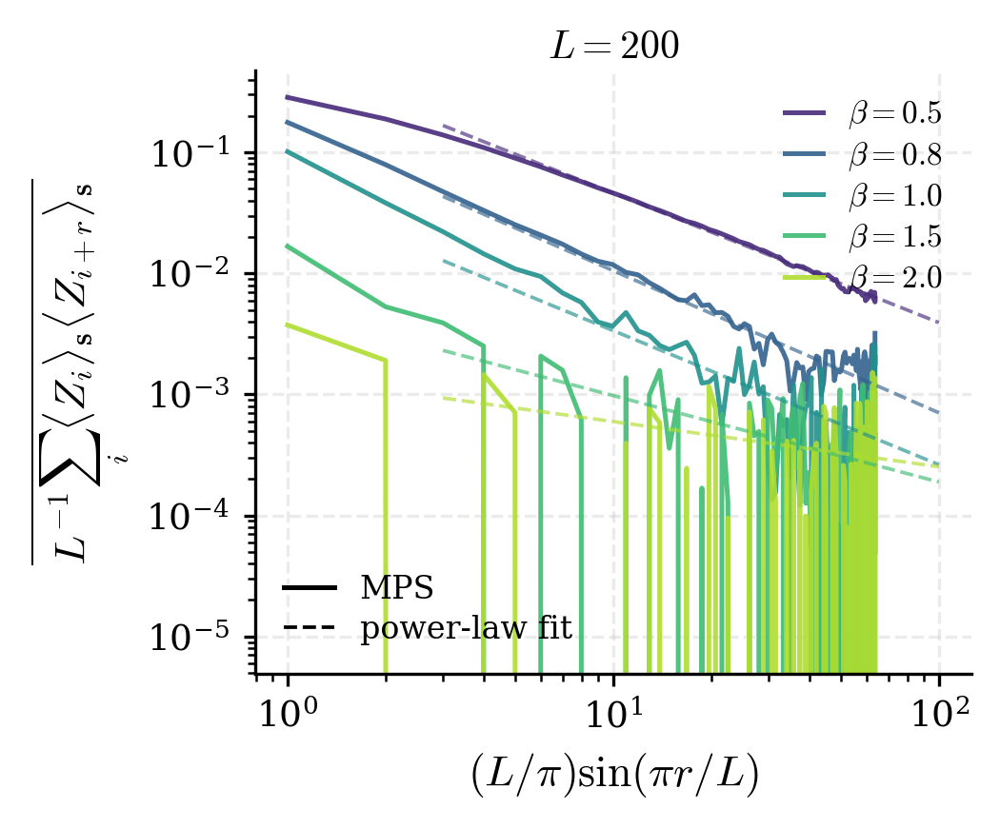

In [130]:
# Fixed-L beta sweep with spatial averaging and power-law fits.
from pathlib import Path

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman", "CMU Serif", "DejaVu Serif"],
    "mathtext.fontset": "cm",
    "font.size": 10,
    "axes.labelsize": 11,
    "legend.fontsize": 9,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
})


def spatial_average_corr_from_array(Z, q=1):
    """Snapshot average of L^{-1} sum_i <Z_i>_s <Z_{i+r}>_s with PBC."""
    Z = np.asarray(Z, dtype=np.float64)
    n_snapshots, L = Z.shape
    if q == 1:
        corr_by_snapshot = np.fft.ifft(np.abs(np.fft.fft(Z, axis=1)) ** 2, axis=1).real / L
    else:
        corr_by_snapshot = np.stack(
            [np.mean(np.power(Z * np.roll(Z, -r, axis=1), q), axis=1) for r in range(L)],
            axis=1,
        )
    return (
        np.mean(corr_by_snapshot, axis=0),
        np.std(corr_by_snapshot, axis=0, ddof=1) / np.sqrt(n_snapshots),
    )


def power_law_fit(x, y, fit_min=3.0, fit_max=None):
    """Fit y = a x^b on positive data in the selected x-window."""
    x = np.asarray(x, dtype=np.float64)
    y = np.asarray(y, dtype=np.float64)
    mask = np.isfinite(x) & np.isfinite(y) & (x > 0) & (y > 0) & (x >= fit_min)
    if fit_max is not None:
        mask &= x <= fit_max
    if np.count_nonzero(mask) < 2:
        return np.nan, np.nan
    b, log_a = np.polyfit(np.log(x[mask]), np.log(y[mask]), 1)
    return np.exp(log_a), b


L_fixed = 200
beta_list = [0.5, 0.8, 1.0, 1.5, 2.0]
beta_colors = plt.cm.viridis(np.linspace(0.12, 0.88, len(beta_list)))
fit_min = 3.0
fit_max = L_fixed / 2

fig, ax = plt.subplots(figsize=(3.6, 3.0), dpi=300)
fit_results = {}

for beta, color in zip(beta_list, beta_colors):
    Z_mps = np.load(f"../data/Fast_MPS_CritIsing_L{L_fixed}_beta{beta}_Zexp_uniform_N10000_0_r.npy")
    y_mps, _ = spatial_average_corr_from_array(Z_mps, q=1)

    r = np.arange(L_fixed)
    r_chord = L_fixed / np.pi * np.sin(np.pi * r / L_fixed)
    keep = slice(1, L_fixed // 2 + 1)
    x = r_chord[keep]
    y_mps_plot = y_mps[keep]

    a_mps, b_mps = power_law_fit(x, y_mps_plot, fit_min=fit_min, fit_max=fit_max)
    fit_results[beta] = {"MPS": (a_mps, b_mps)}
    print(f"beta={beta:.2f}: MPS exponent={b_mps:.4f}")

    ax.loglog(
        x,
        y_mps_plot,
        color=color,
        linewidth=1.2,
        alpha=0.9,
        zorder=2,
        label=fr"$\beta={beta}$",
    )

    x_fit = np.logspace(np.log10(fit_min), np.log10(fit_max), 100)
    if np.isfinite(a_mps) and np.isfinite(b_mps):
        ax.loglog(
            x_fit,
            a_mps * x_fit ** b_mps,
            color=color,
            linestyle="--",
            linewidth=0.9,
            alpha=0.65,
            zorder=4,
        )

ax.set_xlabel(r"$(L/\pi)\sin(\pi r/L)$")
ax.set_ylabel(r"$\overline{L^{-1}\sum_i \langle Z_i\rangle_{\mathbf{s}}\langle Z_{i+r}\rangle_{\mathbf{s}}}$")
ax.set_title(fr"$L={L_fixed}$", fontsize=10, pad=3)
ax.grid(axis="both", which="major", linestyle="--", alpha=0.25)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.tick_params(axis="both", labelsize=9, width=0.8, length=3)
# ax.set_ylim(8e-4, 1.2)

style_handles = [
    plt.Line2D([0], [0], color="black", linewidth=1.2, label="MPS"),
    plt.Line2D([0], [0], color="black", linestyle="--", linewidth=0.9, label="power-law fit"),
]
leg_style = ax.legend(handles=style_handles, frameon=False, loc="lower left", fontsize=8, handlelength=1.6, labelspacing=0.3)
ax.add_artist(leg_style)
ax.legend(frameon=False, loc="upper right", fontsize=8, handlelength=1.2, labelspacing=0.25)

fig.tight_layout()
plt.show()

# fig.savefig("figures/uniform_correlation_L100_beta_sweep_fits.pdf", dpi=300, bbox_inches="tight", pad_inches=0)


# Disconnected two-point function

/tmp/ipykernel_1613636/854223204.py:69: RuntimeWarning: divide by zero encountered in power
  return a * r_c**b + c


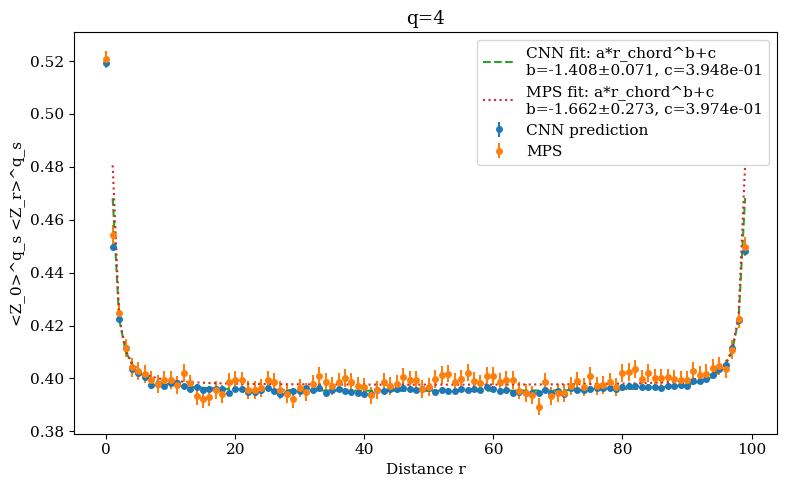

[0.5205767303831612, 0.4543590058368155, 0.42485074883479157, 0.41146297609816473, 0.40422986818255796, 0.4029001096657638, 0.4018032586145097, 0.39952399002624644, 0.39790160205828956, 0.3992418871160738, 0.3994099103869846, 0.3976604883741521, 0.40207033352608057, 0.39811627733072646, 0.39331473344988815, 0.3921736838315529, 0.39281313912186444, 0.39576643421668223, 0.39424443998775016, 0.39870418838402866, 0.39932400404412677, 0.39925044965408574, 0.39555831790217333, 0.3956284124417022, 0.3962973134774031, 0.3996103491079728, 0.3986576240351227, 0.3957977986857564, 0.3941893057917707, 0.3922992019361667, 0.39649690885153377, 0.39502349375946694, 0.39783489295297697, 0.40089687802835794, 0.3985061153870981, 0.39728409241446905, 0.39881798307923205, 0.40034991210036525, 0.39862470774746195, 0.3972883697271388, 0.3967280045110892, 0.3935702710331823, 0.39568986536914896, 0.39853948865163935, 0.3972313589309859, 0.39787941815952615, 0.40053504488274033, 0.3994919464926248, 0.3994684645

In [174]:
L = 100
beta = 0.5
r_list = np.arange(L)
r_chord = L / np.pi * np.sin(np.pi * r_list / L)
def nn_data(q=1):
    Y_pred = np.load(f"../data/dilatedcnn_sharedpbc_L{L}_beta{beta}_N100000_y_pred.npy")
    y = []
    y_std = []
    for r in r_list:
        vals = Y_pred[:, 0]**q * Y_pred[:, r]**q
        y.append(np.mean(vals))
        y_std.append(np.std(vals) / np.sqrt(Y_pred.shape[0]))
    return np.array(y), np.array(y_std)
def mps_data(q=1):
    Z = np.load(f"../data/Fast_MPS_CritIsing_L{L}_beta{beta}_Zexp_N10000_0_r.npy")
    vals = Z[:, :1]**q * Z**q
    y = np.mean(vals, axis=0)
    y_std = np.std(np.abs(vals), axis=0) / np.sqrt(Z.shape[0])
    return y, y_std
q = 4
y_nn, y_nn_std = nn_data(q)
y_mps, y_mps_std = mps_data(q)
plt.figure(figsize=(8, 5))
if q % 2 == 1:
    plt.errorbar(r_chord, y_nn, yerr=y_nn_std, fmt="o", markersize=4, label="CNN prediction")
    plt.errorbar(r_chord, y_mps, yerr=y_mps_std, fmt="o", markersize=4, label="MPS")
    fit_slice = slice(5, -5)
    x_fit = np.log(r_chord[fit_slice])
    # Weighted linear fit in log-log space using error bars.
    y_nn_fit = y_nn[fit_slice]
    s_nn_fit = np.maximum(y_nn_std[fit_slice], 1e-12)
    mask_nn = y_nn_fit > 0
    coef_nn, cov_nn = np.polyfit(
        x_fit[mask_nn],
        np.log(y_nn_fit[mask_nn]),
        deg=1,
        w=1.0 / np.maximum(s_nn_fit[mask_nn] / y_nn_fit[mask_nn], 1e-12),
        cov=True,
    )
    b_nn = coef_nn[0]
    b_nn_err = np.sqrt(cov_nn[0, 0])
    fitted_line_nn = np.exp(coef_nn[1]) * r_chord**b_nn
    plt.plot(r_chord, fitted_line_nn, linestyle="--", label=f"CNN fit: ~r^{b_nn:.3f}±{b_nn_err:.3f}")
    y_mps_fit = y_mps[fit_slice]
    s_mps_fit = np.maximum(y_mps_std[fit_slice], 1e-12)
    mask_mps = y_mps_fit > 0
    coef_mps, cov_mps = np.polyfit(
        x_fit[mask_mps],
        np.log(y_mps_fit[mask_mps]),
        deg=1,
        w=1.0 / np.maximum(s_mps_fit[mask_mps] / y_mps_fit[mask_mps], 1e-12),
        cov=True,
    )
    b_mps = coef_mps[0]
    b_mps_err = np.sqrt(cov_mps[0, 0])
    fitted_line_mps = np.exp(coef_mps[1]) * r_chord**b_mps
    plt.plot(r_chord, fitted_line_mps, linestyle=":", label=f"MPS fit: ~r^{b_mps:.3f}±{b_mps_err:.3f}")
    plt.xlabel("Distance r")
    plt.ylabel("<Z_0>^q_s <Z_r>^q_s")
    plt.title(f"q={q}")
    plt.xscale("log")
    plt.yscale("log")
    plt.legend()
else:
    plt.errorbar(r_list, y_nn, yerr=y_nn_std, fmt="o", markersize=4, label="CNN prediction")
    plt.errorbar(r_list, y_mps, yerr=y_mps_std, fmt="o", markersize=4, label="MPS")
    def fit_func(r, a, b, c):
        r_c = L / np.pi * np.sin(np.pi * r / L)
        return a * r_c**b + c
    from scipy.optimize import curve_fit
    fit_start, fit_end = 2, L - 1
    sigma_nn = np.maximum(y_nn_std[fit_start:fit_end], 1e-12)
    popt_nn, pcov_nn = curve_fit(
        fit_func,
        r_list[fit_start:fit_end],
        y_nn[fit_start:fit_end],
        sigma=sigma_nn,
        absolute_sigma=True,
        p0=(1, -0.25, 0),
        bounds=([0, -np.inf, 0], [np.inf, 0, np.inf]),
        maxfev=20000,
    )
    b_nn_err = np.sqrt(np.diag(pcov_nn))[1]
    fitted_line_nn = fit_func(r_list, *popt_nn)
    plt.plot(r_list, fitted_line_nn, linestyle="--", label=f"CNN fit: a*r_chord^b+c\nb={popt_nn[1]:.3f}±{b_nn_err:.3f}, c={popt_nn[2]:.3e}")
    sigma_mps = np.maximum(y_mps_std[fit_start:fit_end], 1e-12)
    popt_mps, pcov_mps = curve_fit(
        fit_func,
        r_list[fit_start:fit_end],
        y_mps[fit_start:fit_end],
        sigma=sigma_mps,
        absolute_sigma=True,
        p0=(1, -0.25, 0),
        bounds=([0, -np.inf, 0], [np.inf, 0, np.inf]),
        maxfev=20000,
    )
    b_mps_err = np.sqrt(np.diag(pcov_mps))[1]
    fitted_line_mps = fit_func(r_list, *popt_mps)
    plt.plot(r_list, fitted_line_mps, linestyle=":", label=f"MPS fit: a*r_chord^b+c\nb={popt_mps[1]:.3f}±{b_mps_err:.3f}, c={popt_mps[2]:.3e}")
    plt.xlabel("Distance r")
    plt.ylabel("<Z_0>^q_s <Z_r>^q_s")
    plt.title(f"q={q}")
    plt.legend()
plt.tight_layout()
plt.show()
print(y_mps.tolist())


In [182]:
def spatial_average_data_from_array(Z, q=1):
    """Average <Z_j>^q_s <Z_{j+r}>^q_s over snapshots and all spatial origins j."""
    Z = np.asarray(Z, dtype=np.float64)
    n_snapshots, L_data = Z.shape

    A = Z**q
    vals_by_r = np.fft.ifft(np.abs(np.fft.fft(A, axis=1)) ** 2, axis=1).real / L_data

    y = np.mean(vals_by_r, axis=0)
    y_std = np.std(vals_by_r, axis=0, ddof=1) / np.sqrt(n_snapshots)
    return y, y_std



def nn_data_spatial_average(L, beta, q=1):
    Y_pred = np.load(f"../data/dilatedcnn_sharedpbc_L{L}_beta{beta}_N100000_y_pred.npy")
    return spatial_average_data_from_array(Y_pred, q=q)


def mps_data_spatial_average(L, beta, q=1):
    Z = np.load(f"../data/Fast_MPS_CritIsing_L{L}_beta{beta}_Zexp_N10000_0_r.npy")
    return spatial_average_data_from_array(Z, q=q)


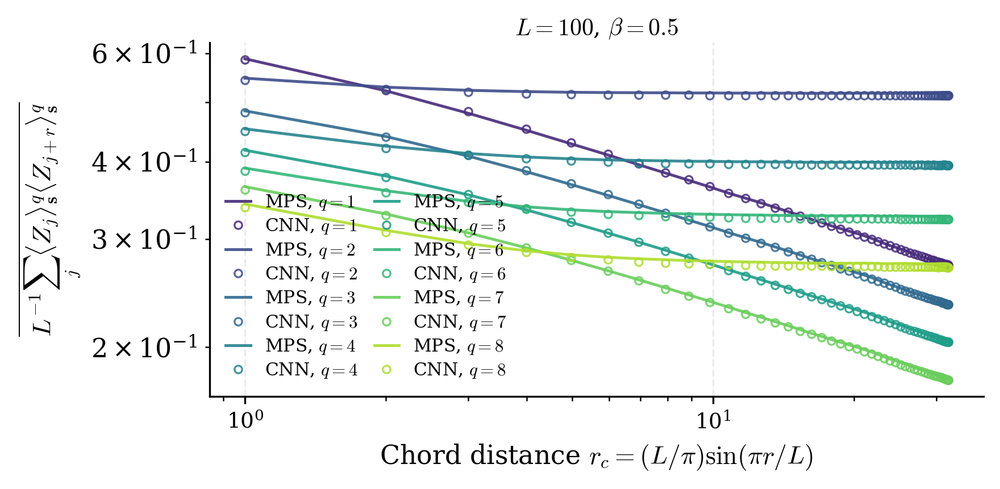

In [194]:
# Spatially averaged q-moment correlations for fixed L and beta.
L = 100
beta = 0.5
q_list = [1, 2, 3, 4, 5, 6, 7, 8]
r_list = np.arange(L)
r_chord = L / np.pi * np.sin(np.pi * r_list / L)
keep = slice(1, L // 2 + 1)

colors_q = plt.cm.viridis(np.linspace(0.12, 0.88, len(q_list)))
fig, ax = plt.subplots(figsize=(6,3), dpi=300)

for q, color in zip(q_list, colors_q):
    y_nn, y_nn_std = nn_data_spatial_average(L, beta, q=q)
    y_mps, y_mps_std = mps_data_spatial_average(L, beta, q=q)

    ax.plot(
        r_chord[keep],
        y_mps[keep],
        color=color,
        linewidth=1.2,
        alpha=0.9,
        label=fr"MPS, $q={q}$",
    )
    ax.plot(
        r_chord[keep],
        y_nn[keep],
        marker="o",
        linestyle="None",
        color=color,
        markerfacecolor="none",
        markeredgewidth=0.8,
        markersize=3.2,
        alpha=0.85,
        label=fr"CNN, $q={q}$",
    )

ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlabel(r"Chord distance $r_c=(L/\pi)\sin(\pi r/L)$")
ax.set_ylabel(r"$\overline{L^{-1}\sum_j \langle Z_j\rangle_{\mathbf{s}}^q\langle Z_{j+r}\rangle_{\mathbf{s}}^q}$")
ax.set_title(fr"$L={L}$, $\beta={beta}$", fontsize=10, pad=3)
ax.grid(axis="both", which="major", linestyle="--", alpha=0.25)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.tick_params(axis="both", labelsize=9, width=0.8, length=3)
ax.legend(frameon=False, fontsize=7.5, ncol=2, handlelength=1.4, columnspacing=0.9, labelspacing=0.3)
fig.tight_layout()
plt.show()


q=2: fitted d=1.7393, c=5.1700e-01
q=100: fitted d=2.5064, c=1.5104e-03


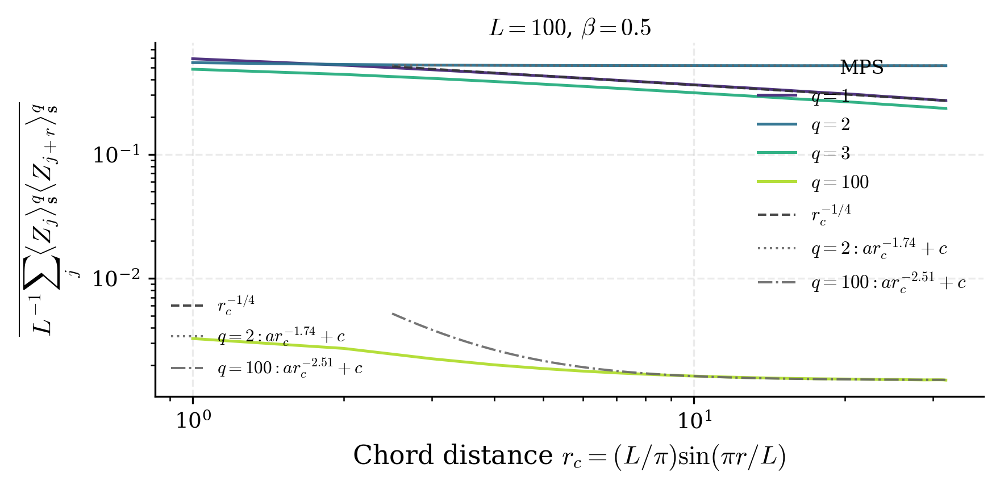

In [204]:
# Single-panel trial: q-moment spatial averages with asymptotic guide lines.
L = 100
beta = 0.5
q_list = [1, 2, 3, 100]
r_list = np.arange(L)
r_chord = L / np.pi * np.sin(np.pi * r_list / L)
keep = slice(1, L // 2 + 1)
x = r_chord[keep]

colors_q = plt.cm.viridis(np.linspace(0.12, 0.88, len(q_list)))
fig, ax = plt.subplots(figsize=(6, 3), dpi=300)

mps_curves = {}
for q, color in zip(q_list, colors_q):
    y_mps, y_mps_std = mps_data_spatial_average(L, beta, q=q)
    y_plot = y_mps[keep]
    mps_curves[q] = y_plot
    ax.plot(
        x,
        y_plot,
        color=color,
        linewidth=1.2,
        alpha=0.95,
        label=fr"$q={q}$",
    )

# Odd-q guide: expected r_c^{-1/4}. Anchor it near the q=1 curve.
guide_x = np.logspace(np.log10(max(2.5, x[1])), np.log10(x[-3]), 100)
anchor_x = 6.0
anchor_idx = int(np.argmin(np.abs(x - anchor_x)))
odd_amp = mps_curves[1][anchor_idx] * x[anchor_idx] ** 0.25
odd_guide, = ax.plot(
    guide_x,
    odd_amp * guide_x ** (-0.25),
    color="#333333",
    linestyle="--",
    linewidth=0.95,
    alpha=0.9,
    zorder=5,
    label=r"$r_c^{-1/4}$",
)

# Even-q guides: fit y = a r_c^{-d} + c and show the fitted correction-to-constant behavior.
even_guide_handles = []
fit_mask = (x >= 4.0) & (x <= x[-4])
even_q_list = [q for q in q_list if q % 2 == 0]
guide_styles = [":", "-.", (0, (3, 1, 1, 1)), (0, (1, 1))]
for q, style in zip(even_q_list, guide_styles):
    y = mps_curves[q]
    # Estimate c from the largest-distance tail, then fit log(y-c) to get d.
    c_est = float(np.median(y[-6:]))
    y_corr = y - c_est
    mask = fit_mask & np.isfinite(y_corr) & (y_corr > 0)
    if np.count_nonzero(mask) >= 3:
        slope, log_a = np.polyfit(np.log(x[mask]), np.log(y_corr[mask]), 1)
        d_fit = -slope
        a_fit = np.exp(log_a)
        guide, = ax.plot(
            guide_x,
            a_fit * guide_x ** (-d_fit) + c_est,
            color="#666666",
            linestyle=style,
            linewidth=0.95,
            alpha=0.9,
            zorder=5,
            label=fr"$q={q}: a r_c^{{-{d_fit:.2f}}}+c$",
        )
        even_guide_handles.append(guide)
        print(f"q={q}: fitted d={d_fit:.4f}, c={c_est:.4e}")

ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlabel(r"Chord distance $r_c=(L/\pi)\sin(\pi r/L)$")
ax.set_ylabel(r"$\overline{L^{-1}\sum_j \langle Z_j\rangle_{\mathbf{s}}^q\langle Z_{j+r}\rangle_{\mathbf{s}}^q}$")
ax.set_title(fr"$L={L}$, $\beta={beta}$", fontsize=10, pad=3)
ax.grid(axis="both", which="major", linestyle="--", alpha=0.25)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.tick_params(axis="both", labelsize=9, width=0.8, length=3)

leg_data = ax.legend(frameon=False, fontsize=8, loc="upper right", title="MPS", title_fontsize=8)
ax.add_artist(leg_data)
ax.legend(handles=[odd_guide] + even_guide_handles, frameon=False, fontsize=7.5, loc="lower left", handlelength=1.8)
fig.tight_layout()
plt.show()


q=2: derivative exponent p=5.9408; corresponding C_q exponent d=p-1=4.9408; fit points 5..11; r_c range 5.96..10.78; N_fit=6
q=4: derivative exponent p=4.4624; corresponding C_q exponent d=p-1=3.4624; fit points 5..11; r_c range 5.96..11.72; N_fit=7
q=6: derivative exponent p=3.7577; corresponding C_q exponent d=p-1=2.7577; fit points 5..11; r_c range 5.96..11.72; N_fit=7
q=8: derivative exponent p=3.4674; corresponding C_q exponent d=p-1=2.4674; fit points 5..11; r_c range 5.96..11.72; N_fit=7
q=10: derivative exponent p=3.3070; corresponding C_q exponent d=p-1=2.3070; fit points 5..11; r_c range 5.96..11.72; N_fit=7
q=20: derivative exponent p=3.0167; corresponding C_q exponent d=p-1=2.0167; fit points 5..11; r_c range 5.96..11.72; N_fit=7
q=40: derivative exponent p=2.8815; corresponding C_q exponent d=p-1=1.8815; fit points 5..11; r_c range 5.96..11.72; N_fit=7
q=80: derivative exponent p=2.7494; corresponding C_q exponent d=p-1=1.7494; fit points 5..11; r_c range 5.96..11.72; N_fi

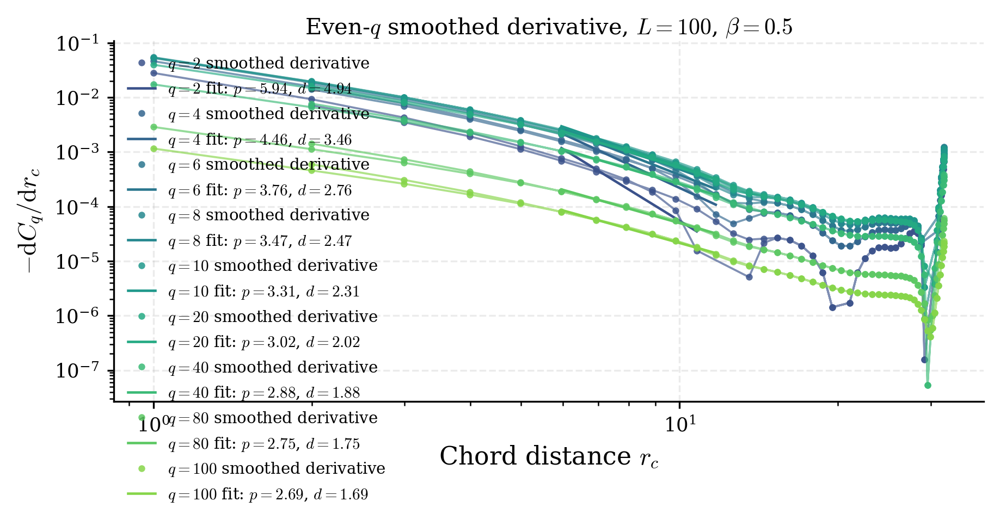

In [224]:
# Smoothed-derivative diagnostic for even-q curves: C_q(r_c) = c + a r_c^{-d} implies -dC_q/dr_c \propto r_c^{-(d+1)}.
import numpy as np
import matplotlib.pyplot as plt

def local_poly_fit_at_points(log_x, y, window=11, poly_order=3, derivative=False):
    """Local weighted polynomial fit in log_x; return smoothed values or dy/dlog_x."""
    log_x = np.asarray(log_x, dtype=float)
    y = np.asarray(y, dtype=float)
    n = len(log_x)
    window = min(window, n if n % 2 == 1 else n - 1)
    window = max(window, poly_order + 2)
    if window % 2 == 0:
        window += 1
    half = window // 2
    out = np.empty(n)

    for i in range(n):
        lo = max(0, i - half)
        hi = min(n, i + half + 1)
        if hi - lo < window:
            if lo == 0:
                hi = min(n, window)
            else:
                lo = max(0, n - window)

        t = log_x[lo:hi] - log_x[i]
        y_local = y[lo:hi]
        degree = min(poly_order, len(t) - 1)
        bandwidth = np.max(np.abs(t))
        weights = np.ones_like(t) if bandwidth == 0 else np.exp(-0.5 * (t / (0.55 * bandwidth)) ** 2)
        coeff = np.polyfit(t, y_local, degree, w=weights)
        out[i] = coeff[-2] if derivative and degree >= 1 else coeff[-1]

    return out

L = 100
beta = 0.5
q_list = [2, 4, 6, 8, 10, 20, 40, 80, 100]
q_source_list = globals().get("q_list", [2, 4])
q_even_list = [q for q in q_source_list if q % 2 == 0]

r_list = np.arange(L)
r_chord = L / np.pi * np.sin(np.pi * r_list / L)
keep = slice(1, L -1)
x = r_chord[keep]

# Tune these to check denoising and fit-window stability.
# Denoise first with a wider, low-order local polynomial; then differentiate the denoised curve.
denoise_window = 21
denoise_order = 2
derivative_window = 9
derivative_order = 2
fit_start_idx = 5
fit_stop_idx = 11  # inclusive

colors_even = plt.cm.viridis(np.linspace(0.25, 0.82, len(q_even_list)))
fig, ax = plt.subplots(figsize=(6, 3), dpi=300)

for q, color in zip(q_even_list, colors_even):
    y_mps, y_mps_std = mps_data_spatial_average(L, beta, q=q)
    y = y_mps[keep]

    # First denoise C_q(log r_c), then estimate the derivative of the denoised curve.
    log_x = np.log(x)
    y_denoised = local_poly_fit_at_points(
        log_x,
        y,
        window=denoise_window,
        poly_order=denoise_order,
        derivative=False,
    )
    dy_dlogx = local_poly_fit_at_points(
        log_x,
        y_denoised,
        window=derivative_window,
        poly_order=derivative_order,
        derivative=True,
    )
    minus_dy = -dy_dlogx / x

    fit_mask = np.zeros_like(x, dtype=bool)
    fit_mask[fit_start_idx:fit_stop_idx + 1] = True
    fit_mask &= np.isfinite(minus_dy) & (minus_dy > 0)
    positive_mask = np.isfinite(minus_dy) & (minus_dy > 0)
    ax.plot(
        x[positive_mask],
        minus_dy[positive_mask],
        color=color,
        linewidth=0.9,
        alpha=0.65,
    )
    ax.plot(
        x[positive_mask],
        minus_dy[positive_mask],
        "o",
        color=color,
        markersize=3.0,
        markeredgewidth=0.0,
        alpha=0.85,
        label=fr"$q={q}$ smoothed derivative",
    )

    if np.count_nonzero(fit_mask) >= 4:
        slope, log_amp = np.polyfit(np.log(x[fit_mask]), np.log(minus_dy[fit_mask]), 1)
        p_fit = -slope
        d_fit = p_fit - 1.0
        amp_fit = np.exp(log_amp)
        fit_x = np.logspace(np.log10(x[fit_mask][0]), np.log10(x[fit_mask][-1]), 100)
        ax.plot(
            fit_x,
            amp_fit * fit_x ** (-p_fit),
            color=color,
            linestyle="-",
            linewidth=1.1,
            label=fr"$q={q}$ fit: $p={p_fit:.2f}$, $d={d_fit:.2f}$",
        )
        print(
            f"q={q}: derivative exponent p={p_fit:.4f}; "
            f"corresponding C_q exponent d=p-1={d_fit:.4f}; "
            f"fit points {fit_start_idx}..{fit_stop_idx}; "
            f"r_c range {x[fit_mask][0]:.2f}..{x[fit_mask][-1]:.2f}; "
            f"N_fit={np.count_nonzero(fit_mask)}"
        )
    else:
        print(f"q={q}: not enough positive smoothed-derivative points in the fit window")

ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlabel(r"Chord distance $r_c$")
ax.set_ylabel(r"$-\mathrm{d}C_q/\mathrm{d}r_c$")
ax.set_title(fr"Even-$q$ smoothed derivative, $L={L}$, $\beta={beta}$", fontsize=10, pad=3)
ax.grid(axis="both", which="major", linestyle="--", alpha=0.25)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.tick_params(axis="both", labelsize=8.5, width=0.8, length=3)
ax.legend(frameon=False, fontsize=7, loc="best", handlelength=1.7)
fig.tight_layout(pad=0.25)
plt.show()


Parameter scan: L=100, beta=0.5
denoise_windows=[15, 21, 27, 33], derivative_windows=[7, 9, 11], fit_ranges=[(4, 10), (5, 11), (6, 12)], poly_orders=[2, 3]
q=2: n=72, median d=2.687, 16-84%=[1.733, 3.600], min=0.821, max=6.989
q=4: n=72, median d=2.022, 16-84%=[1.682, 2.464], min=1.320, max=5.688
q=6: n=72, median d=1.884, 16-84%=[1.649, 2.134], min=1.407, max=3.887
q=8: n=72, median d=1.832, 16-84%=[1.591, 2.002], min=1.352, max=3.338
q=10: n=72, median d=1.793, 16-84%=[1.576, 1.968], min=1.317, max=3.060
q=20: n=72, median d=1.669, 16-84%=[1.499, 1.921], min=1.245, max=2.590
q=40: n=72, median d=1.613, 16-84%=[1.441, 1.847], min=1.203, max=2.373
q=80: n=72, median d=1.532, 16-84%=[1.385, 1.732], min=1.158, max=2.164
q=100: n=72, median d=1.501, 16-84%=[1.358, 1.685], min=1.133, max=2.081


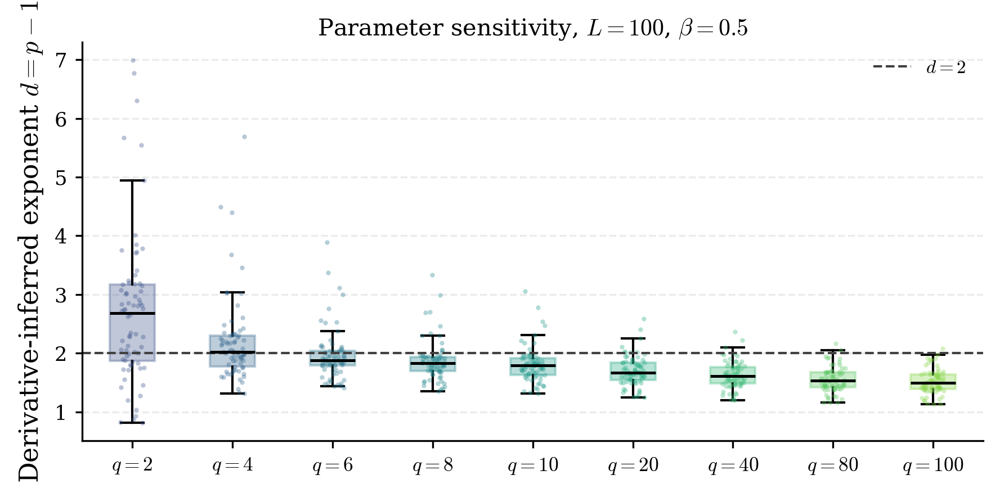

In [225]:
# Parameter scan for the even-q derivative exponent.
# This checks whether the inferred correction exponent is stable under reasonable denoising choices.
import numpy as np
import matplotlib.pyplot as plt

if "local_poly_fit_at_points" not in globals():
    def local_poly_fit_at_points(log_x, y, window=11, poly_order=3, derivative=False):
        """Local weighted polynomial fit in log_x; return smoothed values or dy/dlog_x."""
        log_x = np.asarray(log_x, dtype=float)
        y = np.asarray(y, dtype=float)
        n = len(log_x)
        window = min(window, n if n % 2 == 1 else n - 1)
        window = max(window, poly_order + 2)
        if window % 2 == 0:
            window += 1
        half = window // 2
        out = np.empty(n)

        for i in range(n):
            lo = max(0, i - half)
            hi = min(n, i + half + 1)
            if hi - lo < window:
                if lo == 0:
                    hi = min(n, window)
                else:
                    lo = max(0, n - window)

            t = log_x[lo:hi] - log_x[i]
            y_local = y[lo:hi]
            degree = min(poly_order, len(t) - 1)
            bandwidth = np.max(np.abs(t))
            weights = np.ones_like(t) if bandwidth == 0 else np.exp(-0.5 * (t / (0.55 * bandwidth)) ** 2)
            coeff = np.polyfit(t, y_local, degree, w=weights)
            out[i] = coeff[-2] if derivative and degree >= 1 else coeff[-1]

        return out

L_scan = globals().get("L", 100)
beta_scan = globals().get("beta", 0.5)
q_scan_list = [q for q in globals().get("q_list", [2, 4, 6, 10, 20]) if q % 2 == 0]

denoise_windows = [15, 21, 27, 33]
derivative_windows = [7, 9, 11]
fit_ranges = [(4, 10), (5, 11), (6, 12)]
poly_orders = [2, 3]

r_list_scan = np.arange(L_scan)
r_chord_scan = L_scan / np.pi * np.sin(np.pi * r_list_scan / L_scan)
keep_scan = slice(1, L_scan // 2 + 1)
x_scan = r_chord_scan[keep_scan]
log_x_scan = np.log(x_scan)

curves_scan = {}
for q in q_scan_list:
    y_mps, _ = mps_data_spatial_average(L_scan, beta_scan, q=q)
    curves_scan[q] = y_mps[keep_scan]

def fit_derivative_exponent_scan(y, denoise_window, derivative_window, poly_order, fit_start_idx, fit_stop_idx):
    y_denoised = local_poly_fit_at_points(
        log_x_scan,
        y,
        window=denoise_window,
        poly_order=poly_order,
        derivative=False,
    )
    dy_dlogx = local_poly_fit_at_points(
        log_x_scan,
        y_denoised,
        window=derivative_window,
        poly_order=poly_order,
        derivative=True,
    )
    minus_dy = -dy_dlogx / x_scan
    fit_mask = np.zeros_like(x_scan, dtype=bool)
    fit_mask[fit_start_idx:fit_stop_idx + 1] = True
    fit_mask &= np.isfinite(minus_dy) & (minus_dy > 0)
    if np.count_nonzero(fit_mask) < 4:
        return None

    slope, log_amp = np.polyfit(np.log(x_scan[fit_mask]), np.log(minus_dy[fit_mask]), 1)
    p_fit = -slope
    d_fit = p_fit - 1.0
    return {
        "p": p_fit,
        "d": d_fit,
        "denoise_window": denoise_window,
        "derivative_window": derivative_window,
        "poly_order": poly_order,
        "fit_start_idx": fit_start_idx,
        "fit_stop_idx": fit_stop_idx,
        "n_fit": int(np.count_nonzero(fit_mask)),
        "r_min": float(x_scan[fit_mask][0]),
        "r_max": float(x_scan[fit_mask][-1]),
    }

scan_results = {q: [] for q in q_scan_list}
for q in q_scan_list:
    y = curves_scan[q]
    for denoise_window in denoise_windows:
        for derivative_window in derivative_windows:
            for fit_start_idx, fit_stop_idx in fit_ranges:
                for poly_order in poly_orders:
                    result = fit_derivative_exponent_scan(
                        y,
                        denoise_window=denoise_window,
                        derivative_window=derivative_window,
                        poly_order=poly_order,
                        fit_start_idx=fit_start_idx,
                        fit_stop_idx=fit_stop_idx,
                    )
                    if result is not None:
                        scan_results[q].append(result)

print(f"Parameter scan: L={L_scan}, beta={beta_scan}")
print(f"denoise_windows={denoise_windows}, derivative_windows={derivative_windows}, fit_ranges={fit_ranges}, poly_orders={poly_orders}")
for q, results in scan_results.items():
    d_vals = np.array([res["d"] for res in results])
    if len(d_vals) == 0:
        print(f"q={q}: no successful fits")
        continue
    q16, q50, q84 = np.percentile(d_vals, [16, 50, 84])
    print(
        f"q={q}: n={len(d_vals)}, median d={q50:.3f}, "
        f"16-84%=[{q16:.3f}, {q84:.3f}], min={d_vals.min():.3f}, max={d_vals.max():.3f}"
    )

fig, ax = plt.subplots(figsize=(5.8, 2.8), dpi=300)
positions = np.arange(len(q_scan_list))
box_data = [np.array([res["d"] for res in scan_results[q]]) for q in q_scan_list]
box = ax.boxplot(
    box_data,
    positions=positions,
    widths=0.45,
    patch_artist=True,
    showfliers=False,
    medianprops={"color": "black", "linewidth": 1.2},
)
colors = plt.cm.viridis(np.linspace(0.25, 0.82, len(q_scan_list)))
for patch, color in zip(box["boxes"], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.32)
    patch.set_edgecolor(color)

rng = np.random.default_rng(0)
for pos, q, color in zip(positions, q_scan_list, colors):
    d_vals = np.array([res["d"] for res in scan_results[q]])
    jitter = rng.uniform(-0.12, 0.12, size=len(d_vals))
    ax.plot(
        pos + jitter,
        d_vals,
        "o",
        color=color,
        markersize=2.0,
        alpha=0.35,
        markeredgewidth=0,
    )

ax.axhline(2.0, color="0.25", linestyle="--", linewidth=1.0, label=r"$d=2$")
ax.set_xticks(positions)
ax.set_xticklabels([fr"$q={q}$" for q in q_scan_list])
ax.set_ylabel(r"Derivative-inferred exponent $d=p-1$")
ax.set_title(fr"Parameter sensitivity, $L={L_scan}$, $\beta={beta_scan}$", fontsize=10, pad=3)
ax.grid(axis="y", linestyle="--", alpha=0.25)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.tick_params(axis="both", labelsize=8.5, width=0.8, length=3)
ax.legend(frameon=False, fontsize=8, loc="best")
fig.tight_layout(pad=0.25)
plt.show()


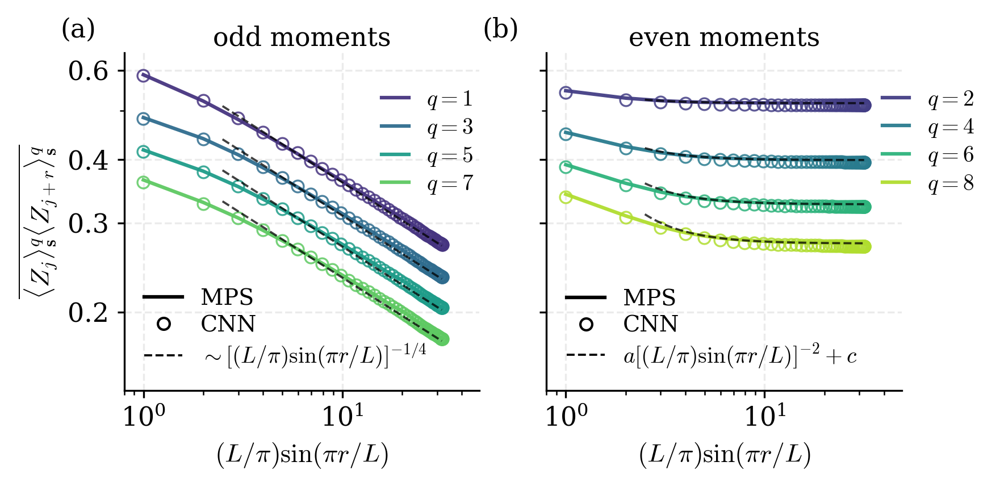

In [270]:
# Paper-style original q-moment curves: odd and even q shown separately.
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator, FixedFormatter

L = 100
beta = 0.5
q_odd_list = [1, 3, 5, 7]
q_even_list = [2, 4, 6, 8]

r_list = np.arange(L)
r_chord = L / np.pi * np.sin(np.pi * r_list / L)
keep = slice(1, L // 2 + 1)
x = r_chord[keep]

with plt.rc_context({
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman", "CMU Serif", "DejaVu Serif"],
    "font.size": 11,
    "axes.labelsize": 11,
    "axes.titlesize": 11,
    "legend.fontsize": 11,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
    "mathtext.fontset": "cm",
}):
    fig, (ax_odd, ax_even) = plt.subplots(
        1,
        2,
        figsize=(6, 3),
        dpi=300,
        sharex=True,
        sharey=True,
    )

    odd_colors = plt.cm.viridis(np.linspace(0.15, 0.75, len(q_odd_list)))
    even_colors = plt.cm.viridis(np.linspace(0.18, 0.88, len(q_even_list)))
    odd_handles = []
    even_handles = []

    # Odd q: expected algebraic decay C_q(r_c) ~ r_c^{-1/4}.
    guide_x = np.logspace(np.log10(max(2.5, x[1])), np.log10(x[-4]), 120)
    anchor_x = 6.0
    anchor_idx = int(np.argmin(np.abs(x - anchor_x)))
    for q, color in zip(q_odd_list, odd_colors):
        y_mps, _ = mps_data_spatial_average(L, beta, q=q)
        y = y_mps[keep]
        positive = np.isfinite(y) & (y > 0)
        data_line, = ax_odd.loglog(
            x[positive],
            y[positive],
            color=color,
            linewidth=1.5,
            alpha=0.95,
            label=fr"$q={q}$",
        )
        odd_handles.append(data_line)

        y_cnn, _ = nn_data_spatial_average(L, beta, q=q)
        y_cnn = y_cnn[keep]
        positive_cnn = np.isfinite(y_cnn) & (y_cnn > 0)
        ax_odd.loglog(
            x[positive_cnn],
            y_cnn[positive_cnn],
            "o",
            color=color,
            markerfacecolor="none",
            markeredgewidth=0.8,
            markersize=5.0,
            alpha=0.85,
            linestyle="None",
            zorder=4,
        )

        amp = y[anchor_idx] * x[anchor_idx] ** 0.25
        ax_odd.loglog(
            guide_x,
            amp * guide_x ** (-0.25),
            color='black',#color,
            linestyle="--",
            linewidth=0.9,
            alpha=0.75,
            zorder=5,
        )

    # Even q: show the original curves approaching a long-distance plateau.
    for q, color in zip(q_even_list, even_colors):
        y_mps, _ = mps_data_spatial_average(L, beta, q=q)
        y = y_mps[keep]
        positive = np.isfinite(y) & (y > 0)
        data_line, = ax_even.loglog(
            x[positive],
            y[positive],
            color=color,
            linewidth=1.5,
            alpha=0.95,
            label=fr"$q={q}$",
        )
        even_handles.append(data_line)

        y_cnn, _ = nn_data_spatial_average(L, beta, q=q)
        y_cnn = y_cnn[keep]
        positive_cnn = np.isfinite(y_cnn) & (y_cnn > 0)
        ax_even.loglog(
            x[positive_cnn],
            y_cnn[positive_cnn],
            "o",
            color=color,
            markerfacecolor="none",
            markeredgewidth=0.8,
            markersize=5.0,
            alpha=0.85,
            linestyle="None",
            zorder=4,
        )

        c_est = float(np.median(y[-6:]))
        guide_anchor_idx = int(np.argmin(np.abs(x - anchor_x)))
        amp = (y[guide_anchor_idx] - c_est) * x[guide_anchor_idx] ** 2
        if amp > 0:
            ax_even.loglog(
                guide_x,
                c_est + amp * guide_x ** (-2),
                color='black', #color,
                linestyle="--",
                linewidth=0.9,
                alpha=0.75,
                zorder=5,
            )

    for ax, panel, title in [
        (ax_odd, "(a)", "odd moments"),
        (ax_even, "(b)", "even moments"),
    ]:
        ax.set_xlabel(r"$(L/\pi)\sin(\pi r/L)$")
        ax.set_title(title, pad=3)
        ax.grid(True, axis="both", which="major", linestyle="--", alpha=0.25)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.tick_params(axis="both", labelsize=11, width=0.8, length=3)
        ax.text(-0.18, 1.03, panel, transform=ax.transAxes, fontsize=11, va="bottom", ha="left")

    ax_odd.set_ylabel(r"$\overline{\langle Z_j\rangle^q_\mathbf{s}\langle Z_{j+r}\rangle^q_\mathbf{s}}$")
    ax_even.set_ylabel("")
    ax_odd.set_ylim(0.14, 0.65)
    ax_odd.yaxis.set_major_locator(FixedLocator([0.1, 0.2, 0.3, 0.4, 0.6]))
    ax_odd.yaxis.set_major_formatter(FixedFormatter(["0.1", "0.2", "0.3", "0.4", "0.6"]))
    ax_even.yaxis.set_major_locator(FixedLocator([0.1, 0.2, 0.3, 0.4, 0.6]))
    ax_even.yaxis.set_major_formatter(FixedFormatter(["0.1", "0.2", "0.3", "0.4", "0.6"]))

    style_handles_odd = [
        plt.Line2D([0], [0], color="black", linewidth=1.5, label="MPS"),
        plt.Line2D([0], [0], marker="o", linestyle="None", color="black", markerfacecolor="none", markersize=5.0, label="CNN"),
        plt.Line2D([0], [0], color="black", linestyle="--", linewidth=0.9, label=r"$\sim[(L/\pi)\sin(\pi r/L)]^{-1/4}$"),
    ]
    leg_style_odd = ax_odd.legend(
        handles=style_handles_odd,
        frameon=False,
        loc="lower left",
        fontsize=9.5,
        handlelength=1.7,
        labelspacing=0.25,
    )
    ax_odd.add_artist(leg_style_odd)
    ax_odd.legend(
        handles=odd_handles,
        frameon=False,
        loc=(0.7, 0.55),
        fontsize=9.5,
        handlelength=1.2,
        labelspacing=0.25,
    )

    style_handles_even = [
        plt.Line2D([0], [0], color="black", linewidth=1.5, label="MPS"),
        plt.Line2D([0], [0], marker="o", linestyle="None", color="black", markerfacecolor="none", markersize=5.0, label="CNN"),
        plt.Line2D([0], [0], color="black", linestyle="--", linewidth=0.9, label=r"$a [(L/\pi)\sin(\pi r/L)]^{-2} + c$"),
    ]
    leg_style_even = ax_even.legend(
        handles=style_handles_even,
        frameon=False,
        loc="lower left",
        fontsize=9.5,
        handlelength=1.7,
        labelspacing=0.25,
    )
    ax_even.add_artist(leg_style_even)
    ax_even.legend(
        handles=even_handles,
        frameon=False,
        loc=(0.92, 0.55),
        fontsize=9.5,
        handlelength=1.2,
        labelspacing=0.25,
    )
    ax_even.set_xlim(0.8, 49)

    fig.tight_layout(w_pad=0.0)
    plt.show()
fig.savefig("figures/spatial_average_q_moments.pdf", bbox_inches="tight", pad_inches=0)

# TEST

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator, FixedFormatter
import warnings
from pathlib import Path
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.exceptions import ConvergenceWarning
import matplotlib.pyplot as plt

def TrainModels(L, beta, train_sizes=[80000], save_ckpts=False):
    try:
        anc_path = Path(f"../data/Fast_CritIsing_L{L}_beta{beta}_Zoutcomes_anc.npy")
        if not anc_path.exists():
            anc_path = Path(f"../data/Fast_CritIsing_L{L}_beta{beta}_Zoutcomes_anc_1e6.npy")
        sys_path = Path(f"../data/Fast_CritIsing_L{L}_beta{beta}_Zoutcomes_sys.npy")
        if not sys_path.exists():
            sys_path = Path(f"../data/Fast_CritIsing_L{L}_beta{beta}_Zoutcomes_sys_1e6.npy")
        X = np.load(anc_path)[:100000] # shape: (N, L), where N is the number of snapshots and L is the system size
        Y = np.load(sys_path)[:100000] # shape: (N, L), where N is the number of snapshots and L is the system size
        N = X.shape[0] # number of snapshots
        Zexp = np.load(f"../data/Fast_MPS_CritIsing_L{L}_beta{beta}_Zexp_N10000_0_r.npy")
        MSE_true = 1 - np.mean(Zexp ** 2)
        MSE_true_std = np.std(1 - Zexp ** 2) / np.sqrt(Zexp.shape[0])
        print(f"True MSE (using Zexp): {MSE_true:.6f} ± {MSE_true_std:.6f}")
    except Exception as e:
        print(f"Error loading data: {e}")
        return None, None, None, None, None, None, None, None

    # 3-model comparison with error bars from per-snapshot MSE standard error.
    seed_curve = 0
    rng = np.random.default_rng(seed_curve)
    X_np = np.asarray(X, dtype=np.float32)
    Y_np = np.asarray(Y, dtype=np.float32)
    if X_np.shape != Y_np.shape:
        raise ValueError(f"Shape mismatch: X{X_np.shape} vs Y{Y_np.shape}")
    if X_np.ndim != 2:
        raise ValueError(f"Expected X, Y with shape (N, L), got X{X_np.shape}")
    N_samples, L_data = X_np.shape
    perm = rng.permutation(N_samples)
    n_val = max(1, int(0.2 * N_samples))
    val_idx = perm[:n_val]
    train_pool_idx = perm[n_val:]
    n_train_pool = train_pool_idx.shape[0]
    X_val = X_np[val_idx]
    Y_val = Y_np[val_idx]
    train_sizes_err = train_sizes # 2, 5, 10, 20, 40, 80, 160, 320, 640, 1280, 2560, 5120, 10240, 20480, 40960, 80000
    train_sizes_err = [n for n in train_sizes_err if n <= n_train_pool]
    if len(train_sizes_err) == 0:
        raise ValueError(f"No valid train sizes. Train pool size is {n_train_pool}.")
    use_pbc_shared_baselines = True
    beta_tag = str(beta).replace(".", "p")
    ckpt_root = Path("figures") / "trainmodels_checkpoints" / f"L{L}_beta{beta_tag}"
    if save_ckpts:
        ckpt_root.mkdir(parents=True, exist_ok=True)
    model_names = ["Linear", "Logistic", "CNN"]
    train_mean = {name: [] for name in model_names}
    train_se = {name: [] for name in model_names}
    val_mean = {name: [] for name in model_names}
    val_se = {name: [] for name in model_names}

    def mse_mean_se(y_true, y_pred):
        # Per-snapshot MSE: average over sites first, then estimate mean and SE over snapshots.
        m = np.mean((y_pred - y_true) ** 2, axis=1)
        mu = float(np.mean(m))
        se = float(np.std(m, ddof=1) / np.sqrt(m.shape[0])) if m.shape[0] > 1 else 0.0
        return mu, se

    for n_train in train_sizes_err:
        sub_idx = train_pool_idx[:n_train]
        X_train = X_np[sub_idx]
        Y_train = Y_np[sub_idx]
        models = {
            "Linear": myLinearRegressionModel(
                fit_intercept=True,
                pbc_augment=False,
                pbc_shared=use_pbc_shared_baselines,
                augment_z2=True,
                seed=seed_curve,
                verbose=0,
            ),
            "Logistic": myLogisticRegressionModel(
                solver="lbfgs",
                C=1.0,
                max_iter=400,
                fit_intercept=True,
                pbc_augment=False,
                pbc_shared=use_pbc_shared_baselines,
                augment_z2=True,
                seed=seed_curve,
                verbose=0,
            ),
            "CNN": dilatedCNNModel(
                hidden_channels=64,
                kernel_size=3,
                dilation_base=2,
                num_blocks=None,
                lr=1e-3,
                batch_size=256,
                epochs=20,
                augment_z2=True,
                seed=seed_curve,
                verbose=0,
            ),
        }
        for name in model_names:
            mdl = models[name]
            mdl.fit(X_train, Y_train, val_data=(X_val, Y_val), plot=False)
            y_train_pred = mdl.predict_magnetization(X_train)
            y_val_pred = mdl.predict_magnetization(X_val)
            mu_tr, se_tr = mse_mean_se(Y_train, y_train_pred)
            mu_va, se_va = mse_mean_se(Y_val, y_val_pred)
            train_mean[name].append(mu_tr)
            train_se[name].append(se_tr)
            val_mean[name].append(mu_va)
            val_se[name].append(se_va)
            if save_ckpts:
                run_dir = ckpt_root / f"ntrain_{n_train}"
                run_dir.mkdir(parents=True, exist_ok=True)
                suffix = ".pt" if name == "CNN" else ".pkl"
                ckpt_path = run_dir / f"{name.lower()}_model{suffix}"
                mdl.save(
                    ckpt_path,
                    extra={
                        "L": L,
                        "beta": beta,
                        "seed": seed_curve,
                        "n_train": n_train,
                        "n_val": int(X_val.shape[0]),
                        "train_idx": sub_idx.tolist(),
                        "val_idx": val_idx.tolist(),
                        "train_mse_mean": mu_tr,
                        "train_mse_se": se_tr,
                        "val_mse_mean": mu_va,
                        "val_mse_se": se_va,
                        "true_mse_mean": float(MSE_true),
                        "true_mse_se": float(MSE_true_std),
                    },
                )
        print(
            f"n_train={n_train:6d} | "
            f"Linear train={train_mean['Linear'][-1]:.6f}±{train_se['Linear'][-1]:.6f}, val={val_mean['Linear'][-1]:.6f}±{val_se['Linear'][-1]:.6f} | "
            f"Logistic train={train_mean['Logistic'][-1]:.6f}±{train_se['Logistic'][-1]:.6f}, val={val_mean['Logistic'][-1]:.6f}±{val_se['Logistic'][-1]:.6f} | "
            f"CNN train={train_mean['CNN'][-1]:.6f}±{train_se['CNN'][-1]:.6f}, val={val_mean['CNN'][-1]:.6f}±{val_se['CNN'][-1]:.6f}"
        )

    return {
        "true_mse_mean": float(MSE_true),
        "true_mse_se": float(MSE_true_std),
        "train_sizes": train_sizes_err,
        "train_mean": train_mean,
        "train_se": train_se,
        "val_mean": val_mean,
        "val_se": val_se,
        "checkpoint_root": str(ckpt_root) if save_ckpts else None,
    }


In [57]:
TrainModels(20, 0.1, train_sizes=[80000], save_ckpts=True)

True MSE (using Zexp): 0.842106 ± 0.001576
n_train= 80000 | Linear train=0.842361±0.001358, val=0.845129±0.002688 | Logistic train=0.840334±0.001412, val=0.843118±0.002799 | CNN train=0.839685±0.001458, val=0.842881±0.002895


{'true_mse_mean': 0.8421061365473848,
 'true_mse_se': 0.001576334472593279,
 'train_sizes': [80000],
 'train_mean': {'Linear': [0.8423605222044688],
  'Logistic': [0.8403337001800537],
  'CNN': [0.8396845459938049]},
 'train_se': {'Linear': [0.0013581030007734393],
  'Logistic': [0.0014121039229443065],
  'CNN': [0.0014579699147349232]},
 'val_mean': {'Linear': [0.845128624942532],
  'Logistic': [0.8431181907653809],
  'CNN': [0.8428806662559509]},
 'val_se': {'Linear': [0.0026884286987103917],
  'Logistic': [0.002799234573740453],
  'CNN': [0.0028945328129084355]},
 'checkpoint_root': 'figures/trainmodels_checkpoints/L20_beta0p1'}

In [102]:
for beta in [0.1, 0.2, 0.3]:
    for L in [20, 40, 60, 100, 200]:
        print(f"Training models for L={L}, beta={beta}...")
        TrainModels(L, beta, train_sizes=[80000], save_ckpts=True)

Training models for L=20, beta=0.1...
True MSE (using Zexp): 0.842106 ± 0.001576
n_train= 80000 | Linear train=0.842361±0.001358, val=0.845129±0.002688 | Logistic train=0.840334±0.001412, val=0.843118±0.002799 | CNN train=0.839685±0.001458, val=0.842881±0.002895
Training models for L=40, beta=0.1...
True MSE (using Zexp): 0.803929 ± 0.001794
n_train= 80000 | Linear train=0.807769±0.001156, val=0.810702±0.002310 | Logistic train=0.803998±0.001224, val=0.806896±0.002447 | CNN train=0.802971±0.001350, val=0.806297±0.002707
Training models for L=60, beta=0.1...
True MSE (using Zexp): 0.782952 ± 0.001877
n_train= 80000 | Linear train=0.787971±0.001017, val=0.790478±0.002053 | Logistic train=0.782921±0.001083, val=0.785534±0.002186 | CNN train=0.780913±0.001223, val=0.784487±0.002470
Training models for L=100, beta=0.1...
True MSE (using Zexp): 0.758946 ± 0.001957
n_train= 80000 | Linear train=0.769606±0.000840, val=0.771864±0.001694 | Logistic train=0.763266±0.000896, val=0.765625±0.001808 

In [ ]:
for beta in [0.5]:
    for L in [20, 40, 60, 100, 200]:
        print(f"Training models for L={L}, beta={beta}...")
        TrainModels(L, beta, train_sizes=[2, 5, 10, 20, 40, 80, 160, 320, 640, 1280, 2560, 5120, 10240, 20480, 40960, 80000, 100000-2], save_ckpts=True)